# AI Engineer - P7 - Réalisez une analyse de sentiments grâce au Deep Learning

# 1. Importation des modules

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import concurrent.futures
from tqdm import tqdm

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.manifold import TSNE
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import accuracy_score, recall_score, f1_score, roc_auc_score

from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC, SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
import itertools

import pickle

from sklearn.metrics import roc_curve, confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay

In [2]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Bidirectional, Dropout
from tensorflow.keras.optimizers import Adam, RMSprop
from scikeras.wrappers import KerasClassifier
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [3]:
import re 
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk import word_tokenize
from nltk.stem import PorterStemmer

from wordcloud import WordCloud

import nltk
from nltk.data import find

def download_package(package_name):
    try:
        # Vérifie si le package est déjà installé
        find(f'tokenizers/{package_name}')
        print(f"Package {package_name} is already installed and up-to-date.")
    except LookupError:
        # Si le package n'est pas trouvé, il est téléchargé
        print(f"Package {package_name} is not found. Downloading now...")
        nltk.download(package_name)
        
# Liste des packages à vérifier et télécharger
packages = ['stopwords', 'punkt', 'wordnet']

# Parcourt chaque package pour vérifier et télécharger si nécessaire
for package in packages:
    download_package(package)

Package stopwords is not found. Downloading now...
Package punkt is already installed and up-to-date.
Package wordnet is not found. Downloading now...


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\steph\anaconda3\envs\p7_bis\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\steph\anaconda3\envs\p7_bis\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [4]:
import gensim

from gensim.models import Word2Vec, FastText

import tensorflow as tf
tf.compat.v1.enable_resource_variables()
import tensorflow_hub as hub
from transformers import TFBertModel, BertTokenizer

C:\Users\steph\anaconda3\envs\p7_bis\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
import mlflow
import mlflow.sklearn
import mlflow.keras

mlflow.set_tracking_uri(uri="http://127.0.0.1:5050/")
mlflow.set_experiment("Air Paradis Sentiment Analysis")

<Experiment: artifact_location='mlflow-artifacts:/878731590308524075', creation_time=1724010826579, experiment_id='878731590308524075', last_update_time=1724010826579, lifecycle_stage='active', name='Air Paradis Sentiment Analysis', tags={}>

In [6]:
import os
num_cores = os.cpu_count()
max_workers = num_cores  # égal au nombre de cœurs CPU
print(max_workers)

12


In [7]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

# 2. Fonctions

In [8]:
def inspect_dataframe(df):
    """
    Fonction pour afficher des informations sur un dataframe pandas donné.

    Paramètres:
    df (pd.DataFrame): Le dataframe à inspecter.

    Retourne:
    None
    """
    # Affichage des informations de base
    print(f"Le dataframe comporte {df.shape[0]} observation(s) ou article(s).")
    print(f"Le dataframe comporte {df.shape[1]} colonne(s).")

    # Affichage des types de chaque colonne
    print("\nTypes de chaque colonne:")
    print(df.dtypes)

    # Affichage des valeurs manquantes
    missing = df.isnull().sum()
    percent_missing = df.isnull().mean() * 100
    missing_df = pd.DataFrame({
        'Nombre de valeurs manquantes': missing,
        'Pourcentage': percent_missing
    })
    print("\nNombre et pourcentage de valeurs manquantes par colonne:")
    print(missing_df)

In [9]:
def remove_mentions(df, column_name):
    """
    Supprime tous les mots commençant par un @ dans une colonne spécifique d'un DataFrame.
    
    Parameters:
    df (pd.DataFrame): Le DataFrame contenant les données.
    column_name (str): Le nom de la colonne où les mentions doivent être supprimées.
    
    Returns:
    pd.DataFrame: Le DataFrame avec les mentions supprimées.
    """
    # Fonction pour supprimer les mots commençant par @
    def remove_mentions(text):
        return ' '.join(word for word in text.split() if not word.startswith('@'))
    
    # Appliquer la fonction de nettoyage sur la colonne spécifiée
    df[column_name] = df[column_name].apply(remove_mentions)
    
    return df

In [10]:
def clean_text_fct(text):
    """
    Nettoie le texte en supprimant les liens et les caractères spéciaux, sauf les smileys.

    Paramètres:
    text (str): Le texte à nettoyer.

    Retourne:
    str: Le texte nettoyé, sans liens ni caractères spéciaux, mais avec les smileys conservés.
    """    
    # Suppression des liens
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

    # Définition d'un pattern pour conserver les smileys tout en supprimant les autres caractères spéciaux
    pattern = re.compile(r'([^\w\s]|_)+', re.UNICODE)
    
    # Remplacement des caractères spéciaux par des espaces, tout en conservant les smileys
    smileys = r'(:\)|:\(|:D|:P|:\*|;\)|;D|:\'-\(|<3|:\^])'
    text = re.sub(pattern, lambda x: x.group(0) if re.match(smileys, x.group(0)) else ' ', text)

    return text.strip()

In [11]:
def tokenizer_fct(sentence):
    """
    Tokenize une phrase en mots, en supprimant certains caractères spéciaux.

    Paramètres:
    sentence (str): La phrase à tokeniser.

    Retourne:
    list: Une liste de tokens (mots) obtenus après avoir nettoyé la phrase
          en supprimant les caractères spéciaux ('-', '+', '/', '#') et en
          divisant la phrase en mots.
    """
    sentence_clean = sentence.replace(
        '-', ' ').replace('+', ' ').replace('/', ' ').replace('#', ' ')
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens

In [12]:
def stop_word_filter_fct(list_words):
    """
    Filtre une liste de mots pour exclure les stop words et les mots de longueur inférieure ou égale à deux caractères.

    Paramètres:
    list_words (list): Liste de mots à filtrer.

    Retourne:
    list: Une liste de mots après avoir supprimé les stop words et les mots de longueur inférieure ou égale à deux caractères.
    """
    filtered_w = [w for w in list_words if not w in stop_w]
    filtered_w2 = [w for w in filtered_w if len(w) > 2]
    return filtered_w2

In [13]:
def lower_start_fct(list_words):
    """
    Convertit tous les mots d'une liste en minuscules.

    Paramètres:
    list_words (list): Liste de mots à convertir en minuscules.

    Retourne:
    list: Une liste de mots où chaque mot est converti en minuscules.
    """
    lw = [w.lower() for w in list_words]
    return lw

In [14]:
def lemma_fct(list_words):
    """
    Lemmatisation des mots dans une liste, réduisant chaque mot à sa forme de base ou de radical.

    Paramètres:
    list_words (list): Liste de mots à lemmatiser.

    Retourne:
    list: Une liste de mots lemmatisés.
    """
    lemmatizer = WordNetLemmatizer()
    lem_w = [lemmatizer.lemmatize(w) for w in list_words]
    return lem_w

In [15]:
def stem_fct(list_words):
    """
    Applique la stemmatisation aux mots d'une liste, réduisant chaque mot à son radical ou à une forme tronquée.

    Paramètres:
    list_words (list): Liste de mots à stemmatiser.

    Retourne:
    list: Une liste de mots stemmatisés.
    """
    stemmer = PorterStemmer()
    return [stemmer.stem(w) for w in list_words]

In [16]:
def transform_text_fct(text, clean=True, tokenizer=True, stop_words=True, lower=True, lemma=True, stem=True):
    """
    Prépare un texte pour une représentation en sac de mots (bag of words) ou pour d'autres techniques 
    de vectorisation de texte comme le TF-IDF ou Word2Vec.

    La fonction effectue les étapes suivantes selon les paramètres fournis :
    1. Nettoyage du texte en supprimant les liens et les caractères spéciaux (sauf les smileys) (si `clean` est True).
    2. Tokenisation du texte (si `tokenizer` est True).
    3. Filtrage des stop words (si `stop_words` est True).
    4. Conversion des mots en minuscules (si `lower` est True).
    5. Lemmatisation des mots (si `lemma` est True).
    6. Stemmatisation des mots (si `stem` est True).

    Paramètres:
    text (str): Texte descriptif à transformer.
    clean (bool): Indique si le texte doit être nettoyé (liens et caractères spéciaux). Par défaut True.
    tokenizer (bool): Indique si le texte doit être tokenisé. Par défaut True.
    stop_words (bool): Indique si les stop words doivent être filtrés. Par défaut True.
    lower (bool): Indique si le texte doit être converti en minuscules. Par défaut True.
    lemma (bool): Indique si le texte doit être lemmatisé. Par défaut True.
    stem (bool): Indique si le texte doit être stemmatisé. Par défaut False.

    Retourne:
    str: Le texte transformé, prêt pour la vectorisation.
    """
    if clean:
        text = clean_text_fct(text)
    
    if tokenizer:
        text = tokenizer_fct(text)
    
    if stop_words:
        text = stop_word_filter_fct(text)
    
    if lower:
        text = lower_start_fct(text)
    
    if lemma:
        text = lemma_fct(text)
        
    if stem:
        text = stem_fct(text)
    
    transf_text = ' '.join(text)
    return transf_text

In [17]:
def test_model(text_column):
    """
    Teste un modèle de régression logistique sur une colonne textuelle donnée du DataFrame `df_final`.

    La fonction divise les données en ensembles d'entraînement, de validation et de test, 
    applique une vectorisation TF-IDF, entraîne un modèle de régression logistique, 
    et évalue les performances du modèle sur les ensembles de validation et de test.

    Args:
        text_column (str): Le nom de la colonne textuelle à utiliser comme variable d'entrée.

    Returns:
        None

    Affiche:
        Les métriques de performance (accuracy, recall, F1 score, AUC) pour les ensembles 
        de validation et de test.
    """
    # Séparation des variables indépendantes (X) et dépendante (y)
    X = df_final[text_column]
    y = df_final['target']
    
    # Division des données en ensembles d'entraînement, de validation et de test
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)
    
    # Vectorisation des données textuelles avec TF-IDF
    vectorizer = TfidfVectorizer(max_features=5000)
    X_train_tfidf = vectorizer.fit_transform(X_train)
    X_val_tfidf = vectorizer.transform(X_val)
    X_test_tfidf = vectorizer.transform(X_test)
    
    # Entraînement du modèle de régression logistique
    model = LogisticRegression()
    model.fit(X_train_tfidf, y_train)
    
    # Prédictions sur l'ensemble de validation
    y_val_pred = model.predict(X_val_tfidf)
    
    # Calcul des métriques sur l'ensemble de validation
    val_accuracy = accuracy_score(y_val, y_val_pred)
    val_recall = recall_score(y_val, y_val_pred)
    val_f1 = f1_score(y_val, y_val_pred)
    val_auc = roc_auc_score(y_val, model.predict_proba(X_val_tfidf)[:, 1])
    
    # Prédictions sur l'ensemble de test
    y_test_pred = model.predict(X_test_tfidf)
    
    # Calcul des métriques sur l'ensemble de test
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_recall = recall_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred)
    test_auc = roc_auc_score(y_test, model.predict_proba(X_test_tfidf)[:, 1])
    
    # Affichage des résultats
    print(f"Résultats pour {text_column}:")
    print(f"Validation - Accuracy: {val_accuracy:.4f}, Recall: {val_recall:.4f}, F1 Score: {val_f1:.4f}, AUC: {val_auc:.4f}")
    print(f"Test - Accuracy: {test_accuracy:.4f}, Recall: {test_recall:.4f}, F1 Score: {test_f1:.4f}, AUC: {test_auc:.4f}")
    print("-" * 80)

In [18]:
def create_bidirectional_lstm(vocab_size, max_length, embedding_dim=128, lstm_units=64, dropout_rate=0.2):
    """
    Crée un modèle séquentiel LSTM bidirectionnel pour une tâche de classification binaire.

    Args:
        vocab_size (int): La taille du vocabulaire (le nombre de mots uniques dans les données).
        max_length (int): La longueur maximale des séquences d'entrée (le nombre maximum de mots par exemple).
        embedding_dim (int, optional): La dimension de l'espace de représentation des mots (embedding). 
                                       Par défaut, 128.
        lstm_units (int, optional): Le nombre d'unités LSTM dans chaque direction (forward et backward).
                                    Par défaut, 64.
        dropout_rate (float, optional): Le taux de dropout à appliquer après la couche LSTM. Par défaut, 0.2.

    Returns:
        keras.models.Sequential: Le modèle LSTM bidirectionnel compilé prêt à être entraîné.
    """
    model = Sequential()  # Initialisation d'un modèle séquentiel
    
    # Ajout de la couche d'embedding pour transformer les indices de mots en vecteurs denses
    model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_length))
    
    # Ajout d'une couche LSTM bidirectionnelle pour capturer les dépendances temporelles dans les deux directions
    model.add(Bidirectional(LSTM(units=lstm_units, return_sequences=False)))
    
    # Ajout d'une couche Dropout pour éviter le surapprentissage (overfitting)
    model.add(Dropout(rate=dropout_rate))
    
    # Ajout d'une couche Dense avec une activation sigmoid pour produire une sortie binaire (0 ou 1)
    model.add(Dense(1, activation='sigmoid'))
    
    # Compilation du modèle avec l'optimiseur Adam et la perte binaire cross-entropy
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    return model


In [19]:
def perform_grid_search(model, param_grid, X_train, y_train):
    """
    Effectue une recherche d'hyperparamètres avec GridSearchCV ou RandomizedSearchCV pour KNN.
    
    Args:
        model (estimator): Le modèle à entraîner.
        param_grid (dict): La grille d'hyperparamètres à explorer.
        X_train (array-like): Les données d'entraînement.
        y_train (array-like): Les étiquettes d'entraînement.
    
    Returns:
        best_model (estimator): Le modèle avec les meilleurs hyperparamètres trouvés.
        best_params (dict): Les meilleurs hyperparamètres trouvés.
    """
    if isinstance(model, KNeighborsClassifier):
        # Utiliser RandomizedSearchCV pour K-Nearest Neighbors
        search = RandomizedSearchCV(model, param_grid, cv=5, scoring='f1', n_iter=10, n_jobs=-1, verbose=1)
    else:
        # Utiliser GridSearchCV pour les autres modèles
        search = GridSearchCV(model, param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=1)
    
    search.fit(X_train, y_train)
    best_model = search.best_estimator_
    best_params = search.best_params_
    
    return best_model, best_params

In [20]:
def track_model_with_mlflow(text_column, model, model_name, best_params, word_embedding,
                            X_train_embedding, y_train, X_val_embedding, y_val, X_test_embedding, y_test):
    """
    Entraîne un modèle sur une colonne textuelle spécifique du DataFrame df_final, 
    évalue ses performances, et enregistre le tout avec MLFlow, y compris les hyperparamètres 
    et les graphiques de performance (courbe ROC, matrice de confusion).

    Enregistre également le modèle au format .pkl avec un nom dynamique basé sur l'embedding et le modèle.

    Args:
        text_column (str): Le nom de la colonne textuelle à utiliser comme variable d'entrée.
        model (sklearn.base.BaseEstimator): Le modèle de machine learning à entraîner.
        model_name (str): Le nom du modèle, utilisé pour l'enregistrement dans MLFlow.
        word_embedding (str): Le nom de l'embedding utilisé.
        best_params (dict): Un dictionnaire contenant les meilleurs hyperparamètres à utiliser pour ce modèle.
        X_train_embedding (scipy.sparse matrix): Les données vectorisées d'entraînement.
        y_train (array-like): Les étiquettes de l'ensemble d'entraînement.
        X_val_embedding (scipy.sparse matrix): Les données vectorisées de validation.
        y_val (array-like): Les étiquettes de l'ensemble de validation.
        X_test_embedding (scipy.sparse matrix): Les données vectorisées de test.
        y_test (array-like): Les étiquettes de l'ensemble de test.

    Returns:
        None

    Affiche:
        Les métriques de performance (accuracy, recall, F1 score, AUC) pour les ensembles 
        de validation et de test.
    
    Enregistre:
        - Les paramètres du modèle et de la colonne texte dans MLFlow.
        - Les métriques de performance pour les ensembles de validation et de test dans MLFlow.
        - Le modèle entraîné dans MLFlow.
        - Les graphiques de la courbe ROC et de la matrice de confusion dans MLFlow.
    """
    
    with mlflow.start_run():
        # Application des meilleurs hyperparamètres au modèle
        model.set_params(**best_params)
        
        # Entraînement du modèle avec les meilleurs hyperparamètres
        model.fit(X_train_embedding, y_train)
        
        # Prédictions et calcul des métriques pour l'ensemble de validation
        y_val_pred = model.predict(X_val_embedding)
        val_accuracy = accuracy_score(y_val, y_val_pred)
        val_recall = recall_score(y_val, y_val_pred)
        val_f1 = f1_score(y_val, y_val_pred)
        
        # Calcul de l'AUC
        if hasattr(model, "predict_proba"):
            val_auc = roc_auc_score(y_val, model.predict_proba(X_val_embedding)[:, 1])
            val_fpr, val_tpr, _ = roc_curve(y_val, model.predict_proba(X_val_embedding)[:, 1])
        else:
            val_auc = roc_auc_score(y_val, model.decision_function(X_val_embedding))
            val_fpr, val_tpr, _ = roc_curve(y_val, model.decision_function(X_val_embedding))
        
        # Prédictions et calcul des métriques pour l'ensemble de test
        y_test_pred = model.predict(X_test_embedding)
        test_accuracy = accuracy_score(y_test, y_test_pred)
        test_recall = recall_score(y_test, y_test_pred)
        test_f1 = f1_score(y_test, y_test_pred)
        
        # Calcul de l'AUC pour le test
        if hasattr(model, "predict_proba"):
            test_auc = roc_auc_score(y_test, model.predict_proba(X_test_embedding)[:, 1])
            test_fpr, test_tpr, _ = roc_curve(y_test, model.predict_proba(X_test_embedding)[:, 1])
        else:
            test_auc = roc_auc_score(y_test, model.decision_function(X_test_embedding))
            test_fpr, test_tpr, _ = roc_curve(y_test, model.decision_function(X_test_embedding))
        
        # Enregistrement des meilleurs paramètres et métriques dans MLFlow
        mlflow.log_param("model_type", model_name)
        mlflow.log_param("text_column", text_column)
        mlflow.log_param("word_embedding", word_embedding)
        mlflow.log_params(best_params)
        mlflow.log_metric("val_accuracy", val_accuracy)
        mlflow.log_metric("val_recall", val_recall)
        mlflow.log_metric("val_f1", val_f1)
        mlflow.log_metric("val_auc", val_auc)
        mlflow.log_metric("test_accuracy", test_accuracy)
        mlflow.log_metric("test_recall", test_recall)
        mlflow.log_metric("test_f1", test_f1)
        mlflow.log_metric("test_auc", test_auc)
        
        # Enregistrement du modèle dans MLFlow
        mlflow.sklearn.log_model(model, "model")

        # Sauvegarde du modèle dans un fichier .pkl avec un nom dynamique
        model_filename = f"api/models/{word_embedding}_{model_name.replace(' ', '-')}_model.pkl"
        with open(model_filename, 'wb') as f:
            pickle.dump(model, f)

        # Enregistrement du fichier dans MLFlow
        mlflow.log_artifact(model_filename)
        
        # Affichage des résultats
        print(f"Model {model_name} - {text_column} with best params {best_params}:")
        print(f"Validation - Accuracy: {val_accuracy:.4f}, Recall: {val_recall:.4f}, F1 Score: {val_f1:.4f}, AUC: {val_auc:.4f}")
        print(f"Test - Accuracy: {test_accuracy:.4f}, Recall: {test_recall:.4f}, F1 Score: {test_f1:.4f}, AUC: {test_auc:.4f}")
        print("-" * 80)
        
        # Génération des graphiques
        fig, axs = plt.subplots(1, 3, figsize=(20, 6))

        # Courbe ROC pour l'ensemble de validation
        axs[0].plot(val_fpr, val_tpr, label=f'Validation ROC curve (area = {val_auc:.2f})')
        axs[0].plot([0, 1], [0, 1], 'k--')
        axs[0].set_xlim([0.0, 1.0])
        axs[0].set_ylim([0.0, 1.05])
        axs[0].set_xlabel('False Positive Rate')
        axs[0].set_ylabel('True Positive Rate')
        axs[0].set_title('ROC Curve - Validation Set')
        axs[0].legend(loc="lower right")
        
        # Courbe ROC pour l'ensemble de test
        axs[1].plot(test_fpr, test_tpr, label=f'Test ROC curve (area = {test_auc:.2f})')
        axs[1].plot([0, 1], [0, 1], 'k--')
        axs[1].set_xlim([0.0, 1.0])
        axs[1].set_ylim([0.0, 1.05])
        axs[1].set_xlabel('False Positive Rate')
        axs[1].set_ylabel('True Positive Rate')
        axs[1].set_title('ROC Curve - Test Set')
        axs[1].legend(loc="lower right")
        
        # Matrice de confusion pour l'ensemble de test
        cm = confusion_matrix(y_test, y_test_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot(cmap=plt.cm.Blues, ax=axs[2])
        axs[2].set_title('Confusion Matrix - Test Set')

        # Enregistrer l'ensemble des graphiques dans MLFlow
        plt.tight_layout()
        plt.savefig("combined_graphics.png")
        mlflow.log_artifact("combined_graphics.png")
        plt.show()
        plt.close()


In [21]:
# Fonction pour obtenir une représentation vectorielle moyenne pour chaque document
def vectorize_text_w2v(text, model):
    words = text.split()
    word_vecs = [model.wv[word] for word in words if word in model.wv]
    if len(word_vecs) == 0:
        return np.zeros(model.vector_size)
    else:
        return np.mean(word_vecs, axis=0)

In [22]:
def vectorize_text_glove(text, embeddings_index):
    words = text.split()
    word_vecs = [embeddings_index[word] for word in words if word in embeddings_index]
    if len(word_vecs) == 0:
        return np.zeros(300)
    else:
        return np.mean(word_vecs, axis=0)

In [23]:
def encode_text_bert(texts, tokenizer, max_length=128):
    encoded_input = tokenizer(texts.tolist(), padding=True, truncation=True, max_length=max_length, return_tensors='tf')
    return encoded_input

In [24]:
def create_bidirectional_lstm_model(vocab_size, embedding_dim, input_length, num_lstm_units=50, dropout=0.5, optimizer='adam'):
    model = Sequential()
    model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=input_length))
    model.add(Bidirectional(LSTM(num_lstm_units, return_sequences=False)))
    model.add(Dropout(dropout))
    model.add(Dense(1, activation='sigmoid'))
    
    if optimizer == 'adam':
        optimizer = Adam()
    
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    
    return model

In [25]:
def track_model_with_mlflow_for_bidirectional_lstm(text_column, vocab_size, embedding_dim, word_embedding, 
                                                   input_length,  X_train_embedding, y_train, X_val_embedding, 
                                                   y_val, X_test_embedding, y_test):
    """
    Entraîne un modèle Bidirectional LSTM, évalue ses performances,
    et enregistre le tout avec MLFlow.

    Args:
        text_column (str): Le nom de la colonne textuelle à utiliser comme variable d'entrée.
        vocab_size (int): La taille du vocabulaire pour l'embedding.
        embedding_dim (int): La dimension des embeddings.
        word_embedding (str): Le nom de l'embedding utilisé.
        input_length (int): La longueur des séquences d'entrée.
        X_train_embedding (scipy.sparse matrix): Les données vectorisées d'entraînement.
        y_train (array-like): Les étiquettes de l'ensemble d'entraînement.
        X_val_embedding (scipy.sparse matrix): Les données vectorisées de validation.
        y_val (array-like): Les étiquettes de l'ensemble de validation.
        X_test_embedding (scipy.sparse matrix): Les données vectorisées de test.
        y_test (array-like): Les étiquettes de l'ensemble de test.

    Returns:
        None

    Enregistre:
        - Les paramètres du modèle et les métriques de performance dans MLFlow.
        - Le modèle entraîné dans MLFlow.
        - Les graphiques de la courbe ROC et de la matrice de confusion dans MLFlow.
    """
    
    # Convertir les labels en entiers pour l'entraînement Keras
    label_encoder = LabelEncoder()
    y_train = label_encoder.fit_transform(y_train)
    y_val = label_encoder.transform(y_val)
    y_test = label_encoder.transform(y_test)

    # Créer le modèle
    model = create_bidirectional_lstm_model(vocab_size=vocab_size, 
                                            embedding_dim=embedding_dim, 
                                            input_length=input_length,
                                            num_lstm_units=100, 
                                            dropout=0.5, 
                                            optimizer='adam')
    
    with mlflow.start_run():
        # Entraîner le modèle
        history = model.fit(X_train_embedding, y_train, 
                            validation_data=(X_val_embedding, y_val), 
                            epochs=10, batch_size=32, verbose=1)

        # Générer le graphique de la perte et de l'exactitude
        fig, axs = plt.subplots(1, 2, figsize=(12, 6))
        
        # Perte
        axs[0].plot(history.history['loss'], label=f'Train last value: {history.history["loss"][-1]:.4f}')
        axs[0].plot(history.history['val_loss'], label=f'Test last value: {history.history["val_loss"][-1]:.4f}')
        axs[0].set_title('Loss')
        axs[0].set_xlabel('Epochs')
        axs[0].set_ylabel('Loss')
        axs[0].legend()
        axs[0].grid(True)
        
        # Exactitude
        axs[1].plot(history.history['accuracy'], label=f'Train last value: {history.history["accuracy"][-1]:.4f}')
        axs[1].plot(history.history['val_accuracy'], label=f'Test last value: {history.history["val_accuracy"][-1]:.4f}')
        axs[1].set_title('Accuracy')
        axs[1].set_xlabel('Epochs')
        axs[1].set_ylabel('Accuracy')
        axs[1].legend()
        axs[1].grid(True)
        
        plt.tight_layout()
        plt.savefig("training_history.png")
        mlflow.log_artifact("training_history.png")
        plt.show()
        
        # Évaluation sur l'ensemble de validation
        y_val_pred = (model.predict(X_val_embedding) > 0.5).astype(int)
        val_accuracy = accuracy_score(y_val, y_val_pred)
        val_recall = recall_score(y_val, y_val_pred)
        val_f1 = f1_score(y_val, y_val_pred)
        val_auc = roc_auc_score(y_val, model.predict(X_val_embedding))
        val_fpr, val_tpr, _ = roc_curve(y_val, model.predict(X_val_embedding))
        
        # Évaluation sur l'ensemble de test
        y_test_pred = (model.predict(X_test_embedding) > 0.5).astype(int)
        test_accuracy = accuracy_score(y_test, y_test_pred)
        test_recall = recall_score(y_test, y_test_pred)
        test_f1 = f1_score(y_test, y_test_pred)
        test_auc = roc_auc_score(y_test, model.predict(X_test_embedding))
        test_fpr, test_tpr, _ = roc_curve(y_test, model.predict(X_test_embedding))

        # Enregistrement des paramètres et des métriques dans MLFlow
        mlflow.log_param("model_type", "Bidirectional LSTM")
        mlflow.log_param("text_column", text_column)
        mlflow.log_param("word_embedding", word_embedding)
        mlflow.log_param("num_lstm_units", 100)
        mlflow.log_param("dropout", 0.5)
        mlflow.log_param("optimizer", "adam")
        mlflow.log_metric("val_accuracy", val_accuracy)
        mlflow.log_metric("val_recall", val_recall)
        mlflow.log_metric("val_f1", val_f1)
        mlflow.log_metric("val_auc", val_auc)
        mlflow.log_metric("test_accuracy", test_accuracy)
        mlflow.log_metric("test_recall", test_recall)
        mlflow.log_metric("test_f1", test_f1)
        mlflow.log_metric("test_auc", test_auc)
        
        # Enregistrement du modèle dans MLFlow
        mlflow.keras.log_model(model, "model")
        
        # Affichage des résultats
        print(f"Validation - Accuracy: {val_accuracy:.4f}, Recall: {val_recall:.4f}, F1 Score: {val_f1:.4f}, AUC: {val_auc:.4f}")
        print(f"Test - Accuracy: {test_accuracy:.4f}, Recall: {test_recall:.4f}, F1 Score: {test_f1:.4f}, AUC: {test_auc:.4f}")
        print("-" * 80)
        
        # Génération des graphiques
        fig, axs = plt.subplots(1, 3, figsize=(20, 6))

        # Courbe ROC pour l'ensemble de validation
        axs[0].plot(val_fpr, val_tpr, label=f'Validation ROC curve (area = {val_auc:.2f})')
        axs[0].plot([0, 1], [0, 1], 'k--')
        axs[0].set_xlim([0.0, 1.0])
        axs[0].set_ylim([0.0, 1.05])
        axs[0].set_xlabel('False Positive Rate')
        axs[0].set_ylabel('True Positive Rate')
        axs[0].set_title('ROC Curve - Validation Set')
        axs[0].legend(loc="lower right")
        
        # Courbe ROC pour l'ensemble de test
        axs[1].plot(test_fpr, test_tpr, label=f'Test ROC curve (area = {test_auc:.2f})')
        axs[1].plot([0, 1], [0, 1], 'k--')
        axs[1].set_xlim([0.0, 1.0])
        axs[1].set_ylim([0.0, 1.05])
        axs[1].set_xlabel('False Positive Rate')
        axs[1].set_ylabel('True Positive Rate')
        axs[1].set_title('ROC Curve - Test Set')
        axs[1].legend(loc="lower right")
        
        # Matrice de confusion pour l'ensemble de test
        cm = confusion_matrix(y_test, y_test_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot(cmap=plt.cm.Blues, ax=axs[2])
        axs[2].set_title('Confusion Matrix - Test Set')

        # Enregistrer l'ensemble des graphiques dans MLFlow
        plt.tight_layout()
        plt.savefig("combined_graphics_lstm.png")
        mlflow.log_artifact("combined_graphics_lstm.png")
        plt.show()
        plt.close()

In [26]:
def train_model(text_column, model, best_params, 
                X_train_embedding, y_train):
    """
    Entraîne un modèle sur une colonne textuelle spécifique et retourne le modèle entraîné.

    Args:
        text_column (str): Le nom de la colonne textuelle à utiliser comme variable d'entrée.
        model (sklearn.base.BaseEstimator): Le modèle de machine learning à entraîner.
        best_params (dict): Un dictionnaire contenant les meilleurs hyperparamètres à utiliser pour ce modèle.
        X_train_embedding (scipy.sparse matrix): Les données vectorisées d'entraînement.
        y_train (array-like): Les étiquettes de l'ensemble d'entraînement.

    Returns:
        model: Le modèle entraîné.
    """
    
    # Application des meilleurs hyperparamètres au modèle
    model.set_params(**best_params)
    
    # Entraînement du modèle avec les meilleurs hyperparamètres
    model.fit(X_train_embedding, y_train)
    
    # Retourner le modèle entraîné
    return model

# 3. Chargement des données

In [27]:
df_tweets = pd.read_csv(r"datas/training.1600000.processed.noemoticon.csv", header=None, encoding='ISO-8859-1')

In [28]:
# Ajout d'un en-tête
df_tweets.columns = ["target", "ids", "date", "flag", "user", "text"]

# 4. Analyse exploratoire

In [29]:
inspect_dataframe(df_tweets)

Le dataframe comporte 1600000 observation(s) ou article(s).
Le dataframe comporte 6 colonne(s).

Types de chaque colonne:
target     int64
ids        int64
date      object
flag      object
user      object
text      object
dtype: object

Nombre et pourcentage de valeurs manquantes par colonne:
        Nombre de valeurs manquantes  Pourcentage
target                             0          0.0
ids                                0          0.0
date                               0          0.0
flag                               0          0.0
user                               0          0.0
text                               0          0.0


## 4.1 target

In [30]:
nombre_valeurs_uniques = df_tweets['target'].nunique()
valeurs_uniques = df_tweets['target'].unique()

# Affichage du nombre de valeurs uniques
print(f"Nombre de valeurs uniques dans 'target': {nombre_valeurs_uniques}")

# Affichage des valeurs uniques
print(f"Valeurs uniques dans 'target':\n{valeurs_uniques}")

Nombre de valeurs uniques dans 'target': 2
Valeurs uniques dans 'target':
[0 4]


**0** correspond à un tweet **négatif**.

**4** correspond à un tweet **positif**.

In [31]:
# Replacement de la valeur 4 (positif) par 1
df_tweets['target'] = df_tweets['target'].apply(lambda x: 1 if x == 4 else 0)

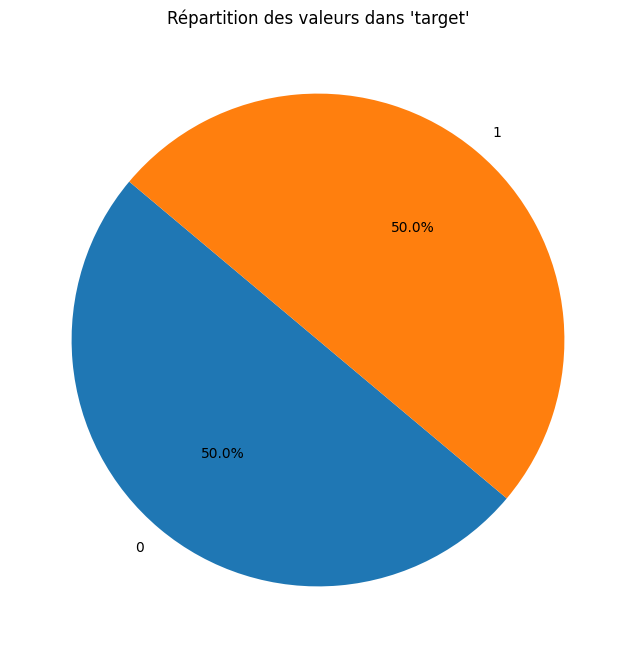

In [32]:
# Compter les occurrences de chaque valeur unique
valeurs_comptes = df_tweets['target'].value_counts()

# Créer le pie plot
plt.figure(figsize=(8, 8))
plt.pie(valeurs_comptes, labels=valeurs_comptes.index, autopct='%1.1f%%', startangle=140)
plt.title("Répartition des valeurs dans 'target'")
plt.show()

On a autant de tweets négatifs que positifs.

## 4.2 ids

In [33]:
nombre_valeurs_uniques = df_tweets['ids'].nunique()
valeurs_uniques = df_tweets['ids'].unique()

# Affichage du nombre de valeurs uniques
print(f"Nombre de valeurs uniques dans 'ids': {nombre_valeurs_uniques}")

# Affichage des valeurs uniques
print(f"Valeurs uniques dans 'ids':\n{valeurs_uniques}")

Nombre de valeurs uniques dans 'ids': 1598315
Valeurs uniques dans 'ids':
[1467810369 1467810672 1467810917 ... 2193601991 2193602064 2193602129]


In [34]:
# Doublons dans la colonne 'ids'
doublons = df_tweets[df_tweets.duplicated('ids', keep=False)]

# Tri des doublons par la colonne 'ids' pour regrouper les lignes ayant le même id ensemble
doublons_trie = doublons.sort_values(by='ids')

# Affichage des lignes avec des ids en doublons
print(doublons_trie)


         target         ids                          date      flag  \
213           0  1467863684  Mon Apr 06 22:33:35 PDT 2009  NO_QUERY   
800261        1  1467863684  Mon Apr 06 22:33:35 PDT 2009  NO_QUERY   
275           0  1467880442  Mon Apr 06 22:38:04 PDT 2009  NO_QUERY   
800300        1  1467880442  Mon Apr 06 22:38:04 PDT 2009  NO_QUERY   
989           0  1468053611  Mon Apr 06 23:28:09 PDT 2009  NO_QUERY   
...         ...         ...                           ...       ...   
524290        0  2193428118  Tue Jun 16 08:26:44 PDT 2009  NO_QUERY   
1599440       1  2193451289  Tue Jun 16 08:28:37 PDT 2009  NO_QUERY   
524345        0  2193451289  Tue Jun 16 08:28:37 PDT 2009  NO_QUERY   
524688        0  2193576442  Tue Jun 16 08:38:45 PDT 2009  NO_QUERY   
1599931       1  2193576442  Tue Jun 16 08:38:45 PDT 2009  NO_QUERY   

                 user                                               text  
213          DjGundam  Awwh babs... you look so sad underneith that s...

## 4.3. date

In [35]:
nombre_valeurs_uniques = df_tweets['date'].nunique()
valeurs_uniques = df_tweets['date'].unique()

# Affichage du nombre de valeurs uniques
print(f"Nombre de valeurs uniques dans 'date': {nombre_valeurs_uniques}")

# Affichage des valeurs uniques
print(f"Valeurs uniques dans 'date':\n{valeurs_uniques}")

Nombre de valeurs uniques dans 'date': 774363
Valeurs uniques dans 'date':
['Mon Apr 06 22:19:45 PDT 2009' 'Mon Apr 06 22:19:49 PDT 2009'
 'Mon Apr 06 22:19:53 PDT 2009' ... 'Tue Jun 16 08:38:58 PDT 2009'
 'Tue Jun 16 08:39:00 PDT 2009' 'Tue Jun 16 08:40:50 PDT 2009']


## 4.4 flag

In [36]:
nombre_valeurs_uniques = df_tweets['flag'].nunique()
valeurs_uniques = df_tweets['flag'].unique()

# Affichage du nombre de valeurs uniques
print(f"Nombre de valeurs uniques dans 'flag': {nombre_valeurs_uniques}")

# Affichage des valeurs uniques
print(f"Valeurs uniques dans 'flag':\n{valeurs_uniques}")

Nombre de valeurs uniques dans 'flag': 1
Valeurs uniques dans 'flag':
['NO_QUERY']


## 4.5 user

In [37]:
nombre_valeurs_uniques = df_tweets['user'].nunique()
valeurs_uniques = df_tweets['user'].unique()

# Affichage du nombre de valeurs uniques
print(f"Nombre de valeurs uniques dans 'user': {nombre_valeurs_uniques}")

# Affichage des valeurs uniques
print(f"Valeurs uniques dans 'user':\n{valeurs_uniques}")

Nombre de valeurs uniques dans 'user': 659775
Valeurs uniques dans 'user':
['_TheSpecialOne_' 'scotthamilton' 'mattycus' ... 'EvolveTom'
 'AmandaMarie1028' 'bpbabe']


## 4.6 text

In [38]:
nombre_valeurs_uniques = df_tweets['text'].nunique()
valeurs_uniques = df_tweets['text'].unique()

# Affichage du nombre de valeurs uniques
print(f"Nombre de valeurs uniques dans 'text': {nombre_valeurs_uniques}")

# Affichage des valeurs uniques
print(f"Valeurs uniques dans 'text':\n{valeurs_uniques}")

Nombre de valeurs uniques dans 'text': 1581466
Valeurs uniques dans 'text':
["@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer.  You shoulda got David Carr of Third Day to do it. ;D"
 "is upset that he can't update his Facebook by texting it... and might cry as a result  School today also. Blah!"
 '@Kenichan I dived many times for the ball. Managed to save 50%  The rest go out of bounds'
 ... 'Are you ready for your MoJo Makeover? Ask me for details '
 'Happy 38th Birthday to my boo of alll time!!! Tupac Amaru Shakur '
 'happy #charitytuesday @theNSPCC @SparksCharity @SpeakingUpH4H ']


Il y a des tweets en doublons, on va en conserver un seul à chaque fois.

In [39]:
df_tweets = remove_mentions(df_tweets, "text")

In [40]:
df_tweets.head()

,target,ids,date,flag,user,text
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"http://twitpic.com/2y1zl - Awww, that's a bumm..."
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,I dived many times for the ball. Managed to sa...
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"no, it's not behaving at all. i'm mad. why am ..."


In [41]:
# Supprimer les doublons basés sur la colonne 'text'
df_tweets = df_tweets.drop_duplicates(subset='text')

# Optionnel : Réinitialiser l'index après la suppression des doublons
df_tweets.reset_index(drop=True, inplace=True)

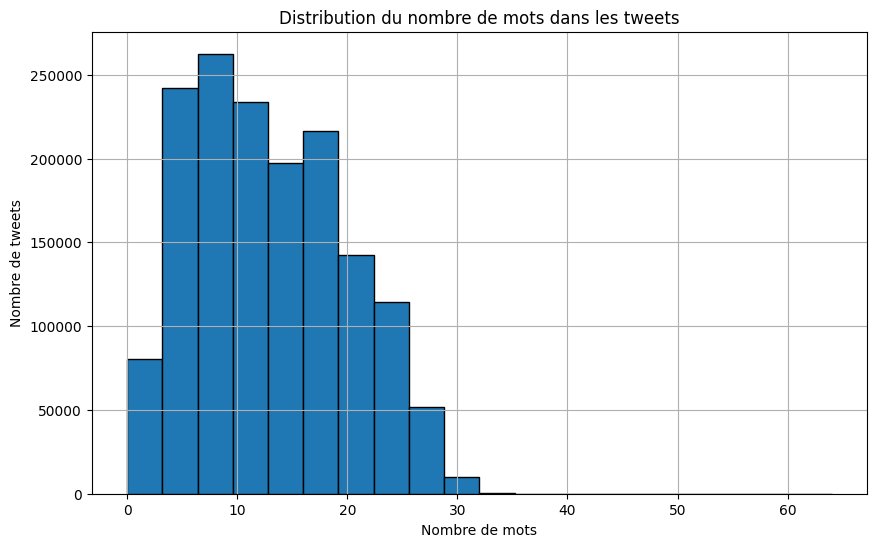

In [42]:
# Calcul du nombre de mots dans chaque tweet
df_tweets['word_count'] = df_tweets['text'].apply(lambda x: len(x.split()))

# Création de l'histogramme
plt.figure(figsize=(10, 6))
plt.hist(df_tweets['word_count'], bins=20, edgecolor='black')
plt.title('Distribution du nombre de mots dans les tweets')
plt.xlabel('Nombre de mots')
plt.ylabel('Nombre de tweets')
plt.grid(True)
plt.show()

In [43]:
df_tweets['word_count'].describe()

count    1.551387e+06
mean     1.291379e+01
std      6.835337e+00
min      0.000000e+00
25%      7.000000e+00
50%      1.200000e+01
75%      1.800000e+01
max      6.400000e+01
Name: word_count, dtype: float64

Le tweet le plus petit contient 0 mot, celui le plus long 64 mots. Le nombre moyen de mots par tweet est de 13 mots.

On va supprimer les lignes où le texte ne contient pas de mots.

In [44]:
# Filtrage des lignes où le nombre de mots est supérieur à 0
df_tweets = df_tweets[df_tweets['word_count'] > 0].reset_index(drop=True)

# Affichage du dataFrame filtré
df_tweets.head()

,target,ids,date,flag,user,text,word_count
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"http://twitpic.com/2y1zl - Awww, that's a bumm...",18
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...,21
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,I dived many times for the ball. Managed to sa...,17
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire,10
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"no, it's not behaving at all. i'm mad. why am ...",20


In [45]:
df_tweets['word_count'].describe()

count    1.551386e+06
mean     1.291379e+01
std      6.835332e+00
min      1.000000e+00
25%      7.000000e+00
50%      1.200000e+01
75%      1.800000e+01
max      6.400000e+01
Name: word_count, dtype: float64

In [46]:
df_tweets.shape

(1551386, 7)

## 4.7 Création du dataframe final

In [47]:
df = df_tweets[['target', 'text']]

In [48]:
# Sélection de 10 000 tweets négatifs
df_negatifs = df[df['target'] == 0].sample(n=10000, random_state=42)

# Sélection de 10 000 tweets positifs
df_positifs = df[df['target'] == 1].sample(n=10000, random_state=42)

# Regroupement des deux DataFrames
df_final = pd.concat([df_negatifs, df_positifs], ignore_index=True)

In [49]:
df_final.shape

(20000, 2)

In [50]:
df_final.head()

,target,text
0,0,"Borderline suicidal, started at half 10 today ..."
1,0,i was in your store on monday didnt see you i ...
2,0,"where have you been,you better come with me to..."
3,0,Had to cut my round short
4,0,"Mannn I neva get to see you anymore aunte,"


# 5. Prétraitement du texte

In [51]:
stop_w = list(set(stopwords.words('english'))) + \
    ['[', ']', ',', '.', '?']

In [52]:
# Texte préparé pour une représentation en sac de mots, sans lemmatisation et sans stemmatisation
df_final["text_bow"] = df_final["text"].apply(lambda x: transform_text_fct(x, lemma=False, stem=False))

In [53]:
# Texte préparé pour une représentation en sac de mots, avec lemmatisation et sans stemmatisation
df_final["text_bow_lem"] = df_final["text"].apply(lambda x: transform_text_fct(x, stem=False))

In [54]:
# Texte préparé pour une représentation en sac de mots, avec stemmatisation et sans lemmatisation
df_final["text_bow_stem"] = df_final["text"].apply(lambda x: transform_text_fct(x, lemma=False))

In [55]:
# Texte préparé pour des modèles de deep learning, sans suppression des stop words, sans stemmatisation et sans lemmatisation
df_final["text_dl"] = df_final["text"].apply(lambda x: transform_text_fct(x, stop_words=False, lemma=False, stem=False))

In [56]:
df_final = df_final.sample(frac=1, random_state=42).reset_index(drop=True)

In [57]:
df_final.shape

(20000, 6)

In [58]:
df_final.head()

,target,text,text_bow,text_bow_lem,text_bow_stem,text_dl
0,1,"I kinda use the Tweetie video feat., I would u...",kinda use tweetie video feat would use audio o...,kinda use tweetie video feat would use audio o...,kinda use tweeti video feat would use audio of...,i kinda use the tweetie video feat i would use...
1,0,i want the new album so bad!! but i cant get i...,want new album bad cant get today,want new album bad cant get today,want new album bad cant get today,i want the new album so bad but i cant get it ...
2,0,Man... I think Dan is going to make me see Los...,man think dan going make see los campesinos au...,man think dan going make see los campesinos au...,man think dan go make see lo campesino august,man i think dan is going to make me see los ca...
3,0,"Played a bad game with hockey today, lost 7-5",played bad game hockey today lost,played bad game hockey today lost,play bad game hockey today lost,played a bad game with hockey today lost 7 5
4,1,wow! i had a great sleep. good morning everyon...,wow great sleep good morning everyone hehe nic...,wow great sleep good morning everyone hehe nic...,wow great sleep good morn everyon hehe nice day,wow i had a great sleep good morning everyone ...


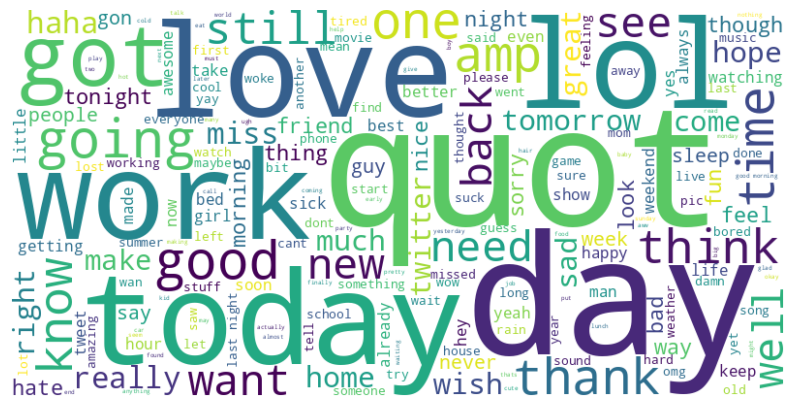

In [59]:
# Concaténer toutes les descriptions lemmatisées en une seule chaîne
all_words = ' '.join(df_final["text_bow_lem"].explode().dropna())

# Créer un objet WordCloud avec les paramètres souhaités
wordcloud = WordCloud(width=800, height=400,
                      background_color='white').generate(all_words)

# Afficher le nuage de mots
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

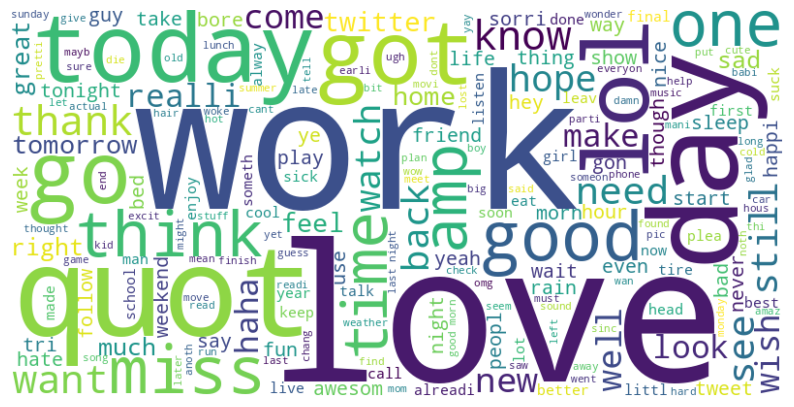

In [60]:
# Concaténer toutes les descriptions stemmatisées en une seule chaîne
all_words = ' '.join(df_final["text_bow_stem"].explode().dropna())

# Créer un objet WordCloud avec les paramètres souhaités
wordcloud = WordCloud(width=800, height=400,
                      background_color='white').generate(all_words)

# Afficher le nuage de mots
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# 6. Export csv

In [61]:
filename = "datas/df_final.csv"
df_final.to_csv(filename, index=False)

# 7. Test d'un modèle simple

In [62]:
test_model('text_bow')
test_model('text_bow_lem')
test_model('text_bow_stem')
test_model('text_dl')

Résultats pour text_bow:
Validation - Accuracy: 0.7333, Recall: 0.7447, F1 Score: 0.7363, AUC: 0.8061
Test - Accuracy: 0.7380, Recall: 0.7520, F1 Score: 0.7416, AUC: 0.8174
--------------------------------------------------------------------------------
Résultats pour text_bow_lem:
Validation - Accuracy: 0.7353, Recall: 0.7467, F1 Score: 0.7383, AUC: 0.8099
Test - Accuracy: 0.7430, Recall: 0.7600, F1 Score: 0.7473, AUC: 0.8196
--------------------------------------------------------------------------------
Résultats pour text_bow_stem:
Validation - Accuracy: 0.7363, Recall: 0.7413, F1 Score: 0.7376, AUC: 0.8112
Test - Accuracy: 0.7443, Recall: 0.7473, F1 Score: 0.7451, AUC: 0.8192
--------------------------------------------------------------------------------
Résultats pour text_dl:
Validation - Accuracy: 0.7500, Recall: 0.7500, F1 Score: 0.7500, AUC: 0.8259
Test - Accuracy: 0.7540, Recall: 0.7560, F1 Score: 0.7545, AUC: 0.8377
---------------------------------------------------------

Le modèle utilisant la colonne "text_dl" a donné les meilleures performances.

# 8. Tests de plusieurs modèles

In [63]:
text_column = "text_dl"

In [64]:
# Hyperparamètres à tester pour chaque modèle
param_grids = {
    "Logistic Regression": {
        'C': [0.01, 0.1, 1, 10, 100],
        'solver': ['lbfgs', 'liblinear']
    },
    "Linear SVC": {
        'C': [0.01, 0.1, 1, 10],
        'max_iter': [1000, 5000, 10000]
    },
    "Decision Tree": {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10]
    },
    "Random Forest": {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10]
    },
    "Extra Trees": {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5, 10]
    },
    "AdaBoost": {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 1]
    },
    "Gradient Boosting": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7]
    },
    "XGBoost": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7]
    },
    "LightGBM": {
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.2],
        'num_leaves': [31, 40, 50]
    },
    "CatBoost": {
        'iterations': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.2],
        'depth': [3, 5, 7]
    },
    "MLP Classifier": {
        'hidden_layer_sizes': [(50,), (100,), (100, 50)],
        'activation': ['tanh', 'relu'],
        'solver': ['adam', 'sgd'],
        'alpha': [0.0001, 0.001, 0.01]
    },
    "K-Nearest Neighbors": {
        'n_neighbors': [3, 5, 7, 9],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    },
    "SVM with RBF Kernel": {
        'C': [0.1, 1, 10, 100],
        'kernel': ['rbf', 'linear'],
        'gamma': ['scale', 'auto', 2]
    }
}

In [65]:
# Liste des modèles à tester
models = [
    (LogisticRegression(), "Logistic Regression"),
    (LinearSVC(), "Linear SVC"),
    (DecisionTreeClassifier(), "Decision Tree"),
    (RandomForestClassifier(), "Random Forest"),
    (ExtraTreesClassifier(), "Extra Trees"),
    (AdaBoostClassifier(algorithm="SAMME"), "AdaBoost"),
    (GradientBoostingClassifier(), "Gradient Boosting"),
    (XGBClassifier(use_label_encoder=False, eval_metric='logloss'), "XGBoost"),
    (LGBMClassifier(), "LightGBM"),
    (CatBoostClassifier(verbose=0), "CatBoost"),
    (MLPClassifier(), "MLP Classifier"),
    (KNeighborsClassifier(), "K-Nearest Neighbors"),
    (SVC(probability=True), "SVM with RBF Kernel")
]

In [66]:
# Séparation des variables indépendantes (X) et dépendante (y)
X = df_final[text_column]
y = df_final['target']

# Division des données en ensembles d'entraînement, de validation et de test
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

In [67]:
# Sélection de 1 000 tweets négatifs
df_negatifs = df_final[df_final['target'] == 0].sample(frac=0.1, random_state=42)

# Sélection de 1 000 tweets positifs
df_positifs = df_final[df_final['target'] == 1].sample(frac=0.1, random_state=42)

# Regroupement des deux DataFrames
df_sample = pd.concat([df_negatifs, df_positifs], ignore_index=True)

In [68]:
# Séparation des variables indépendantes (X) et dépendante (y)
X_sample = df_sample[text_column]
y_sample = df_sample['target']

# Division des données en ensembles d'entraînement, de validation et de test
X_train_sample, X_temp_sample, y_train_sample, y_temp_sample = train_test_split(X_sample, y_sample, test_size=0.3, random_state=42, stratify=y_sample)
X_val_sample, X_test_sample, y_val_sample, y_test_sample = train_test_split(X_temp_sample, y_temp_sample, test_size=0.5, random_state=42, stratify=y_temp_sample)

In [69]:
X_test_sample.shape

(300,)

## 8.1. Avec Tf-idf

In [70]:
vectorizer = TfidfVectorizer(max_features=5000)
X_train_tfidf = vectorizer.fit_transform(X_train)

In [71]:
# Sauvegarde du modèle Tf-idf
with open('api/embeddings/tfidf_model.pkl', 'wb') as f:
    pickle.dump(vectorizer, f)

In [72]:
# 3. Transformer les données de validation et test avec le modèle ajusté
X_val_tfidf = vectorizer.transform(X_val)
X_test_tfidf = vectorizer.transform(X_test)

# 4. Normalisation des données avec StandardScaler
scaler = StandardScaler(with_mean=False)
X_train_tfidf = scaler.fit_transform(X_train_tfidf)
X_val_tfidf = scaler.transform(X_val_tfidf)
X_test_tfidf = scaler.transform(X_test_tfidf)

In [73]:
# Vectorisation des données textuelles avec TF-IDF
X_train_tfidf_sample = vectorizer.fit_transform(X_train_sample)
X_val_tfidf_sample = vectorizer.transform(X_val_sample)
X_test_tfidf_sample = vectorizer.transform(X_test_sample)

# Normalisation des données
scaler = StandardScaler(with_mean=False)
X_train_tfidf_sample = scaler.fit_transform(X_train_tfidf_sample)
X_val_tfidf_sample = scaler.transform(X_val_tfidf_sample)
X_test_tfidf_sample = scaler.transform(X_test_tfidf_sample)

### 8.1.a. Gestion des hyperparamètres

In [74]:
# Recherche d'hyperparamètres pour chaque modèle
best_params_dict_tfidf = {}
for model, model_name in models:
    param_grid = param_grids.get(model_name)
    
    print(f"Performing GridSearchCV for {model_name}...")
    best_model, best_params = perform_grid_search(model, param_grid, X_train_tfidf_sample, y_train_sample)
    best_params_dict_tfidf[model_name] = best_params

Performing GridSearchCV for Logistic Regression...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Performing GridSearchCV for Linear SVC...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Performing GridSearchCV for Decision Tree...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Performing GridSearchCV for Random Forest...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for Extra Trees...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for AdaBoost...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Performing GridSearchCV for Gradient Boosting...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for LightGBM...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
[LightGBM] [Info] Number of positive: 700, number of 

### 8.1.b. Test des modèles

Training Logistic Regression with best hyperparameters...


2024/09/22 23:29:13 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Logistic Regression - text_dl with best params {'C': 0.01, 'solver': 'lbfgs'}:
Validation - Accuracy: 0.7107, Recall: 0.7053, F1 Score: 0.7091, AUC: 0.7724
Test - Accuracy: 0.7193, Recall: 0.7293, F1 Score: 0.7221, AUC: 0.7825
--------------------------------------------------------------------------------


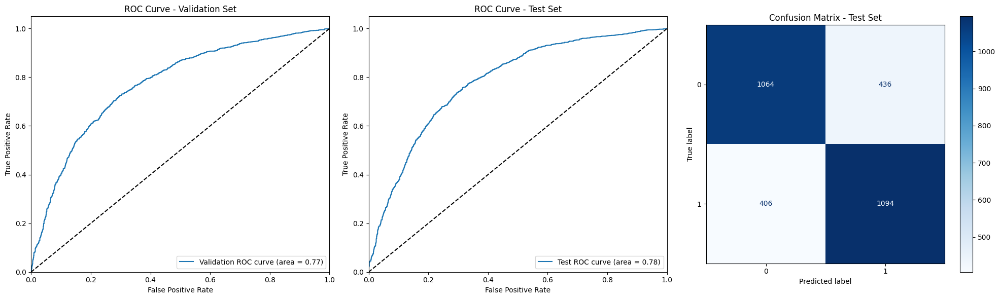

2024/09/22 23:29:14 INFO mlflow.tracking._tracking_service.client: 🏃 View run bustling-gnat-993 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/6a741b495fd843f99904e14a071e24d1.
2024/09/22 23:29:14 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Linear SVC with best hyperparameters...


2024/09/22 23:29:17 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Linear SVC - text_dl with best params {'C': 0.01, 'max_iter': 1000}:
Validation - Accuracy: 0.6923, Recall: 0.6860, F1 Score: 0.6904, AUC: 0.7462
Test - Accuracy: 0.6973, Recall: 0.7107, F1 Score: 0.7013, AUC: 0.7566
--------------------------------------------------------------------------------


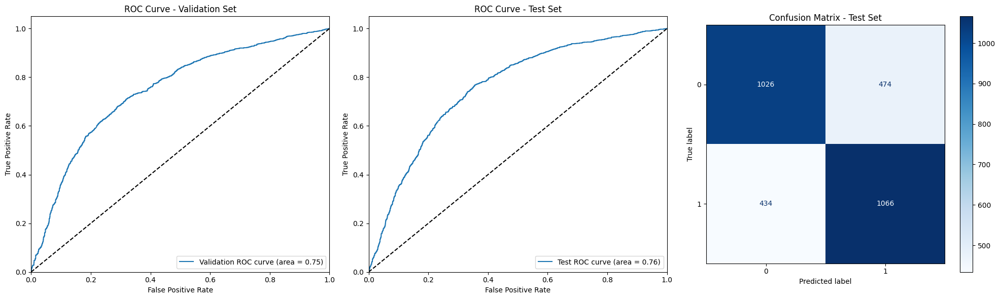

2024/09/22 23:29:18 INFO mlflow.tracking._tracking_service.client: 🏃 View run placid-moth-810 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/f3542b74caa94630ab2a5b0b65f9b9e7.
2024/09/22 23:29:18 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Decision Tree with best hyperparameters...


2024/09/22 23:29:21 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Decision Tree - text_dl with best params {'max_depth': 10, 'min_samples_split': 10}:
Validation - Accuracy: 0.6060, Recall: 0.8273, F1 Score: 0.6774, AUC: 0.6621
Test - Accuracy: 0.6093, Recall: 0.8373, F1 Score: 0.6819, AUC: 0.6587
--------------------------------------------------------------------------------


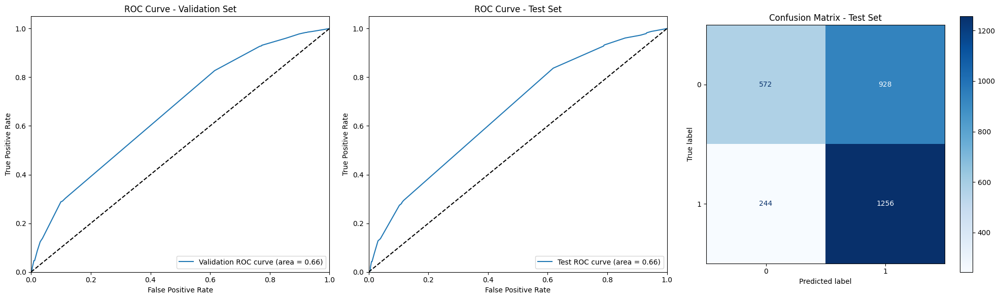

2024/09/22 23:29:21 INFO mlflow.tracking._tracking_service.client: 🏃 View run upset-moose-222 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/14c5844d5f164365b765a21ee479f29f.
2024/09/22 23:29:21 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Random Forest with best hyperparameters...


2024/09/22 23:29:54 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Random Forest - text_dl with best params {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}:
Validation - Accuracy: 0.7280, Recall: 0.7240, F1 Score: 0.7269, AUC: 0.8004
Test - Accuracy: 0.7290, Recall: 0.7240, F1 Score: 0.7276, AUC: 0.8056
--------------------------------------------------------------------------------


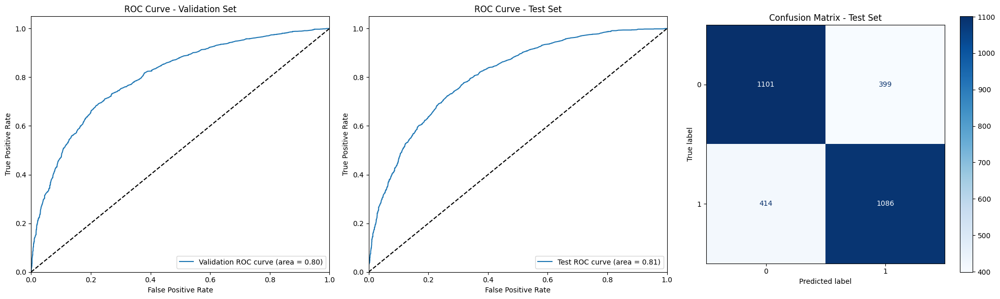

2024/09/22 23:29:58 INFO mlflow.tracking._tracking_service.client: 🏃 View run persistent-bass-892 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/c81b1832b2c64d028d58c7cdba3f9b98.
2024/09/22 23:29:58 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Extra Trees with best hyperparameters...


2024/09/22 23:30:51 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Extra Trees - text_dl with best params {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 300}:
Validation - Accuracy: 0.7460, Recall: 0.7333, F1 Score: 0.7427, AUC: 0.8239
Test - Accuracy: 0.7467, Recall: 0.7300, F1 Score: 0.7424, AUC: 0.8256
--------------------------------------------------------------------------------


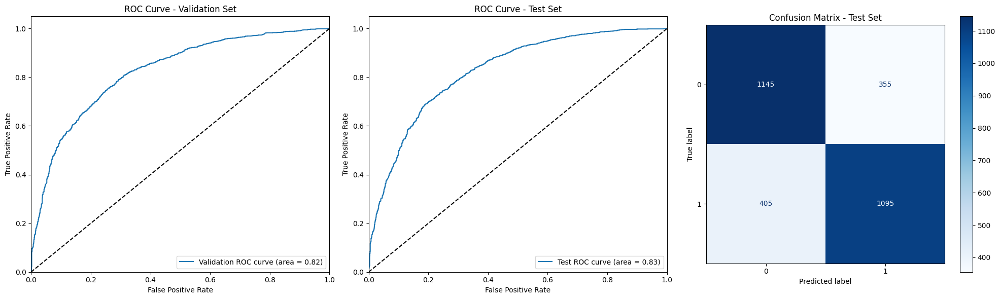

2024/09/22 23:30:59 INFO mlflow.tracking._tracking_service.client: 🏃 View run mercurial-moose-667 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/dc1b7dac164c478fb2f0705733acfaa2.
2024/09/22 23:30:59 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.
C:\Users\steph\anaconda3\envs\p7_bis\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Training AdaBoost with best hyperparameters...


2024/09/22 23:31:04 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model AdaBoost - text_dl with best params {'learning_rate': 1, 'n_estimators': 100}:
Validation - Accuracy: 0.6973, Recall: 0.7553, F1 Score: 0.7139, AUC: 0.7639
Test - Accuracy: 0.7027, Recall: 0.7533, F1 Score: 0.7170, AUC: 0.7740
--------------------------------------------------------------------------------


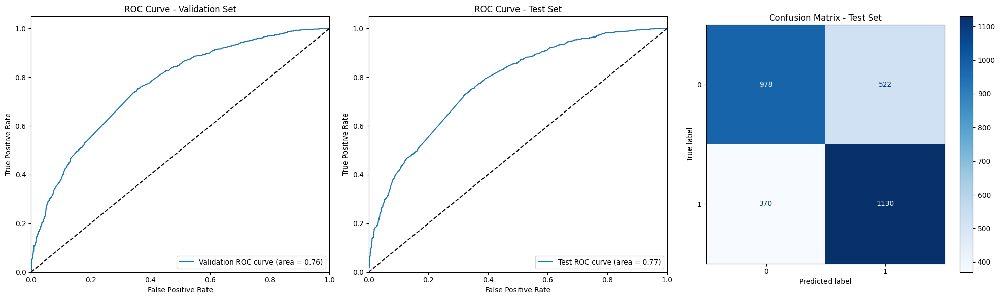

2024/09/22 23:31:05 INFO mlflow.tracking._tracking_service.client: 🏃 View run placid-fowl-959 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/91817a1172bc41baabeea0e499ec75d8.
2024/09/22 23:31:05 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Gradient Boosting with best hyperparameters...


2024/09/22 23:31:23 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Gradient Boosting - text_dl with best params {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100}:
Validation - Accuracy: 0.6453, Recall: 0.7673, F1 Score: 0.6839, AUC: 0.7036
Test - Accuracy: 0.6513, Recall: 0.7707, F1 Score: 0.6885, AUC: 0.7110
--------------------------------------------------------------------------------


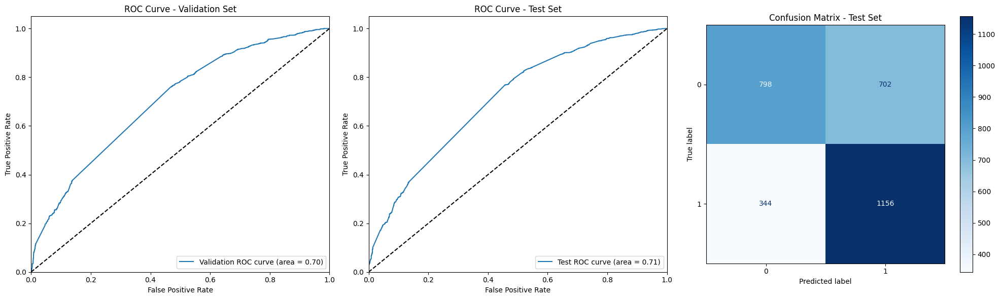

2024/09/22 23:31:23 INFO mlflow.tracking._tracking_service.client: 🏃 View run worried-grub-753 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/8874a883939a4bcc9666939f11668088.
2024/09/22 23:31:23 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training XGBoost with best hyperparameters...


2024/09/22 23:31:32 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model XGBoost - text_dl with best params {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100}:
Validation - Accuracy: 0.6460, Recall: 0.7667, F1 Score: 0.6841, AUC: 0.7013
Test - Accuracy: 0.6503, Recall: 0.7667, F1 Score: 0.6868, AUC: 0.7072
--------------------------------------------------------------------------------


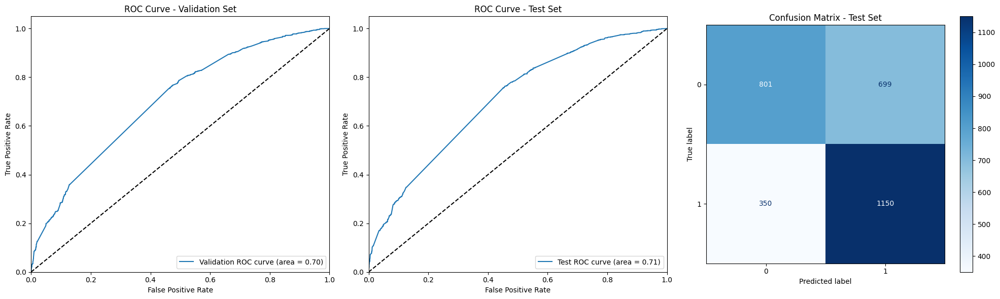

2024/09/22 23:31:32 INFO mlflow.tracking._tracking_service.client: 🏃 View run spiffy-grouse-321 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/1355c710831343d1b1ee9a6176d314a8.
2024/09/22 23:31:32 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training LightGBM with best hyperparameters...
[LightGBM] [Info] Number of positive: 7000, number of negative: 7000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 34879
[LightGBM] [Info] Number of data points in the train set: 14000, number of used features: 886
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


2024/09/22 23:31:36 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model LightGBM - text_dl with best params {'learning_rate': 0.01, 'n_estimators': 100, 'num_leaves': 31}:
Validation - Accuracy: 0.6717, Recall: 0.7493, F1 Score: 0.6953, AUC: 0.7399
Test - Accuracy: 0.6790, Recall: 0.7587, F1 Score: 0.7027, AUC: 0.7433
--------------------------------------------------------------------------------


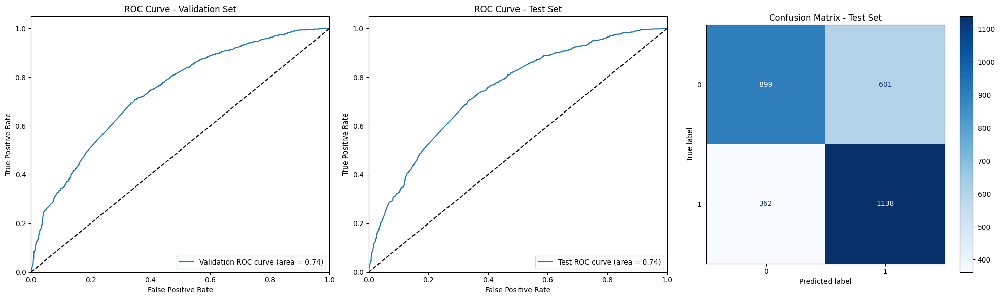

2024/09/22 23:31:37 INFO mlflow.tracking._tracking_service.client: 🏃 View run hilarious-conch-867 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/37001dd38ae54c5d92c6d5d51988349c.
2024/09/22 23:31:37 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training CatBoost with best hyperparameters...
0:	learn: 0.6844571	total: 70ms	remaining: 20.9s
1:	learn: 0.6773893	total: 141ms	remaining: 21.1s
2:	learn: 0.6715255	total: 213ms	remaining: 21.1s
3:	learn: 0.6662445	total: 286ms	remaining: 21.1s
4:	learn: 0.6614074	total: 358ms	remaining: 21.1s
5:	learn: 0.6574091	total: 432ms	remaining: 21.2s
6:	learn: 0.6534835	total: 508ms	remaining: 21.3s
7:	learn: 0.6497377	total: 585ms	remaining: 21.4s
8:	learn: 0.6465928	total: 662ms	remaining: 21.4s
9:	learn: 0.6441401	total: 745ms	remaining: 21.6s
10:	learn: 0.6406157	total: 824ms	remaining: 21.7s
11:	learn: 0.6376305	total: 903ms	remaining: 21.7s
12:	learn: 0.6353769	total: 981ms	remaining: 21.7s
13:	learn: 0.6327210	total: 1.06s	remaining: 21.6s
14:	learn: 0.6301512	total: 1.13s	remaining: 21.5s
15:	learn: 0.6281371	total: 1.21s	remaining: 21.4s
16:	learn: 0.6261086	total: 1.28s	remaining: 21.3s
17:	learn: 0.6240605	total: 1.36s	remaining: 21.3s
18:	learn: 0.6224899	total: 1.44s	remaining: 2

2024/09/22 23:32:03 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model CatBoost - text_dl with best params {'depth': 7, 'iterations': 300, 'learning_rate': 0.1}:
Validation - Accuracy: 0.7317, Recall: 0.7600, F1 Score: 0.7391, AUC: 0.8100
Test - Accuracy: 0.7300, Recall: 0.7527, F1 Score: 0.7360, AUC: 0.8143
--------------------------------------------------------------------------------


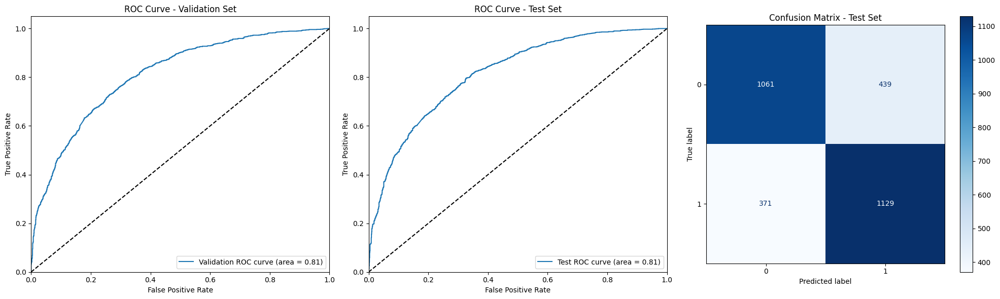

2024/09/22 23:32:04 INFO mlflow.tracking._tracking_service.client: 🏃 View run youthful-shrew-570 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/2d12f14b05bc4f3cbb811010ff222a24.
2024/09/22 23:32:04 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training MLP Classifier with best hyperparameters...


2024/09/22 23:33:02 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model MLP Classifier - text_dl with best params {'activation': 'tanh', 'alpha': 0.01, 'hidden_layer_sizes': (100, 50), 'solver': 'adam'}:
Validation - Accuracy: 0.7047, Recall: 0.7080, F1 Score: 0.7056, AUC: 0.7645
Test - Accuracy: 0.7043, Recall: 0.7187, F1 Score: 0.7085, AUC: 0.7757
--------------------------------------------------------------------------------


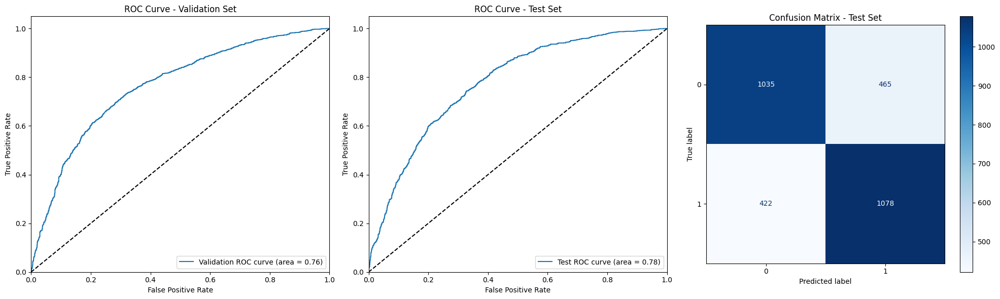

2024/09/22 23:33:03 INFO mlflow.tracking._tracking_service.client: 🏃 View run indecisive-foal-650 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/3d0b320cb53148998a61b05d33014ffe.
2024/09/22 23:33:03 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training K-Nearest Neighbors with best hyperparameters...


2024/09/22 23:33:11 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model K-Nearest Neighbors - text_dl with best params {'weights': 'distance', 'n_neighbors': 7, 'metric': 'manhattan'}:
Validation - Accuracy: 0.5120, Recall: 0.9727, F1 Score: 0.6659, AUC: 0.5468
Test - Accuracy: 0.5160, Recall: 0.9800, F1 Score: 0.6694, AUC: 0.5406
--------------------------------------------------------------------------------


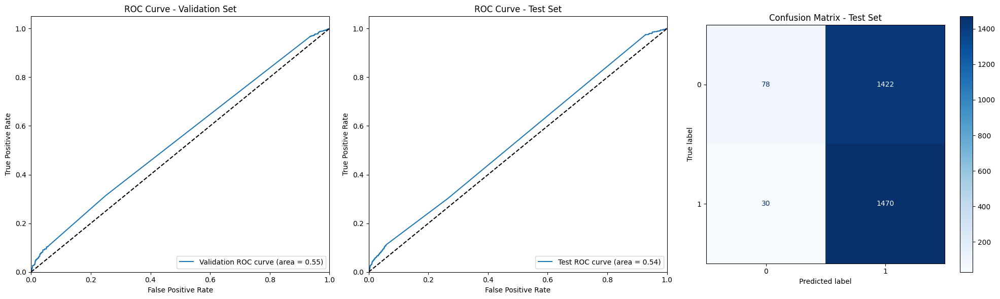

2024/09/22 23:33:11 INFO mlflow.tracking._tracking_service.client: 🏃 View run carefree-whale-474 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/d5452a3972994c97bcaaf5803141e417.
2024/09/22 23:33:11 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training SVM with RBF Kernel with best hyperparameters...


2024/09/22 23:34:22 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model SVM with RBF Kernel - text_dl with best params {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}:
Validation - Accuracy: 0.6947, Recall: 0.6827, F1 Score: 0.6910, AUC: 0.7683
Test - Accuracy: 0.7127, Recall: 0.7160, F1 Score: 0.7136, AUC: 0.7884
--------------------------------------------------------------------------------


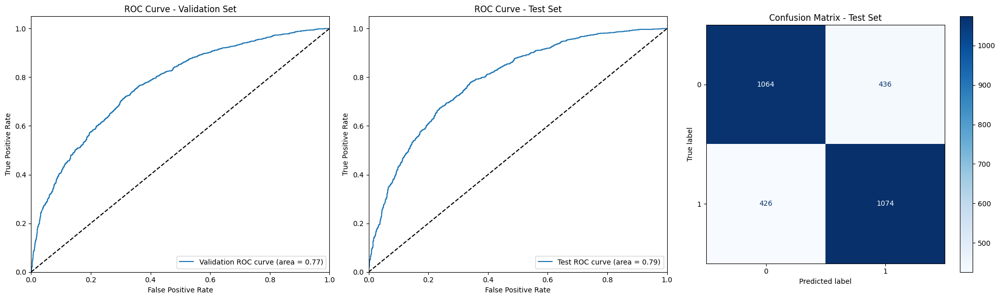

2024/09/22 23:34:22 INFO mlflow.tracking._tracking_service.client: 🏃 View run sincere-pig-315 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/97fe953e97f24f1597a7f8ed6963d94f.
2024/09/22 23:34:22 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


In [75]:
for model, model_name in models:
    # Obtention des meilleurs hyperparamètres pour le modèle
    best_params = best_params_dict_tfidf[model_name]

    # Créer une nouvelle instance du modèle
    model = model.__class__()

    model.set_params(**best_params)
    
    print(f"Training {model_name} with best hyperparameters...")
    # Appel de la fonction avec le modèle, le nom du modèle et les meilleurs hyperparamètres
    track_model_with_mlflow(
        text_column=text_column, 
        model=model, 
        model_name=model_name, 
        best_params=best_params,
        word_embedding="Tf-idf",
        X_train_embedding=X_train_tfidf, 
        y_train=y_train, 
        X_val_embedding=X_val_tfidf, 
        y_val=y_val, 
        X_test_embedding=X_test_tfidf, 
        y_test=y_test
    )

### 8.1.c. Test du modèle Bidirectional LSTM

In [76]:
X_val_tfidf.shape

(3000, 5000)

In [77]:
# Appel de la fonction avec les données
#track_model_with_mlflow_for_bidirectional_lstm(
#    text_column="text", 
#    vocab_size=5000, 
#    embedding_dim=64, 
#    word_embedding="Tf-idf",
#    input_length=X_train_tfidf_sample.shape[1],
#    X_train_embedding=X_train_tfidf_sample, 
#    y_train=y_train_sample, 
#    X_val_embedding=X_val_tfidf_sample, 
#    y_val=y_val_sample, 
#    X_test_embedding=X_test_tfidf_sample, 
#    y_test=y_test_sample
#)

## 8.2. Avec Word2Vec

In [78]:
# Entraînement du modèle Word2Vec
w2v_model = Word2Vec(sentences=[text.split() for text in X_train], vector_size=300, window=5, min_count=1, workers=4)

In [79]:
# Sauvegarde du modèle Word2Vec
w2v_model.save("api/embeddings/word2vec_model.bin")

In [80]:
# Vectorisation des jeux de données
X_train_w2v = np.array([vectorize_text_w2v(text, w2v_model) for text in X_train])
X_val_w2v = np.array([vectorize_text_w2v(text, w2v_model) for text in X_val])
X_test_w2v = np.array([vectorize_text_w2v(text, w2v_model) for text in X_test])

# Normalisation des données
scaler = StandardScaler()
X_train_w2v = scaler.fit_transform(X_train_w2v)
X_val_w2v = scaler.transform(X_val_w2v)
X_test_w2v = scaler.transform(X_test_w2v)

In [81]:
# Entraînement du modèle Word2Vec
w2v_model_sample = Word2Vec(sentences=[text.split() for text in X_train_sample], vector_size=300, window=5, min_count=1, workers=4)

In [82]:
# Vectorisation des jeux de données
X_train_w2v_sample = np.array([vectorize_text_w2v(text, w2v_model_sample) for text in X_train_sample])
X_val_w2v_sample = np.array([vectorize_text_w2v(text, w2v_model_sample) for text in X_val_sample])
X_test_w2v_sample = np.array([vectorize_text_w2v(text, w2v_model_sample) for text in X_test_sample])

# Normalisation des données
scaler = StandardScaler()
X_train_w2v_sample = scaler.fit_transform(X_train_w2v_sample)
X_val_w2v_sample = scaler.transform(X_val_w2v_sample)
X_test_w2v_sample = scaler.transform(X_test_w2v_sample)

### 8.2.a. Gestion des hyperparamètres

In [83]:
# Recherche d'hyperparamètres pour chaque modèle
best_params_dict_word2vec = {}
for model, model_name in models:        
    param_grid = param_grids.get(model_name)
    
    print(f"Performing GridSearchCV for {model_name}...")
    best_model, best_params = perform_grid_search(model, param_grid, X_train_w2v_sample, y_train_sample)
    best_params_dict_word2vec[model_name] = best_params

Performing GridSearchCV for Logistic Regression...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Performing GridSearchCV for Linear SVC...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Performing GridSearchCV for Decision Tree...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Performing GridSearchCV for Random Forest...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for Extra Trees...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for AdaBoost...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Performing GridSearchCV for Gradient Boosting...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for LightGBM...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
[LightGBM] [Info] Number of positive: 700, number of 

### 8.2.b. Test des modèles

Training Logistic Regression with best hyperparameters...


2024/09/23 00:34:59 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Logistic Regression - text_dl with best params {'C': 100, 'solver': 'lbfgs'}:
Validation - Accuracy: 0.6483, Recall: 0.6387, F1 Score: 0.6449, AUC: 0.7054
Test - Accuracy: 0.6390, Recall: 0.6260, F1 Score: 0.6342, AUC: 0.7066
--------------------------------------------------------------------------------


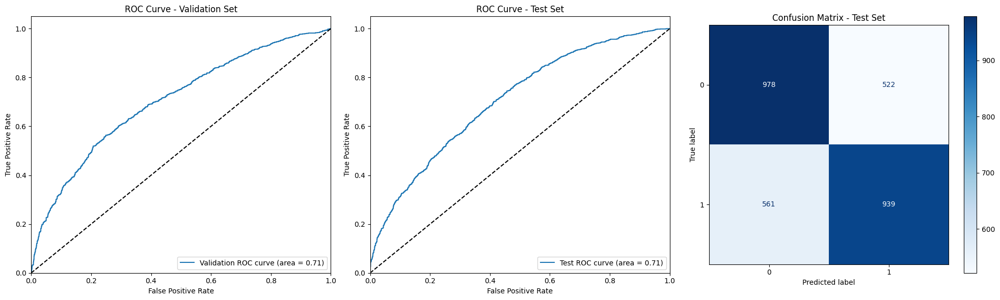

2024/09/23 00:34:59 INFO mlflow.tracking._tracking_service.client: 🏃 View run bold-ox-357 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/68e7674dd5ef43c499d9352a476bd208.
2024/09/23 00:34:59 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Linear SVC with best hyperparameters...


2024/09/23 00:35:06 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Linear SVC - text_dl with best params {'C': 0.1, 'max_iter': 1000}:
Validation - Accuracy: 0.6670, Recall: 0.6447, F1 Score: 0.6594, AUC: 0.7366
Test - Accuracy: 0.6767, Recall: 0.6680, F1 Score: 0.6738, AUC: 0.7406
--------------------------------------------------------------------------------


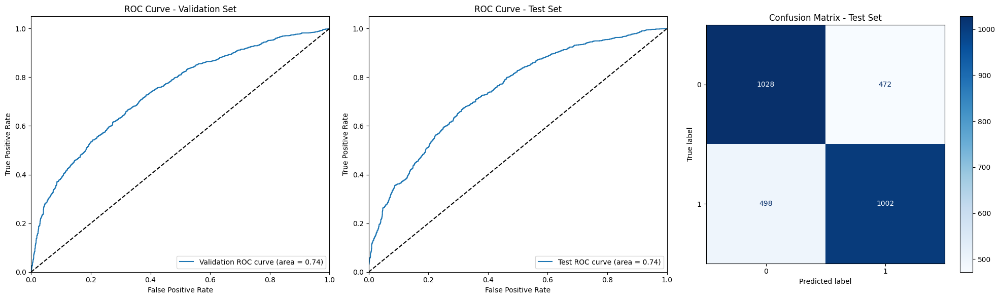

2024/09/23 00:35:06 INFO mlflow.tracking._tracking_service.client: 🏃 View run fun-panda-935 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/d9c800e583f64834b31578993bf46e58.
2024/09/23 00:35:06 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Decision Tree with best hyperparameters...


2024/09/23 00:35:15 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Decision Tree - text_dl with best params {'max_depth': 20, 'min_samples_split': 10}:
Validation - Accuracy: 0.5527, Recall: 0.5240, F1 Score: 0.5395, AUC: 0.5591
Test - Accuracy: 0.5413, Recall: 0.5120, F1 Score: 0.5275, AUC: 0.5448
--------------------------------------------------------------------------------


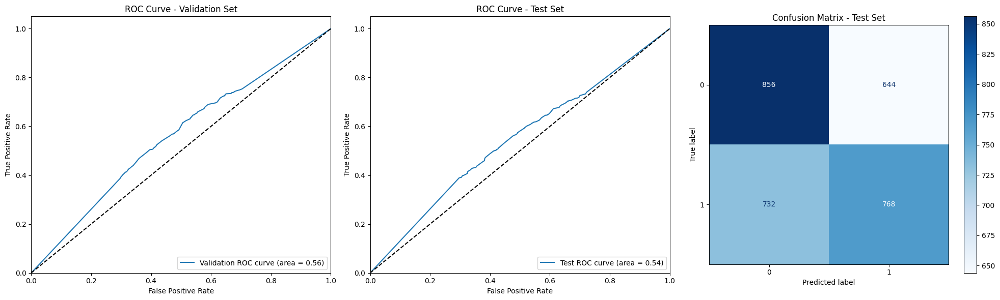

2024/09/23 00:35:16 INFO mlflow.tracking._tracking_service.client: 🏃 View run handsome-skink-427 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/0d27938657944142be3ee6c810cc6ca1.
2024/09/23 00:35:16 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Random Forest with best hyperparameters...


2024/09/23 00:35:43 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Random Forest - text_dl with best params {'max_depth': 20, 'min_samples_split': 10, 'n_estimators': 100}:
Validation - Accuracy: 0.6043, Recall: 0.6053, F1 Score: 0.6047, AUC: 0.6442
Test - Accuracy: 0.5820, Recall: 0.5753, F1 Score: 0.5792, AUC: 0.6168
--------------------------------------------------------------------------------


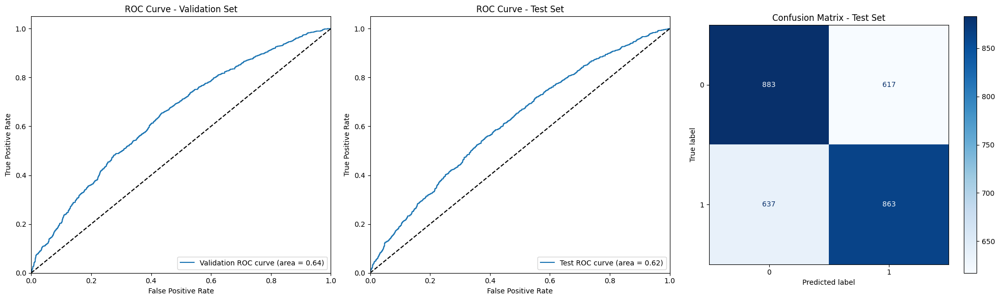

2024/09/23 00:35:44 INFO mlflow.tracking._tracking_service.client: 🏃 View run unique-snipe-177 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/728f2e0676534ab8aeaff4f770c95e9c.
2024/09/23 00:35:44 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Extra Trees with best hyperparameters...


2024/09/23 00:36:01 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Extra Trees - text_dl with best params {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 300}:
Validation - Accuracy: 0.6000, Recall: 0.5907, F1 Score: 0.5962, AUC: 0.6362
Test - Accuracy: 0.5793, Recall: 0.5813, F1 Score: 0.5802, AUC: 0.6101
--------------------------------------------------------------------------------


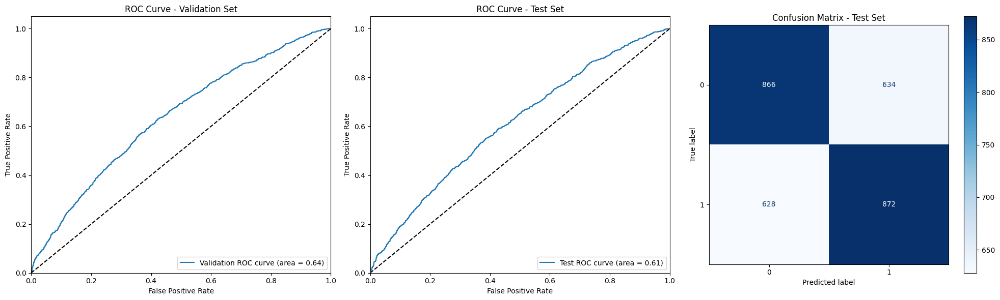

2024/09/23 00:36:04 INFO mlflow.tracking._tracking_service.client: 🏃 View run magnificent-colt-122 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/2e6db1f231064233ac6771807924b2a6.
2024/09/23 00:36:04 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.
C:\Users\steph\anaconda3\envs\p7_bis\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Training AdaBoost with best hyperparameters...


2024/09/23 00:38:01 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model AdaBoost - text_dl with best params {'learning_rate': 0.1, 'n_estimators': 200}:
Validation - Accuracy: 0.6037, Recall: 0.6393, F1 Score: 0.6173, AUC: 0.6461
Test - Accuracy: 0.5830, Recall: 0.6140, F1 Score: 0.5955, AUC: 0.6213
--------------------------------------------------------------------------------


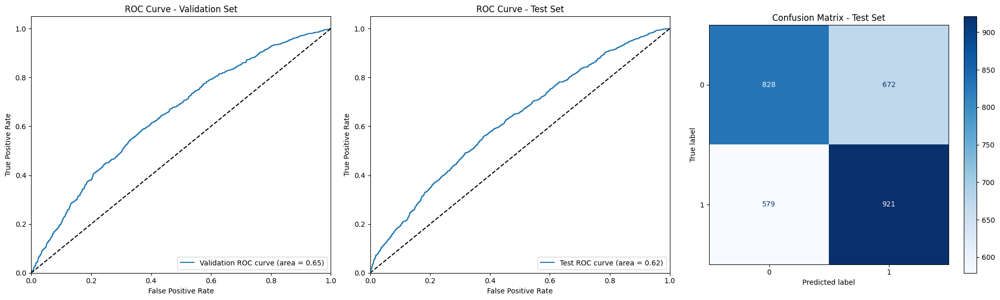

2024/09/23 00:38:02 INFO mlflow.tracking._tracking_service.client: 🏃 View run mysterious-hen-659 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/18db50b82560446da066900090cc2b03.
2024/09/23 00:38:02 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Gradient Boosting with best hyperparameters...


2024/09/23 00:40:31 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Gradient Boosting - text_dl with best params {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100}:
Validation - Accuracy: 0.6207, Recall: 0.6100, F1 Score: 0.6166, AUC: 0.6595
Test - Accuracy: 0.6030, Recall: 0.5933, F1 Score: 0.5991, AUC: 0.6442
--------------------------------------------------------------------------------


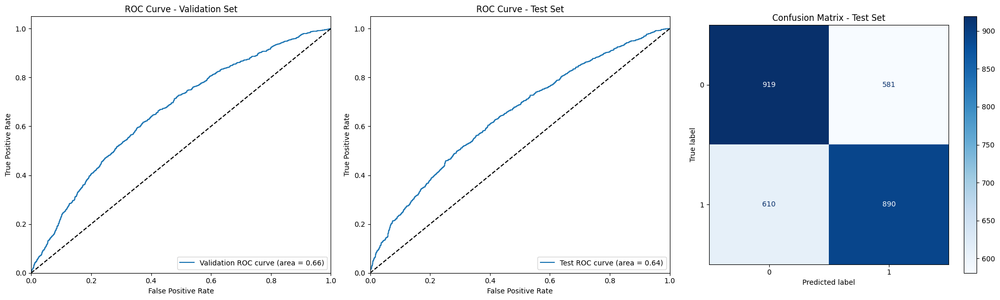

2024/09/23 00:40:32 INFO mlflow.tracking._tracking_service.client: 🏃 View run trusting-moose-762 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/d10ab9537c3346398c23ff0d5011ba7c.
2024/09/23 00:40:32 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training XGBoost with best hyperparameters...


2024/09/23 00:40:38 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model XGBoost - text_dl with best params {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100}:
Validation - Accuracy: 0.6037, Recall: 0.6047, F1 Score: 0.6041, AUC: 0.6483
Test - Accuracy: 0.5957, Recall: 0.6013, F1 Score: 0.5979, AUC: 0.6286
--------------------------------------------------------------------------------


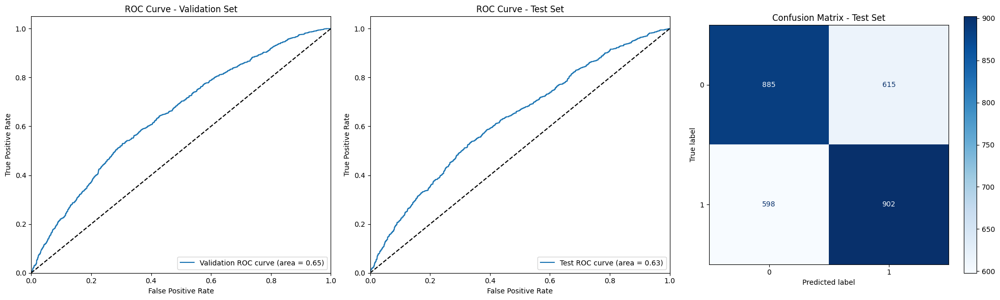

2024/09/23 00:40:39 INFO mlflow.tracking._tracking_service.client: 🏃 View run dazzling-hawk-696 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/c55ed790df69424c9a19ab07ccd535c5.
2024/09/23 00:40:39 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training LightGBM with best hyperparameters...
[LightGBM] [Info] Number of positive: 7000, number of negative: 7000
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 14000, number of used features: 300
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


2024/09/23 00:40:45 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model LightGBM - text_dl with best params {'learning_rate': 0.01, 'n_estimators': 200, 'num_leaves': 31}:
Validation - Accuracy: 0.6140, Recall: 0.6320, F1 Score: 0.6208, AUC: 0.6573
Test - Accuracy: 0.5927, Recall: 0.5973, F1 Score: 0.5946, AUC: 0.6327
--------------------------------------------------------------------------------


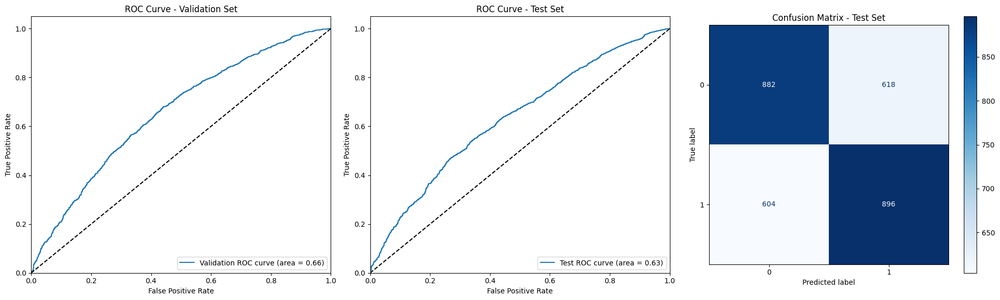

2024/09/23 00:40:46 INFO mlflow.tracking._tracking_service.client: 🏃 View run honorable-pig-807 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/73c16b77772b41e0b85e74a6170a3949.
2024/09/23 00:40:46 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training CatBoost with best hyperparameters...
0:	learn: 0.6889202	total: 11.1ms	remaining: 3.33s
1:	learn: 0.6855868	total: 22ms	remaining: 3.28s
2:	learn: 0.6829103	total: 33.3ms	remaining: 3.3s
3:	learn: 0.6801240	total: 44.2ms	remaining: 3.27s
4:	learn: 0.6779814	total: 55.3ms	remaining: 3.26s
5:	learn: 0.6762715	total: 66.7ms	remaining: 3.27s
6:	learn: 0.6741876	total: 78.7ms	remaining: 3.29s
7:	learn: 0.6730328	total: 90.6ms	remaining: 3.31s
8:	learn: 0.6716525	total: 102ms	remaining: 3.29s
9:	learn: 0.6701405	total: 113ms	remaining: 3.28s
10:	learn: 0.6687316	total: 125ms	remaining: 3.28s
11:	learn: 0.6678747	total: 136ms	remaining: 3.26s
12:	learn: 0.6666828	total: 147ms	remaining: 3.24s
13:	learn: 0.6658625	total: 158ms	remaining: 3.23s
14:	learn: 0.6650183	total: 169ms	remaining: 3.21s
15:	learn: 0.6641334	total: 180ms	remaining: 3.2s
16:	learn: 0.6633982	total: 193ms	remaining: 3.21s
17:	learn: 0.6626666	total: 205ms	remaining: 3.21s
18:	learn: 0.6622046	total: 216ms	remaini

2024/09/23 00:40:54 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model CatBoost - text_dl with best params {'depth': 3, 'iterations': 300, 'learning_rate': 0.1}:
Validation - Accuracy: 0.6217, Recall: 0.6193, F1 Score: 0.6208, AUC: 0.6646
Test - Accuracy: 0.6003, Recall: 0.5893, F1 Score: 0.5959, AUC: 0.6445
--------------------------------------------------------------------------------


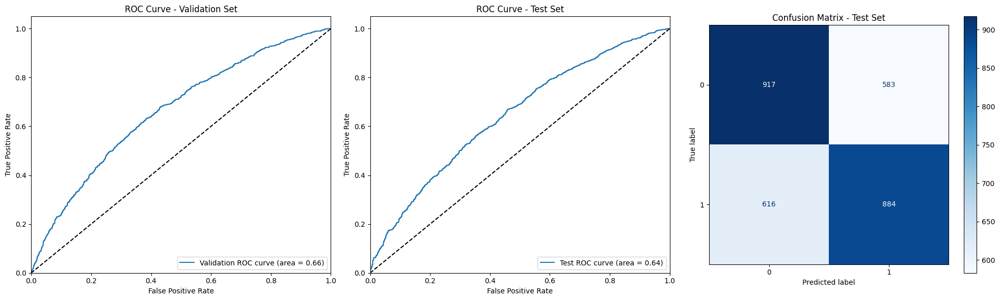

2024/09/23 00:40:55 INFO mlflow.tracking._tracking_service.client: 🏃 View run secretive-wolf-828 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/662d572816af441ba8b220e0226a75b9.
2024/09/23 00:40:55 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training MLP Classifier with best hyperparameters...


2024/09/23 00:41:08 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model MLP Classifier - text_dl with best params {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (50,), 'solver': 'adam'}:
Validation - Accuracy: 0.6540, Recall: 0.6220, F1 Score: 0.6426, AUC: 0.7057
Test - Accuracy: 0.6307, Recall: 0.5933, F1 Score: 0.6163, AUC: 0.6853
--------------------------------------------------------------------------------


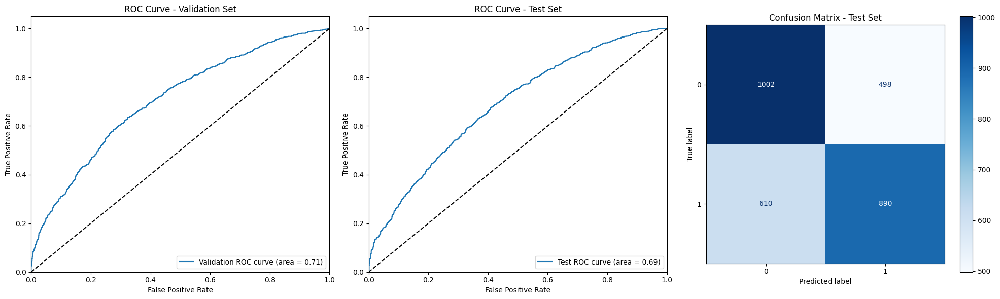

2024/09/23 00:41:09 INFO mlflow.tracking._tracking_service.client: 🏃 View run debonair-shrew-955 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/815bf08fa8c94892b5d0054e5130f313.
2024/09/23 00:41:09 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training K-Nearest Neighbors with best hyperparameters...


2024/09/23 00:41:13 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model K-Nearest Neighbors - text_dl with best params {'weights': 'uniform', 'n_neighbors': 9, 'metric': 'euclidean'}:
Validation - Accuracy: 0.5740, Recall: 0.5493, F1 Score: 0.5632, AUC: 0.5920
Test - Accuracy: 0.5520, Recall: 0.5187, F1 Score: 0.5366, AUC: 0.5764
--------------------------------------------------------------------------------


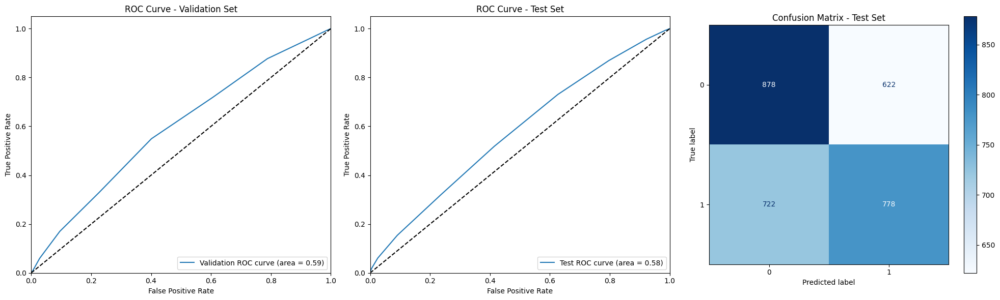

2024/09/23 00:41:15 INFO mlflow.tracking._tracking_service.client: 🏃 View run powerful-goat-827 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/d9735f260b3541a8b0b8acb6ad45c768.
2024/09/23 00:41:15 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training SVM with RBF Kernel with best hyperparameters...


2024/09/23 00:43:02 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model SVM with RBF Kernel - text_dl with best params {'C': 0.1, 'gamma': 2, 'kernel': 'rbf'}:
Validation - Accuracy: 0.5003, Recall: 0.0027, F1 Score: 0.0053, AUC: 0.5331
Test - Accuracy: 0.5010, Recall: 0.0033, F1 Score: 0.0066, AUC: 0.5241
--------------------------------------------------------------------------------


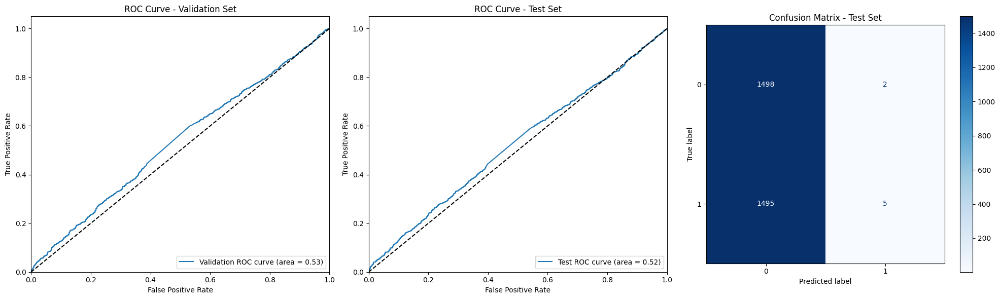

2024/09/23 00:43:03 INFO mlflow.tracking._tracking_service.client: 🏃 View run indecisive-loon-194 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/4e6597574b114dac82fb81e8a5f8b5fa.
2024/09/23 00:43:03 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


In [84]:
for model, model_name in models:
    # Obtention des meilleurs hyperparamètres pour le modèle
    best_params = best_params_dict_word2vec[model_name]

    # Créer une nouvelle instance du modèle
    model = model.__class__()

    model.set_params(**best_params)
    
    print(f"Training {model_name} with best hyperparameters...")
    # Appel de la fonction avec le modèle, le nom du modèle et les meilleurs hyperparamètres
    track_model_with_mlflow(
        text_column=text_column, 
        model=model, 
        model_name=model_name, 
        best_params=best_params,
        word_embedding="Word2Vec",
        X_train_embedding=X_train_w2v, 
        y_train=y_train, 
        X_val_embedding=X_val_w2v, 
        y_val=y_val, 
        X_test_embedding=X_test_w2v, 
        y_test=y_test
    )

### 8.2.c. Test du modèle Bidirectional LSTM

Epoch 1/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - accuracy: 0.5129 - loss: 0.6938 - val_accuracy: 0.5267 - val_loss: 0.6911
Epoch 2/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - accuracy: 0.5421 - loss: 0.6920 - val_accuracy: 0.5267 - val_loss: 0.6925
Epoch 3/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - accuracy: 0.5158 - loss: 0.6925 - val_accuracy: 0.5533 - val_loss: 0.6900
Epoch 4/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - accuracy: 0.5441 - loss: 0.6902 - val_accuracy: 0.5267 - val_loss: 0.6920
Epoch 5/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - accuracy: 0.5110 - loss: 0.6947 - val_accuracy: 0.5467 - val_loss: 0.6898
Epoch 6/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - accuracy: 0.4965 - loss: 0.6942 - val_accuracy: 0.5367 - val_loss: 0.6913
Epoch 7/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - accuracy: 0.5299 - loss: 0.6906 - val_accuracy: 0.5267 - val_loss: 0.6911
Epoch 8/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - accuracy: 0.5195 - loss: 0.6893 - val_accuracy: 0.

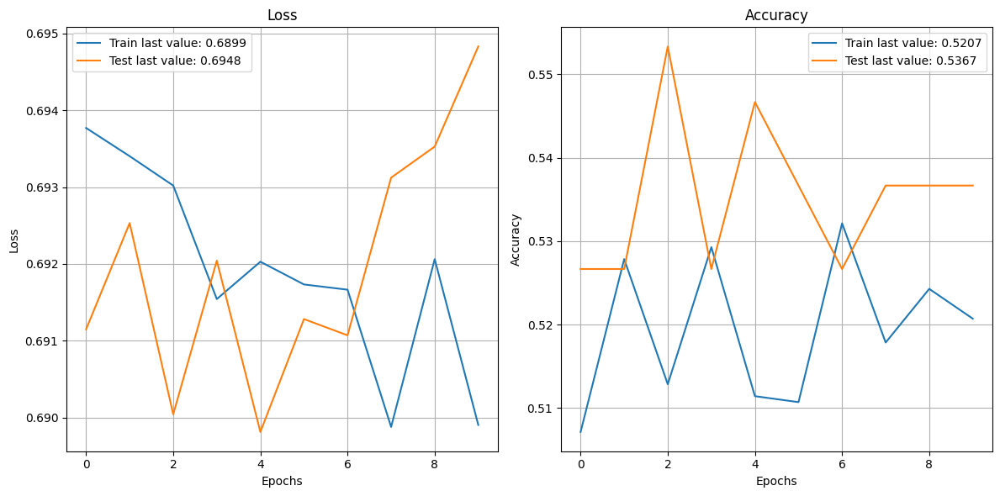

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


2024/09/23 00:44:01 WARNING mlflow.keras.save: You are saving a Keras model without specifying model signature.
2024/09/23 00:44:09 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Validation - Accuracy: 0.5367, Recall: 0.1333, F1 Score: 0.2235, AUC: 0.5289
Test - Accuracy: 0.5067, Recall: 0.1200, F1 Score: 0.1957, AUC: 0.4514
--------------------------------------------------------------------------------


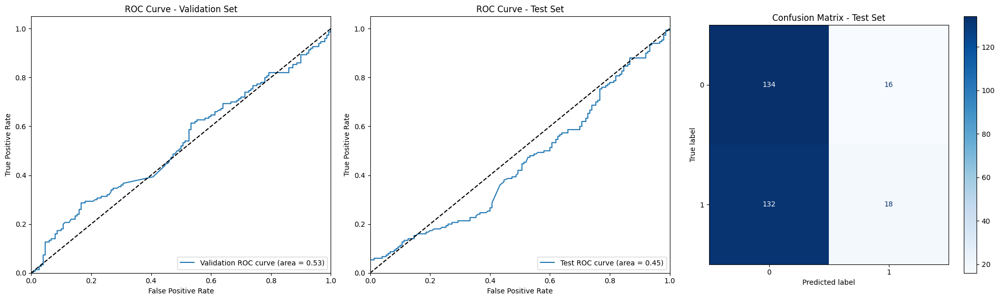

2024/09/23 00:44:10 INFO mlflow.tracking._tracking_service.client: 🏃 View run tasteful-cub-69 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/2634d178488d454d84118361a7633456.
2024/09/23 00:44:10 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


In [85]:
# Appel de la fonction avec les données
track_model_with_mlflow_for_bidirectional_lstm(
    text_column="text", 
    vocab_size=5000, 
    embedding_dim=64, 
    word_embedding="Word2Vec",
    input_length=X_train_w2v_sample.shape[1],
    X_train_embedding=X_train_w2v_sample, 
    y_train=y_train_sample, 
    X_val_embedding=X_val_w2v_sample, 
    y_val=y_val_sample, 
    X_test_embedding=X_test_w2v_sample, 
    y_test=y_test_sample
)

## 8.3. Avec GloVe

In [86]:
# Chargement des vecteurs GloVe pré-entraînés (supposons glove.6B.300d.txt)
embeddings_index = {}
with open('glove.6B.300d.txt', encoding='utf-8') as f:
    for line in f:
        values = line.split()
        word = values[0]
        coefs = np.asarray(values[1:], dtype='float32')
        embeddings_index[word] = coefs

In [87]:
# Sauvegarde des embeddings GloVe dans un fichier pkl
with open('api/embeddings/glove_embeddings.pkl', 'wb') as f:
    pickle.dump(embeddings_index, f)

In [88]:
# Vectorisation des jeux de données
X_train_glove = np.array([vectorize_text_glove(text, embeddings_index) for text in X_train])
X_val_glove = np.array([vectorize_text_glove(text, embeddings_index) for text in X_val])
X_test_glove = np.array([vectorize_text_glove(text, embeddings_index) for text in X_test])

# Normalisation des données
scaler = StandardScaler()
X_train_glove = scaler.fit_transform(X_train_glove)
X_val_glove = scaler.transform(X_val_glove)
X_test_glove = scaler.transform(X_test_glove)

In [89]:
# Vectorisation des jeux de données
X_train_glove_sample = np.array([vectorize_text_glove(text, embeddings_index) for text in X_train_sample])
X_val_glove_sample = np.array([vectorize_text_glove(text, embeddings_index) for text in X_val_sample])
X_test_glove_sample = np.array([vectorize_text_glove(text, embeddings_index) for text in X_test_sample])

# Normalisation des données
scaler = StandardScaler()
X_train_glove_sample = scaler.fit_transform(X_train_glove_sample)
X_val_glove_sample = scaler.transform(X_val_glove_sample)
X_test_glove_sample = scaler.transform(X_test_glove_sample)

### 8.3.a. Gestion des hyperparamètres

In [90]:
# Recherche d'hyperparamètres pour chaque modèle
best_params_dict_glove = {}
for model, model_name in models:
    param_grid = param_grids.get(model_name)
    
    print(f"Performing GridSearchCV for {model_name}...")
    best_model, best_params = perform_grid_search(model, param_grid, X_train_glove_sample, y_train_sample)
    best_params_dict_glove[model_name] = best_params

Performing GridSearchCV for Logistic Regression...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Performing GridSearchCV for Linear SVC...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Performing GridSearchCV for Decision Tree...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Performing GridSearchCV for Random Forest...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for Extra Trees...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for AdaBoost...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Performing GridSearchCV for Gradient Boosting...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for LightGBM...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
[LightGBM] [Info] Number of positive: 700, number of 

### 8.3.b. Test des modèles

Training Logistic Regression with best hyperparameters...


2024/09/23 02:51:45 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Logistic Regression - text_dl with best params {'C': 0.01, 'solver': 'lbfgs'}:
Validation - Accuracy: 0.7123, Recall: 0.7033, F1 Score: 0.7097, AUC: 0.7933
Test - Accuracy: 0.7297, Recall: 0.7300, F1 Score: 0.7298, AUC: 0.7981
--------------------------------------------------------------------------------


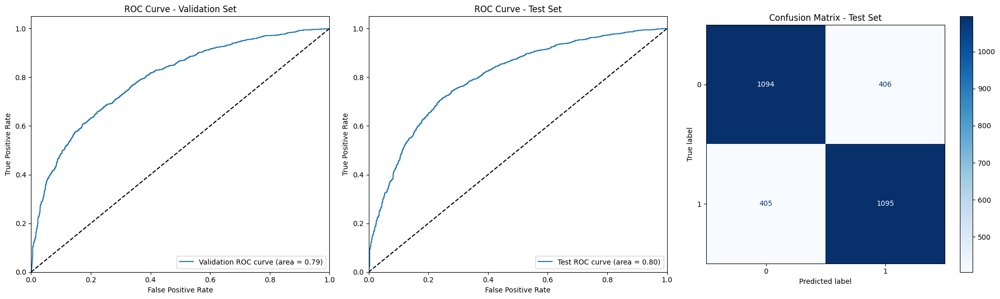

2024/09/23 02:51:46 INFO mlflow.tracking._tracking_service.client: 🏃 View run rogue-horse-989 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/a0119780c6b945828c8ec29246fd9078.
2024/09/23 02:51:46 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Linear SVC with best hyperparameters...


2024/09/23 02:51:50 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Linear SVC - text_dl with best params {'C': 0.01, 'max_iter': 1000}:
Validation - Accuracy: 0.7143, Recall: 0.6973, F1 Score: 0.7094, AUC: 0.7933
Test - Accuracy: 0.7297, Recall: 0.7333, F1 Score: 0.7307, AUC: 0.7971
--------------------------------------------------------------------------------


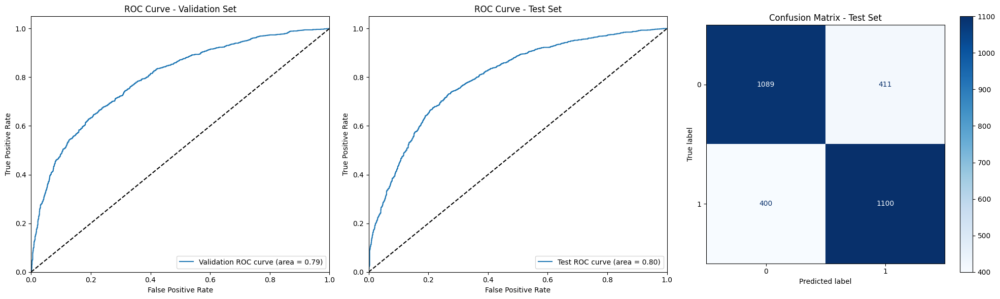

2024/09/23 02:51:51 INFO mlflow.tracking._tracking_service.client: 🏃 View run caring-trout-199 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/95090c8ba6b340f281b9776aea6b0604.
2024/09/23 02:51:51 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Decision Tree with best hyperparameters...


2024/09/23 02:51:58 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Decision Tree - text_dl with best params {'max_depth': 10, 'min_samples_split': 5}:
Validation - Accuracy: 0.6050, Recall: 0.5420, F1 Score: 0.5784, AUC: 0.6154
Test - Accuracy: 0.6010, Recall: 0.5633, F1 Score: 0.5854, AUC: 0.6155
--------------------------------------------------------------------------------


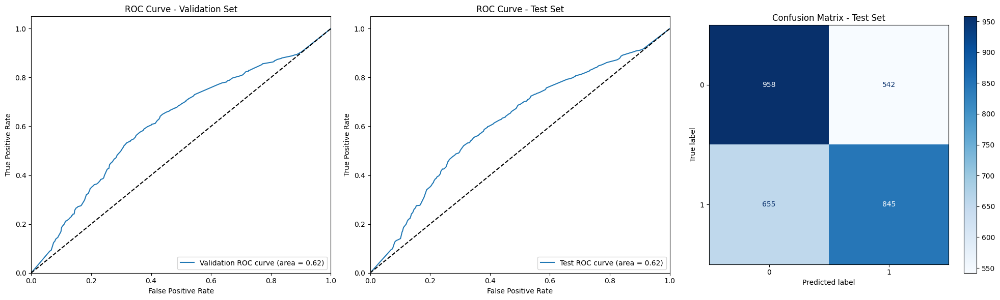

2024/09/23 02:51:59 INFO mlflow.tracking._tracking_service.client: 🏃 View run spiffy-midge-836 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/965a511aa0d04b70bd9c0036b1006116.
2024/09/23 02:51:59 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Random Forest with best hyperparameters...


2024/09/23 02:53:07 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Random Forest - text_dl with best params {'max_depth': None, 'min_samples_split': 10, 'n_estimators': 300}:
Validation - Accuracy: 0.7067, Recall: 0.7173, F1 Score: 0.7098, AUC: 0.7724
Test - Accuracy: 0.6983, Recall: 0.7073, F1 Score: 0.7010, AUC: 0.7689
--------------------------------------------------------------------------------


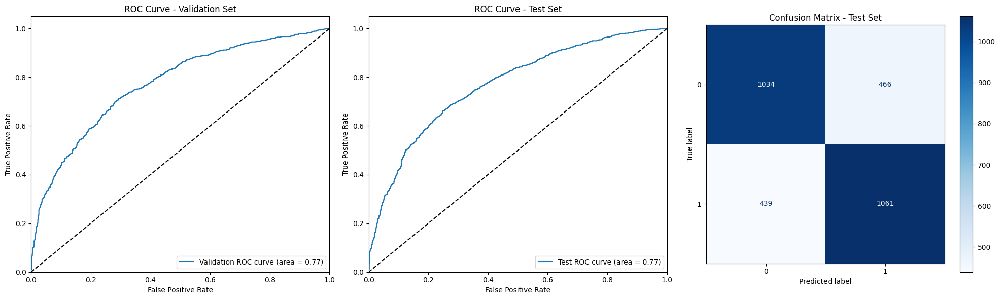

2024/09/23 02:53:08 INFO mlflow.tracking._tracking_service.client: 🏃 View run monumental-rook-542 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/9eddc1a332424273b1e5690687523701.
2024/09/23 02:53:08 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Extra Trees with best hyperparameters...


2024/09/23 02:53:18 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Extra Trees - text_dl with best params {'max_depth': 20, 'min_samples_split': 10, 'n_estimators': 200}:
Validation - Accuracy: 0.6983, Recall: 0.6860, F1 Score: 0.6946, AUC: 0.7681
Test - Accuracy: 0.6957, Recall: 0.6893, F1 Score: 0.6937, AUC: 0.7646
--------------------------------------------------------------------------------


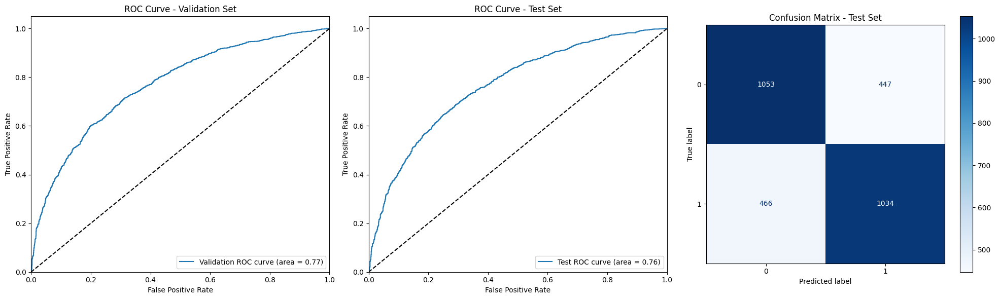

2024/09/23 02:53:20 INFO mlflow.tracking._tracking_service.client: 🏃 View run bald-wren-385 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/1976fab1684942488e27c16aca701f8e.
2024/09/23 02:53:20 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.
C:\Users\steph\anaconda3\envs\p7_bis\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Training AdaBoost with best hyperparameters...


2024/09/23 02:55:17 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model AdaBoost - text_dl with best params {'learning_rate': 1, 'n_estimators': 200}:
Validation - Accuracy: 0.6977, Recall: 0.6860, F1 Score: 0.6941, AUC: 0.7708
Test - Accuracy: 0.6933, Recall: 0.6853, F1 Score: 0.6909, AUC: 0.7615
--------------------------------------------------------------------------------


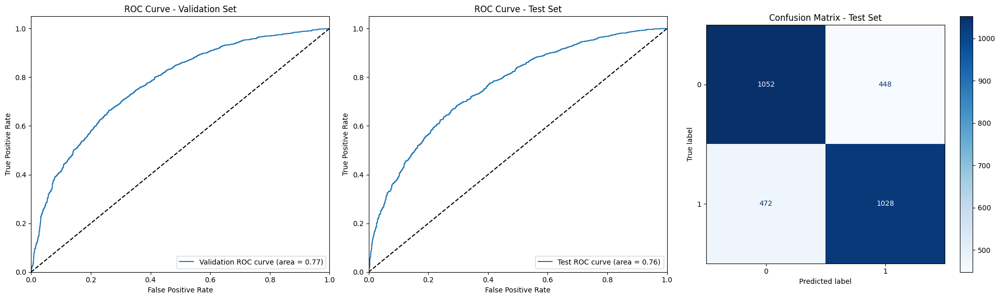

2024/09/23 02:55:18 INFO mlflow.tracking._tracking_service.client: 🏃 View run adventurous-slug-472 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/7562804532e843808578160f0d786756.
2024/09/23 02:55:18 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Gradient Boosting with best hyperparameters...


2024/09/23 03:03:16 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Gradient Boosting - text_dl with best params {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200}:
Validation - Accuracy: 0.7153, Recall: 0.7040, F1 Score: 0.7121, AUC: 0.7903
Test - Accuracy: 0.7107, Recall: 0.7020, F1 Score: 0.7081, AUC: 0.7818
--------------------------------------------------------------------------------


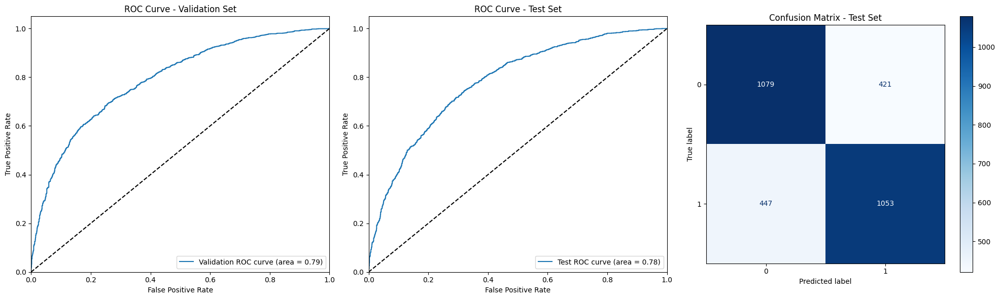

2024/09/23 03:03:17 INFO mlflow.tracking._tracking_service.client: 🏃 View run smiling-fawn-932 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/a2499035ae5f486eae814b734ca864d4.
2024/09/23 03:03:17 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training XGBoost with best hyperparameters...


2024/09/23 03:03:27 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model XGBoost - text_dl with best params {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100}:
Validation - Accuracy: 0.7173, Recall: 0.7047, F1 Score: 0.7137, AUC: 0.7867
Test - Accuracy: 0.7163, Recall: 0.7113, F1 Score: 0.7149, AUC: 0.7881
--------------------------------------------------------------------------------


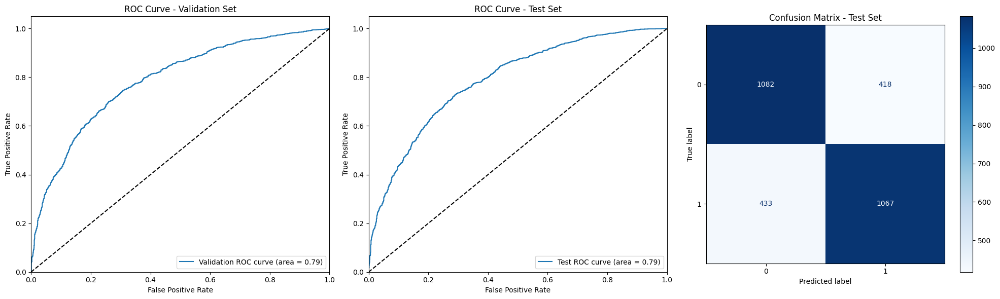

2024/09/23 03:03:28 INFO mlflow.tracking._tracking_service.client: 🏃 View run vaunted-flea-202 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/638c05aec6da45b58d322ad277f88438.
2024/09/23 03:03:28 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training LightGBM with best hyperparameters...
[LightGBM] [Info] Number of positive: 7000, number of negative: 7000
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 14000, number of used features: 300
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


2024/09/23 03:03:37 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model LightGBM - text_dl with best params {'learning_rate': 0.2, 'n_estimators': 300, 'num_leaves': 50}:
Validation - Accuracy: 0.7200, Recall: 0.7133, F1 Score: 0.7181, AUC: 0.7881
Test - Accuracy: 0.7160, Recall: 0.7027, F1 Score: 0.7122, AUC: 0.7963
--------------------------------------------------------------------------------


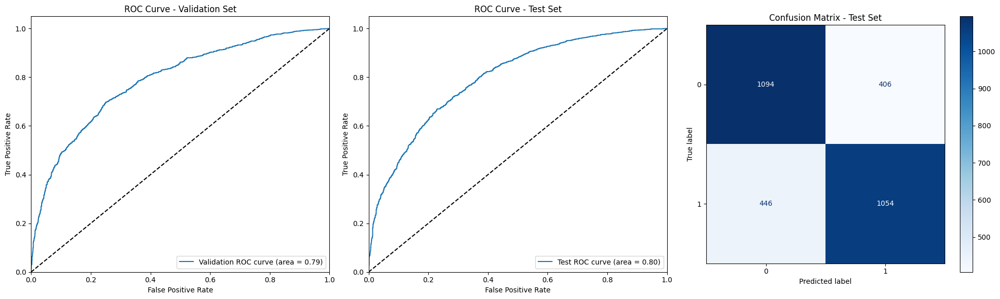

2024/09/23 03:03:38 INFO mlflow.tracking._tracking_service.client: 🏃 View run bouncy-squirrel-548 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/0824dc16f6c7423a9f2af9968607aca3.
2024/09/23 03:03:38 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training CatBoost with best hyperparameters...
0:	learn: 0.6812574	total: 12.8ms	remaining: 2.55s
1:	learn: 0.6734304	total: 25ms	remaining: 2.47s
2:	learn: 0.6669012	total: 37.6ms	remaining: 2.47s
3:	learn: 0.6606444	total: 49.7ms	remaining: 2.43s
4:	learn: 0.6553850	total: 61ms	remaining: 2.38s
5:	learn: 0.6492345	total: 73.7ms	remaining: 2.38s
6:	learn: 0.6441580	total: 85.8ms	remaining: 2.37s
7:	learn: 0.6404520	total: 98.4ms	remaining: 2.36s
8:	learn: 0.6369840	total: 111ms	remaining: 2.35s
9:	learn: 0.6332891	total: 123ms	remaining: 2.34s
10:	learn: 0.6294715	total: 135ms	remaining: 2.32s
11:	learn: 0.6266099	total: 147ms	remaining: 2.3s
12:	learn: 0.6237067	total: 159ms	remaining: 2.29s
13:	learn: 0.6215970	total: 171ms	remaining: 2.28s
14:	learn: 0.6189405	total: 184ms	remaining: 2.27s
15:	learn: 0.6167695	total: 196ms	remaining: 2.25s
16:	learn: 0.6145897	total: 208ms	remaining: 2.24s
17:	learn: 0.6123814	total: 221ms	remaining: 2.24s
18:	learn: 0.6103823	total: 234ms	remainin

2024/09/23 03:03:45 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model CatBoost - text_dl with best params {'depth': 3, 'iterations': 200, 'learning_rate': 0.2}:
Validation - Accuracy: 0.7170, Recall: 0.7020, F1 Score: 0.7127, AUC: 0.7867
Test - Accuracy: 0.7080, Recall: 0.6920, F1 Score: 0.7033, AUC: 0.7851
--------------------------------------------------------------------------------


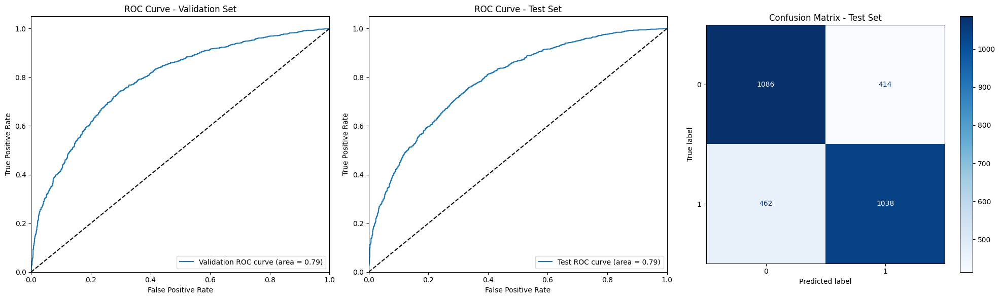

2024/09/23 03:03:46 INFO mlflow.tracking._tracking_service.client: 🏃 View run skillful-wolf-990 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/2d68b4863e0a497a921d954775cfeae0.
2024/09/23 03:03:46 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training MLP Classifier with best hyperparameters...


2024/09/23 03:04:11 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model MLP Classifier - text_dl with best params {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (100,), 'solver': 'sgd'}:
Validation - Accuracy: 0.7197, Recall: 0.7040, F1 Score: 0.7152, AUC: 0.7928
Test - Accuracy: 0.7157, Recall: 0.7127, F1 Score: 0.7148, AUC: 0.7826
--------------------------------------------------------------------------------


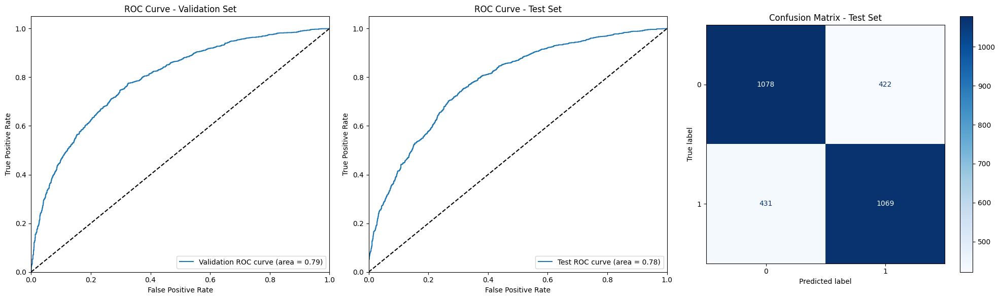

2024/09/23 03:04:11 INFO mlflow.tracking._tracking_service.client: 🏃 View run stately-roo-83 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/8327da4904914fbdb3b462383e392584.
2024/09/23 03:04:11 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training K-Nearest Neighbors with best hyperparameters...


2024/09/23 03:04:29 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model K-Nearest Neighbors - text_dl with best params {'weights': 'distance', 'n_neighbors': 5, 'metric': 'manhattan'}:
Validation - Accuracy: 0.6297, Recall: 0.5547, F1 Score: 0.5996, AUC: 0.6733
Test - Accuracy: 0.6233, Recall: 0.5427, F1 Score: 0.5903, AUC: 0.6718
--------------------------------------------------------------------------------


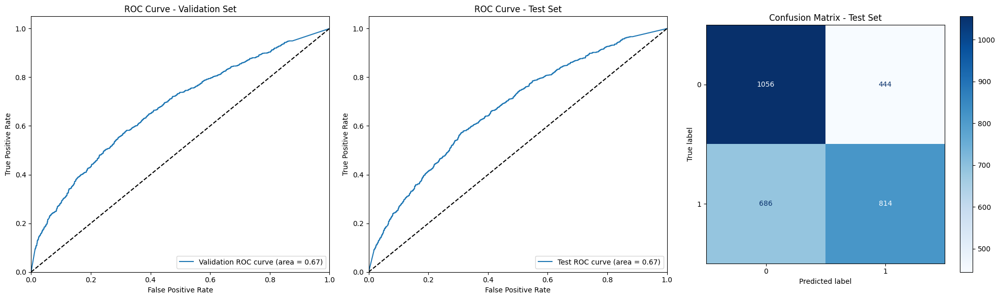

2024/09/23 03:04:30 INFO mlflow.tracking._tracking_service.client: 🏃 View run exultant-wolf-188 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/b13181dea87c4c9b8a401337f98ced63.
2024/09/23 03:04:30 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training SVM with RBF Kernel with best hyperparameters...


2024/09/23 03:07:18 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model SVM with RBF Kernel - text_dl with best params {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}:
Validation - Accuracy: 0.7163, Recall: 0.7073, F1 Score: 0.7138, AUC: 0.7928
Test - Accuracy: 0.7153, Recall: 0.7153, F1 Score: 0.7153, AUC: 0.7851
--------------------------------------------------------------------------------


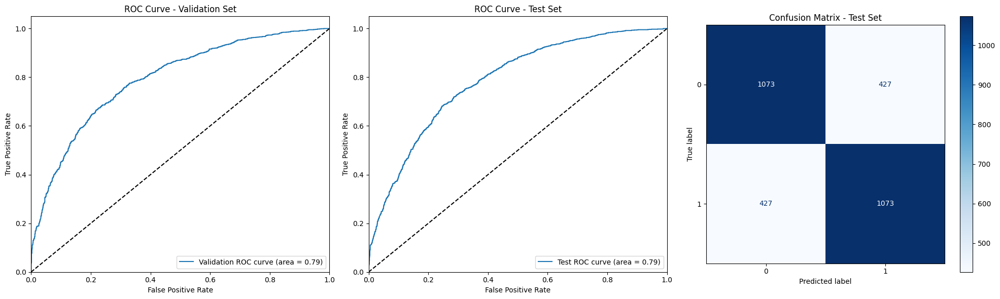

2024/09/23 03:07:19 INFO mlflow.tracking._tracking_service.client: 🏃 View run clumsy-elk-763 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/05d7f25837664ae7894bd23b92977c39.
2024/09/23 03:07:19 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


In [91]:
for model, model_name in models:
    # Obtention des meilleurs hyperparamètres pour le modèle
    best_params = best_params_dict_glove[model_name]

    # Créer une nouvelle instance du modèle
    model = model.__class__()

    model.set_params(**best_params)
    
    print(f"Training {model_name} with best hyperparameters...")
    # Appel de la fonction avec le modèle, le nom du modèle et les meilleurs hyperparamètres
    track_model_with_mlflow(
        text_column=text_column, 
        model=model, 
        model_name=model_name, 
        best_params=best_params,
        word_embedding="GloVe",
        X_train_embedding=X_train_glove, 
        y_train=y_train, 
        X_val_embedding=X_val_glove, 
        y_val=y_val, 
        X_test_embedding=X_test_glove, 
        y_test=y_test
    )

### 8.3.c. Test du modèle Bidirectional LSTM

Epoch 1/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - accuracy: 0.5012 - loss: 0.6933 - val_accuracy: 0.5533 - val_loss: 0.6923
Epoch 2/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.5184 - loss: 0.6934 - val_accuracy: 0.5200 - val_loss: 0.6922
Epoch 3/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - accuracy: 0.4747 - loss: 0.6946 - val_accuracy: 0.5033 - val_loss: 0.6925
Epoch 4/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - accuracy: 0.5022 - loss: 0.6935 - val_accuracy: 0.5300 - val_loss: 0.6908
Epoch 5/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - accuracy: 0.5129 - loss: 0.6910 - val_accuracy: 0.5233 - val_loss: 0.6915
Epoch 6/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 122ms/step - accuracy: 0.5350 - loss: 0.6919 - val_accuracy: 0.5333 - val_loss: 0.6900
Epoch 7/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - accuracy: 0.5180 - loss: 0.6905 - val_accuracy: 0.5267 - val_loss: 0.6876
Epoch 8/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 122ms/step - accuracy: 0.5413 - loss: 0.6880 - val_accuracy: 0.

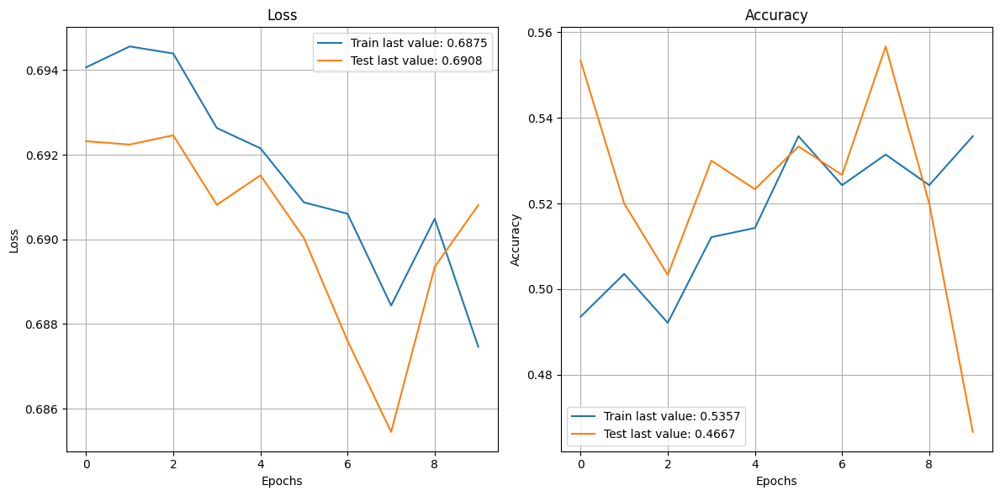

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


2024/09/23 03:08:18 WARNING mlflow.keras.save: You are saving a Keras model without specifying model signature.
2024/09/23 03:08:25 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Validation - Accuracy: 0.4667, Recall: 0.5333, F1 Score: 0.5000, AUC: 0.5269
Test - Accuracy: 0.5000, Recall: 0.5733, F1 Score: 0.5342, AUC: 0.5039
--------------------------------------------------------------------------------


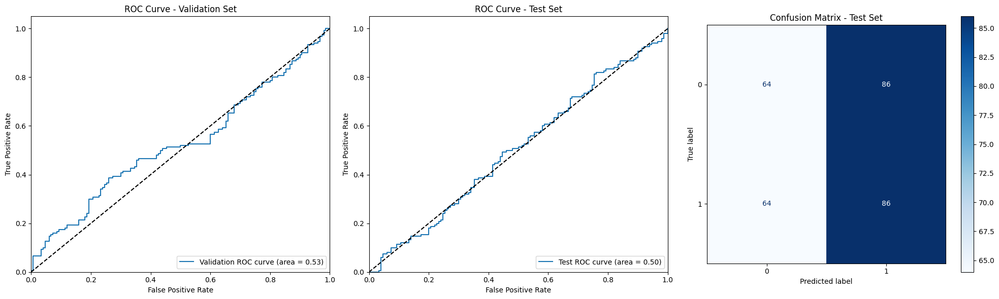

2024/09/23 03:08:26 INFO mlflow.tracking._tracking_service.client: 🏃 View run bald-shrew-184 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/d322dbf84a0a4d289d6f8714586e9790.
2024/09/23 03:08:26 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


In [92]:
# Appel de la fonction avec les données
track_model_with_mlflow_for_bidirectional_lstm(
    text_column="text", 
    vocab_size=5000, 
    embedding_dim=64, 
    word_embedding="GloVe",
    input_length=X_train_glove_sample.shape[1],
    X_train_embedding=X_train_glove_sample, 
    y_train=y_train_sample, 
    X_val_embedding=X_val_glove_sample, 
    y_val=y_val_sample, 
    X_test_embedding=X_test_glove_sample, 
    y_test=y_test_sample
)

## 8.4. Avec FastText

In [93]:
# Entraînement du modèle FastText
fasttext_model = FastText(sentences=[text.split() for text in X_train], vector_size=300, window=5, min_count=1, workers=4)

In [94]:
# Sauvegarde du modèle FastText
fasttext_model.save("api/embeddings/fasttext_model.bin")

In [95]:
# Vectorisation des jeux de données
X_train_fasttext = np.array([vectorize_text_w2v(text, fasttext_model) for text in X_train])
X_val_fasttext = np.array([vectorize_text_w2v(text, fasttext_model) for text in X_val])
X_test_fasttext = np.array([vectorize_text_w2v(text, fasttext_model) for text in X_test])

# Normalisation des données
scaler = StandardScaler()
X_train_fasttext = scaler.fit_transform(X_train_fasttext)
X_val_fasttext = scaler.transform(X_val_fasttext)
X_test_fasttext = scaler.transform(X_test_fasttext)

In [96]:
# Entraînement du modèle FastText
fasttext_model_sample = FastText(sentences=[text.split() for text in X_train_sample], vector_size=300, window=5, min_count=1, workers=4)

# Vectorisation des jeux de données
X_train_fasttext_sample = np.array([vectorize_text_w2v(text, fasttext_model_sample) for text in X_train_sample])
X_val_fasttext_sample = np.array([vectorize_text_w2v(text, fasttext_model_sample) for text in X_val_sample])
X_test_fasttext_sample = np.array([vectorize_text_w2v(text, fasttext_model_sample) for text in X_test_sample])

# Normalisation des données
scaler = StandardScaler()
X_train_fasttext_sample = scaler.fit_transform(X_train_fasttext_sample)
X_val_fasttext_sample = scaler.transform(X_val_fasttext_sample)
X_test_fasttext_sample = scaler.transform(X_test_fasttext_sample)

### 8.4.a. Gestion des hyperparamètres

In [97]:
# Recherche d'hyperparamètres pour chaque modèle
best_params_dict_fasttext = {}
for model, model_name in models:
    param_grid = param_grids.get(model_name)
    
    print(f"Performing GridSearchCV for {model_name}...")
    best_model, best_params = perform_grid_search(model, param_grid, X_train_fasttext_sample, y_train_sample)
    best_params_dict_fasttext[model_name] = best_params

Performing GridSearchCV for Logistic Regression...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Performing GridSearchCV for Linear SVC...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Performing GridSearchCV for Decision Tree...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Performing GridSearchCV for Random Forest...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for Extra Trees...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for AdaBoost...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Performing GridSearchCV for Gradient Boosting...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for LightGBM...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
[LightGBM] [Info] Number of positive: 700, number of 

### 8.4.b. Test des modèles

Training Logistic Regression with best hyperparameters...


2024/09/23 04:09:30 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Logistic Regression - text_dl with best params {'C': 100, 'solver': 'liblinear'}:
Validation - Accuracy: 0.6987, Recall: 0.6880, F1 Score: 0.6954, AUC: 0.7661
Test - Accuracy: 0.7077, Recall: 0.7093, F1 Score: 0.7082, AUC: 0.7766
--------------------------------------------------------------------------------


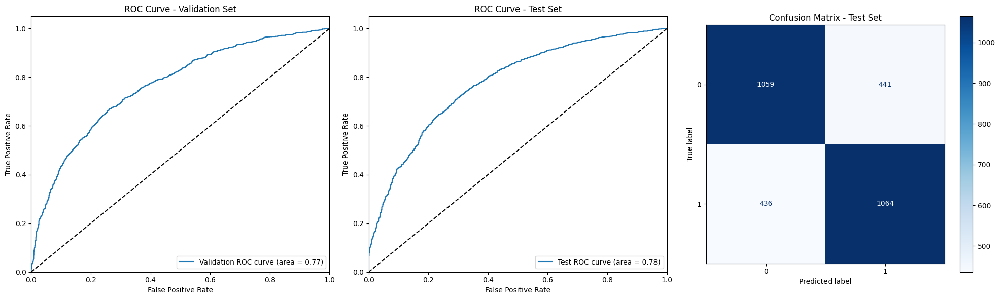

2024/09/23 04:09:30 INFO mlflow.tracking._tracking_service.client: 🏃 View run classy-dove-138 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/b377947195284034a422fdd1a3456044.
2024/09/23 04:09:30 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Linear SVC with best hyperparameters...


2024/09/23 04:09:48 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Linear SVC - text_dl with best params {'C': 10, 'max_iter': 1000}:
Validation - Accuracy: 0.6993, Recall: 0.6933, F1 Score: 0.6975, AUC: 0.7655
Test - Accuracy: 0.7063, Recall: 0.7093, F1 Score: 0.7072, AUC: 0.7765
--------------------------------------------------------------------------------


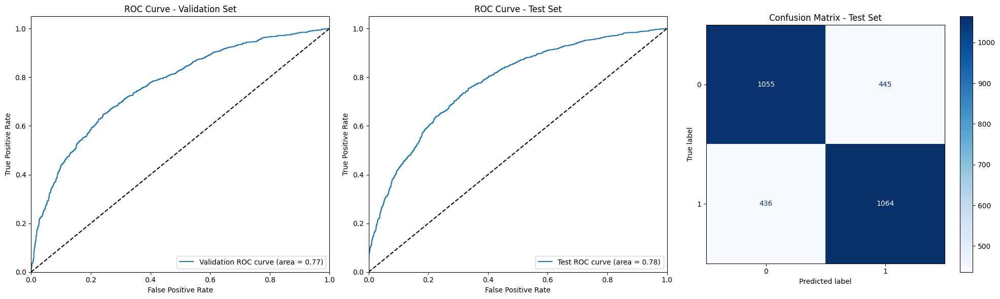

2024/09/23 04:09:49 INFO mlflow.tracking._tracking_service.client: 🏃 View run upset-mouse-159 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/26544cb9e0c14ed0a5a50196c3a45608.
2024/09/23 04:09:49 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Decision Tree with best hyperparameters...


2024/09/23 04:09:57 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Decision Tree - text_dl with best params {'max_depth': 10, 'min_samples_split': 10}:
Validation - Accuracy: 0.5717, Recall: 0.5607, F1 Score: 0.5669, AUC: 0.5895
Test - Accuracy: 0.5583, Recall: 0.5647, F1 Score: 0.5611, AUC: 0.5654
--------------------------------------------------------------------------------


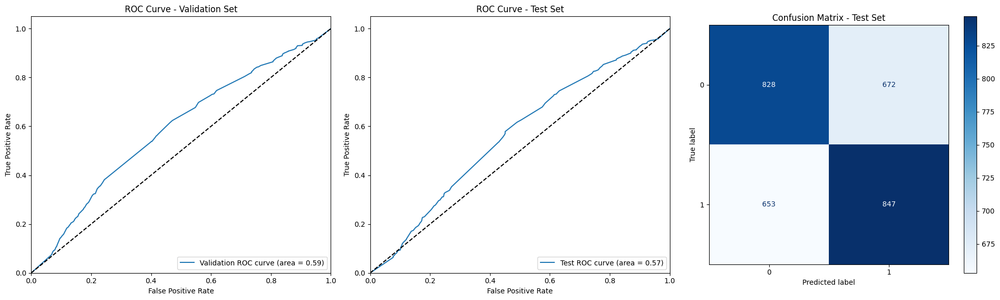

2024/09/23 04:09:58 INFO mlflow.tracking._tracking_service.client: 🏃 View run treasured-skink-131 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/17f38e79d09a4cb5aa7977e01f9dd6b2.
2024/09/23 04:09:58 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Random Forest with best hyperparameters...


2024/09/23 04:10:50 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Random Forest - text_dl with best params {'max_depth': 20, 'min_samples_split': 5, 'n_estimators': 200}:
Validation - Accuracy: 0.5950, Recall: 0.6100, F1 Score: 0.6010, AUC: 0.6318
Test - Accuracy: 0.5773, Recall: 0.5653, F1 Score: 0.5722, AUC: 0.6065
--------------------------------------------------------------------------------


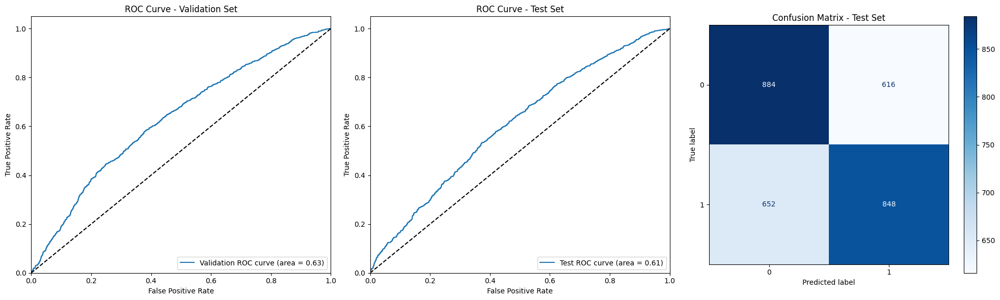

2024/09/23 04:10:51 INFO mlflow.tracking._tracking_service.client: 🏃 View run intrigued-snake-416 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/34b901dc776147f79723835aa08407bb.
2024/09/23 04:10:51 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Extra Trees with best hyperparameters...


2024/09/23 04:10:58 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Extra Trees - text_dl with best params {'max_depth': 20, 'min_samples_split': 5, 'n_estimators': 100}:
Validation - Accuracy: 0.5937, Recall: 0.5987, F1 Score: 0.5957, AUC: 0.6213
Test - Accuracy: 0.5663, Recall: 0.5567, F1 Score: 0.5621, AUC: 0.5930
--------------------------------------------------------------------------------


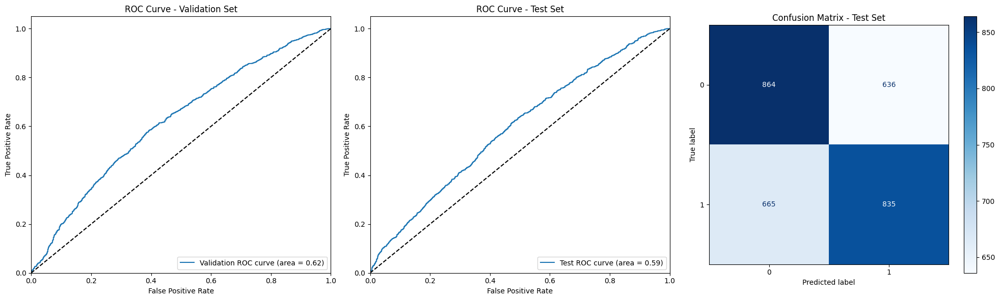

2024/09/23 04:10:59 INFO mlflow.tracking._tracking_service.client: 🏃 View run shivering-foal-989 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/a93c9239a4d24f528e192e8e71e77098.
2024/09/23 04:10:59 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.
C:\Users\steph\anaconda3\envs\p7_bis\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Training AdaBoost with best hyperparameters...


2024/09/23 04:12:57 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model AdaBoost - text_dl with best params {'learning_rate': 1, 'n_estimators': 200}:
Validation - Accuracy: 0.6020, Recall: 0.5953, F1 Score: 0.5993, AUC: 0.6460
Test - Accuracy: 0.5823, Recall: 0.5887, F1 Score: 0.5850, AUC: 0.6172
--------------------------------------------------------------------------------


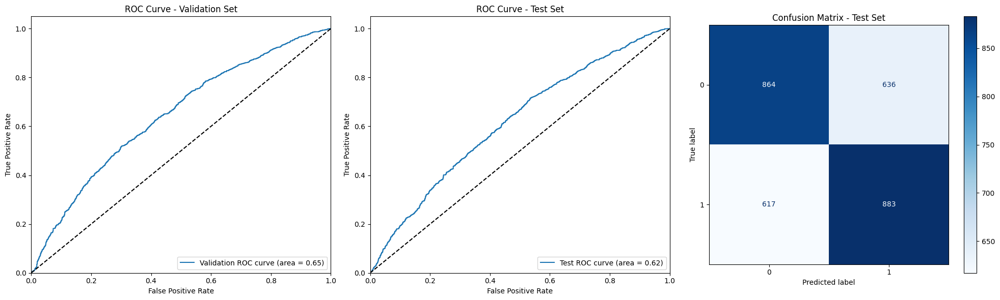

2024/09/23 04:12:57 INFO mlflow.tracking._tracking_service.client: 🏃 View run worried-fawn-637 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/ad8661234d8040a49f02a6b835033a27.
2024/09/23 04:12:57 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Gradient Boosting with best hyperparameters...


2024/09/23 04:15:26 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Gradient Boosting - text_dl with best params {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100}:
Validation - Accuracy: 0.6167, Recall: 0.6167, F1 Score: 0.6167, AUC: 0.6513
Test - Accuracy: 0.5890, Recall: 0.5847, F1 Score: 0.5872, AUC: 0.6261
--------------------------------------------------------------------------------


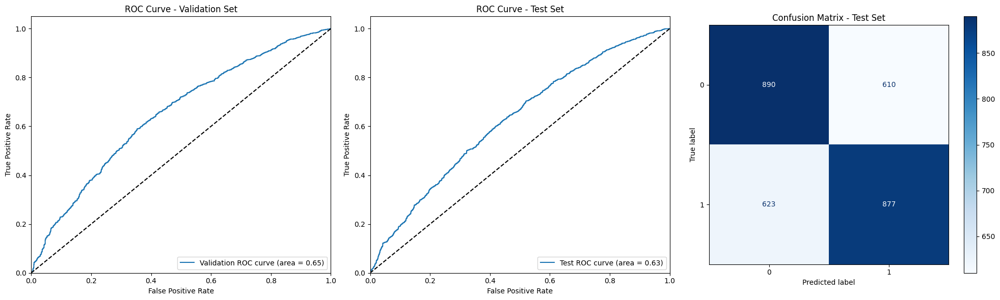

2024/09/23 04:15:27 INFO mlflow.tracking._tracking_service.client: 🏃 View run adorable-quail-195 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/bf07fe99d32945388c777af154fd9556.
2024/09/23 04:15:27 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training XGBoost with best hyperparameters...


2024/09/23 04:15:35 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model XGBoost - text_dl with best params {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}:
Validation - Accuracy: 0.6053, Recall: 0.6060, F1 Score: 0.6056, AUC: 0.6484
Test - Accuracy: 0.5970, Recall: 0.5947, F1 Score: 0.5961, AUC: 0.6313
--------------------------------------------------------------------------------


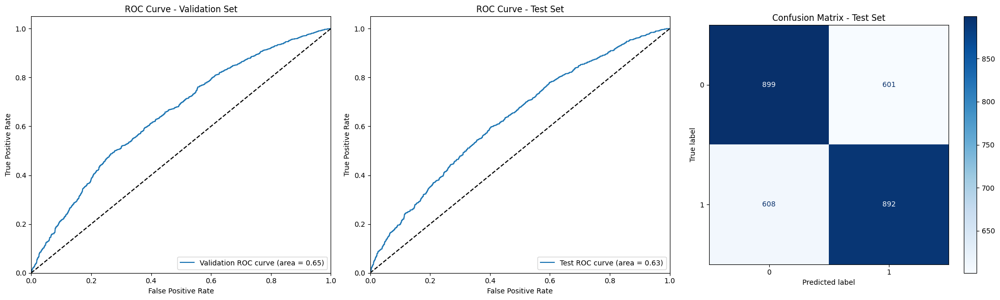

2024/09/23 04:15:35 INFO mlflow.tracking._tracking_service.client: 🏃 View run wistful-ape-917 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/bf45bc01e8524aea9e24e96a61adb756.
2024/09/23 04:15:35 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training LightGBM with best hyperparameters...
[LightGBM] [Info] Number of positive: 7000, number of negative: 7000
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 14000, number of used features: 300
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


2024/09/23 04:15:42 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model LightGBM - text_dl with best params {'learning_rate': 0.1, 'n_estimators': 300, 'num_leaves': 40}:
Validation - Accuracy: 0.5943, Recall: 0.5927, F1 Score: 0.5937, AUC: 0.6322
Test - Accuracy: 0.5777, Recall: 0.5620, F1 Score: 0.5709, AUC: 0.6166
--------------------------------------------------------------------------------


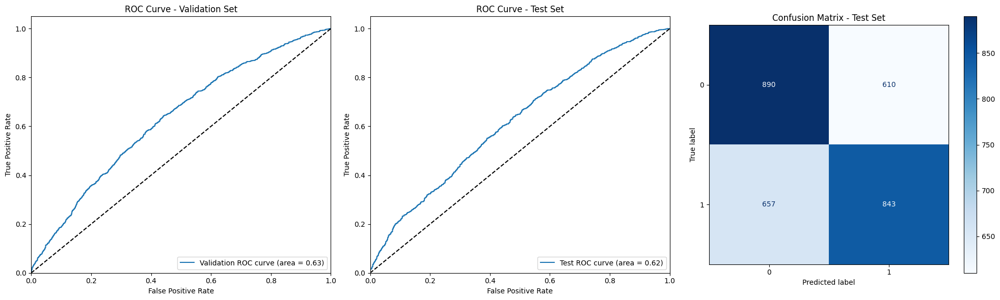

2024/09/23 04:15:43 INFO mlflow.tracking._tracking_service.client: 🏃 View run clean-dog-324 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/2faf59c2357c48bebdb8c24c40b1362e.
2024/09/23 04:15:43 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training CatBoost with best hyperparameters...
0:	learn: 0.6891838	total: 13.8ms	remaining: 4.13s
1:	learn: 0.6851774	total: 26.9ms	remaining: 4s
2:	learn: 0.6823264	total: 40.4ms	remaining: 4s
3:	learn: 0.6804741	total: 54.4ms	remaining: 4.03s
4:	learn: 0.6788501	total: 68.1ms	remaining: 4.01s
5:	learn: 0.6769387	total: 82.1ms	remaining: 4.02s
6:	learn: 0.6752140	total: 95.2ms	remaining: 3.98s
7:	learn: 0.6736834	total: 108ms	remaining: 3.96s
8:	learn: 0.6724169	total: 122ms	remaining: 3.94s
9:	learn: 0.6716291	total: 135ms	remaining: 3.92s
10:	learn: 0.6706317	total: 150ms	remaining: 3.94s
11:	learn: 0.6695775	total: 164ms	remaining: 3.93s
12:	learn: 0.6687238	total: 178ms	remaining: 3.92s
13:	learn: 0.6674975	total: 192ms	remaining: 3.92s
14:	learn: 0.6668652	total: 206ms	remaining: 3.92s
15:	learn: 0.6664201	total: 221ms	remaining: 3.92s
16:	learn: 0.6656271	total: 235ms	remaining: 3.92s
17:	learn: 0.6650565	total: 252ms	remaining: 3.94s
18:	learn: 0.6646806	total: 267ms	remaining:

2024/09/23 04:15:52 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model CatBoost - text_dl with best params {'depth': 3, 'iterations': 300, 'learning_rate': 0.1}:
Validation - Accuracy: 0.6130, Recall: 0.6127, F1 Score: 0.6129, AUC: 0.6554
Test - Accuracy: 0.5907, Recall: 0.5967, F1 Score: 0.5931, AUC: 0.6287
--------------------------------------------------------------------------------


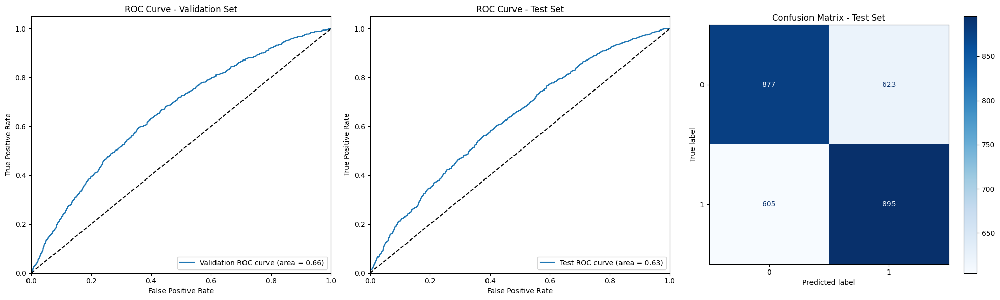

2024/09/23 04:15:52 INFO mlflow.tracking._tracking_service.client: 🏃 View run secretive-gnat-130 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/95bda8f880fb4b3a99c0c6e2ed938cff.
2024/09/23 04:15:52 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training MLP Classifier with best hyperparameters...


2024/09/23 04:16:30 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model MLP Classifier - text_dl with best params {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (100, 50), 'solver': 'adam'}:
Validation - Accuracy: 0.6280, Recall: 0.6440, F1 Score: 0.6339, AUC: 0.6650
Test - Accuracy: 0.6107, Recall: 0.6173, F1 Score: 0.6132, AUC: 0.6640
--------------------------------------------------------------------------------


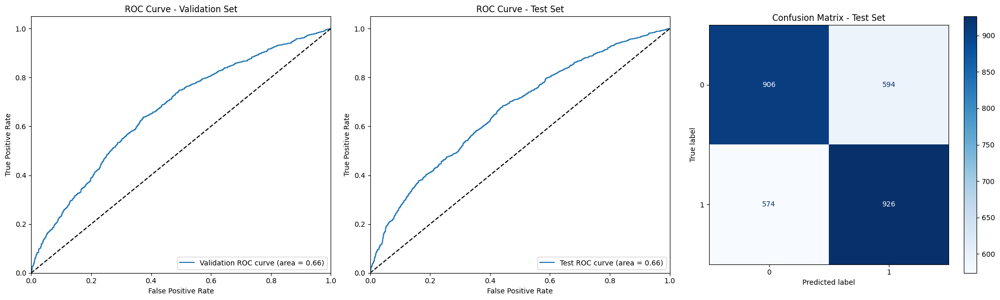

2024/09/23 04:16:31 INFO mlflow.tracking._tracking_service.client: 🏃 View run adaptable-hound-468 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/5a417ef121df4068b037681ac52a07d5.
2024/09/23 04:16:31 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training K-Nearest Neighbors with best hyperparameters...


2024/09/23 04:16:39 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model K-Nearest Neighbors - text_dl with best params {'weights': 'distance', 'n_neighbors': 9, 'metric': 'euclidean'}:
Validation - Accuracy: 0.5513, Recall: 0.5193, F1 Score: 0.5365, AUC: 0.5724
Test - Accuracy: 0.5533, Recall: 0.5133, F1 Score: 0.5347, AUC: 0.5716
--------------------------------------------------------------------------------


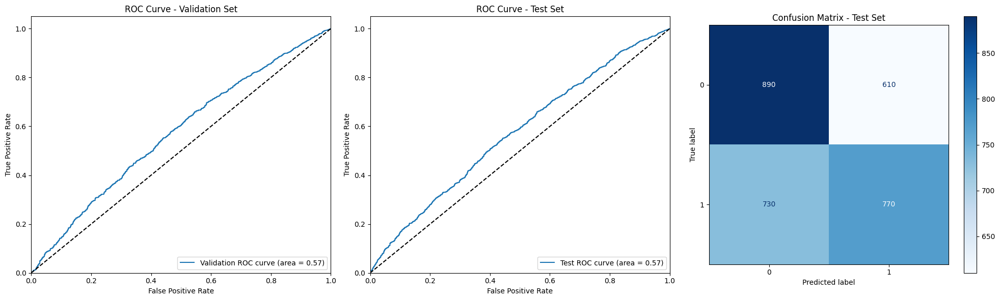

2024/09/23 04:16:40 INFO mlflow.tracking._tracking_service.client: 🏃 View run suave-mule-250 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/247574ab4a6b4fde8befea67d144a88b.
2024/09/23 04:16:40 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training SVM with RBF Kernel with best hyperparameters...


2024/09/23 05:16:14 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model SVM with RBF Kernel - text_dl with best params {'C': 100, 'gamma': 'scale', 'kernel': 'linear'}:
Validation - Accuracy: 0.6993, Recall: 0.6847, F1 Score: 0.6949, AUC: 0.7646
Test - Accuracy: 0.7077, Recall: 0.7067, F1 Score: 0.7074, AUC: 0.7775
--------------------------------------------------------------------------------


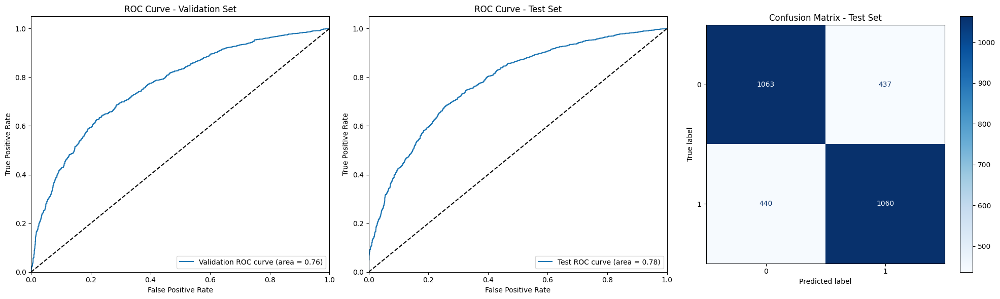

2024/09/23 05:16:15 INFO mlflow.tracking._tracking_service.client: 🏃 View run vaunted-eel-520 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/3de2aa2680824526befeefd285f56141.
2024/09/23 05:16:15 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


In [98]:
for model, model_name in models:
    # Obtention des meilleurs hyperparamètres pour le modèle
    best_params = best_params_dict_fasttext[model_name]

    # Créer une nouvelle instance du modèle
    model = model.__class__()

    model.set_params(**best_params)    
    
    print(f"Training {model_name} with best hyperparameters...")
    # Appel de la fonction avec le modèle, le nom du modèle et les meilleurs hyperparamètres
    track_model_with_mlflow(
        text_column=text_column, 
        model=model, 
        model_name=model_name, 
        best_params=best_params,
        word_embedding="FastText",
        X_train_embedding=X_train_fasttext, 
        y_train=y_train, 
        X_val_embedding=X_val_fasttext, 
        y_val=y_val, 
        X_test_embedding=X_test_fasttext, 
        y_test=y_test
    )

### 8.4.c. Test du modèle Bidirectional LSTM

Epoch 1/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - accuracy: 0.4995 - loss: 0.6950 - val_accuracy: 0.5300 - val_loss: 0.6918
Epoch 2/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 8s 172ms/step - accuracy: 0.5112 - loss: 0.6915 - val_accuracy: 0.5233 - val_loss: 0.6896
Epoch 3/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - accuracy: 0.5238 - loss: 0.6942 - val_accuracy: 0.5300 - val_loss: 0.6896
Epoch 4/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 7s 165ms/step - accuracy: 0.5053 - loss: 0.6928 - val_accuracy: 0.5300 - val_loss: 0.6878
Epoch 5/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - accuracy: 0.5208 - loss: 0.6913 - val_accuracy: 0.5367 - val_loss: 0.6870
Epoch 6/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - accuracy: 0.5338 - loss: 0.6887 - val_accuracy: 0.5300 - val_loss: 0.6878
Epoch 7/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - accuracy: 0.5258 - loss: 0.6898 - val_accuracy: 0.5367 - val_loss: 0.6879
Epoch 8/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - accuracy: 0.5136 - loss: 0.6882 - val_accuracy: 0

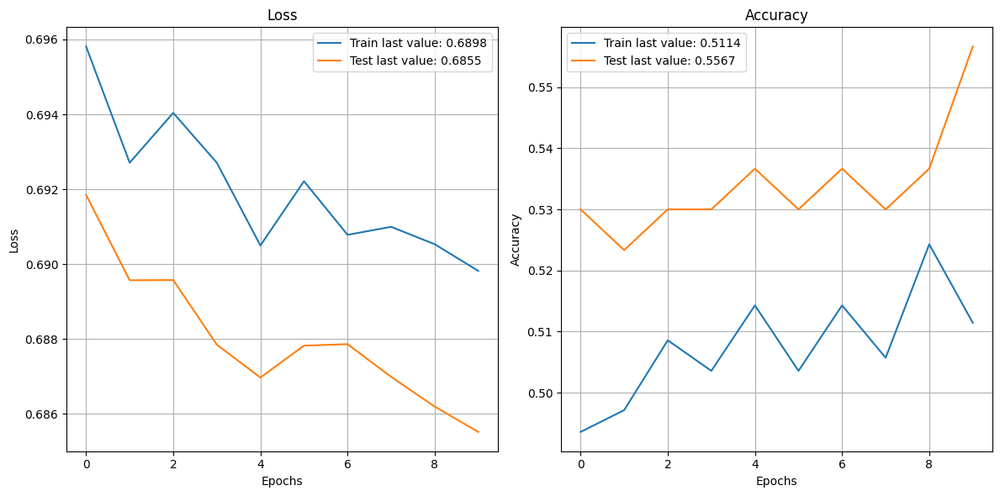

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


2024/09/23 05:17:30 WARNING mlflow.keras.save: You are saving a Keras model without specifying model signature.
2024/09/23 05:17:38 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Validation - Accuracy: 0.5567, Recall: 0.2733, F1 Score: 0.3814, AUC: 0.5778
Test - Accuracy: 0.5167, Recall: 0.2733, F1 Score: 0.3612, AUC: 0.4579
--------------------------------------------------------------------------------


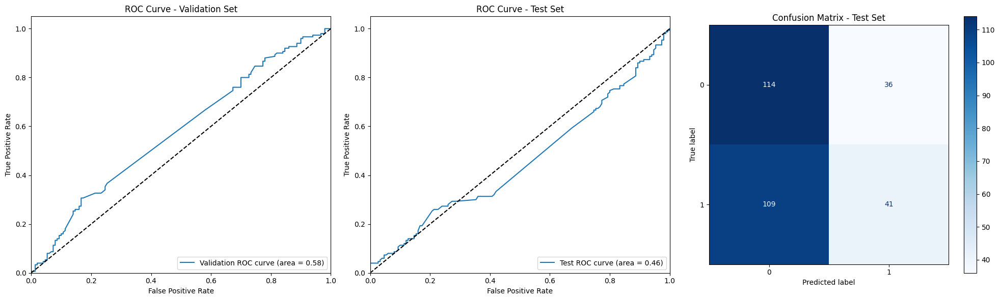

2024/09/23 05:17:39 INFO mlflow.tracking._tracking_service.client: 🏃 View run clean-mink-914 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/0d18ab5d2d284b3c96336014ab558e12.
2024/09/23 05:17:39 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


In [99]:
# Appel de la fonction avec les données
track_model_with_mlflow_for_bidirectional_lstm(
    text_column="text", 
    vocab_size=5000, 
    embedding_dim=64, 
    word_embedding="FastText",
    input_length=X_train_fasttext_sample.shape[1],
    X_train_embedding=X_train_fasttext_sample, 
    y_train=y_train_sample, 
    X_val_embedding=X_val_fasttext_sample, 
    y_val=y_val_sample,
    X_test_embedding=X_test_fasttext_sample,
    y_test=y_test_sample
)

## 8.5. Avec BERT

In [100]:
# Chargement du modèle et du tokenizer BERT
bert_model = TFBertModel.from_pretrained('bert-base-uncased')
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

In [101]:
sample_fraction = 0.1

# Encodage des textes
X_train_enc = encode_text_bert(X_train.sample(frac=sample_fraction, random_state=42), tokenizer)
X_val_enc = encode_text_bert(X_val.sample(frac=sample_fraction, random_state=42), tokenizer)
X_test_enc = encode_text_bert(X_test.sample(frac=sample_fraction, random_state=42), tokenizer)

# Extraction des embeddings
X_train_bert = bert_model(X_train_enc).last_hidden_state[:, 0, :].numpy()
X_val_bert = bert_model(X_val_enc).last_hidden_state[:, 0, :].numpy()
X_test_bert = bert_model(X_test_enc).last_hidden_state[:, 0, :].numpy()

# Normalisation des données
scaler = StandardScaler()
X_train_bert = scaler.fit_transform(X_train_bert)
X_val_bert = scaler.transform(X_val_bert)
X_test_bert = scaler.transform(X_test_bert)

### 8.5.a. Gestion des hyperparamètres

In [102]:
# Recherche d'hyperparamètres pour chaque modèle
best_params_dict_bert = {}
for model, model_name in models:
    param_grid = param_grids.get(model_name)
    
    print(f"Performing GridSearchCV for {model_name}...")
    best_model, best_params = perform_grid_search(model, param_grid, X_train_bert, y_train_sample)
    best_params_dict_bert[model_name] = best_params

Performing GridSearchCV for Logistic Regression...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Performing GridSearchCV for Linear SVC...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Performing GridSearchCV for Decision Tree...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Performing GridSearchCV for Random Forest...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for Extra Trees...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for AdaBoost...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Performing GridSearchCV for Gradient Boosting...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits


C:\Users\steph\anaconda3\envs\p7_bis\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
1 fits failed out of a total of 135.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\steph\anaconda3\envs\p7_bis\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\steph\anaconda3\envs\p7_bis\Lib\site-packages\xgboost\core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "C:\Users\steph\anaconda3\envs\p7_bis\Lib\site-packages\xgboost\sklearn.py", line 1512, in fit
    train_dmatrix, evals = _wra

Performing GridSearchCV for LightGBM...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
[LightGBM] [Info] Number of positive: 700, number of negative: 700
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 195840
[LightGBM] [Info] Number of data points in the train set: 1400, number of used features: 768
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Performing GridSearchCV for CatBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for MLP Classifier...
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Performing GridSearchCV for K-Nearest Neighbors...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Performing GridSearchCV for SVM with RBF Kernel...
Fitting 5 folds for each of 24 candidates, totalling 120 fits


### 8.5.b. Test des modèles

Training Logistic Regression with best hyperparameters...


2024/09/23 06:43:06 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Logistic Regression - text_dl with best params {'C': 0.01, 'solver': 'liblinear'}:
Validation - Accuracy: 0.4700, Recall: 0.4533, F1 Score: 0.4610, AUC: 0.4752
Test - Accuracy: 0.5167, Recall: 0.5467, F1 Score: 0.5307, AUC: 0.5173
--------------------------------------------------------------------------------


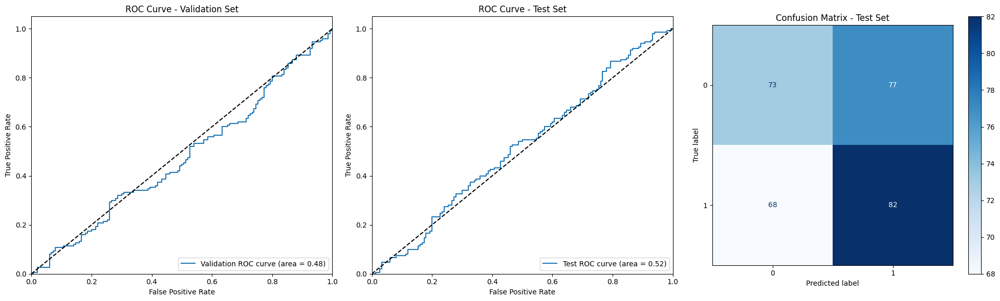

2024/09/23 06:43:07 INFO mlflow.tracking._tracking_service.client: 🏃 View run unique-kit-758 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/6191b1dfc90149d992845b9e34514e95.
2024/09/23 06:43:07 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Linear SVC with best hyperparameters...


2024/09/23 06:43:11 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Linear SVC - text_dl with best params {'C': 1, 'max_iter': 1000}:
Validation - Accuracy: 0.4767, Recall: 0.5200, F1 Score: 0.4984, AUC: 0.4728
Test - Accuracy: 0.5200, Recall: 0.5400, F1 Score: 0.5294, AUC: 0.5120
--------------------------------------------------------------------------------


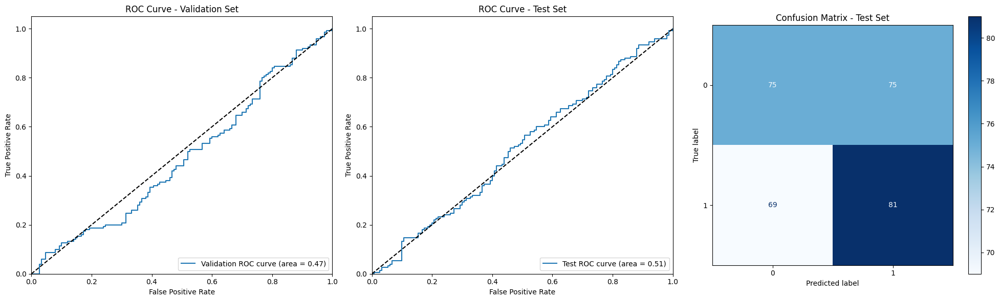

2024/09/23 06:43:12 INFO mlflow.tracking._tracking_service.client: 🏃 View run resilient-hound-507 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/82016f6c168741b480086bb218978fd8.
2024/09/23 06:43:12 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Decision Tree with best hyperparameters...


2024/09/23 06:43:16 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Decision Tree - text_dl with best params {'max_depth': 20, 'min_samples_split': 5}:
Validation - Accuracy: 0.4800, Recall: 0.5267, F1 Score: 0.5032, AUC: 0.4825
Test - Accuracy: 0.5133, Recall: 0.5000, F1 Score: 0.5068, AUC: 0.5106
--------------------------------------------------------------------------------


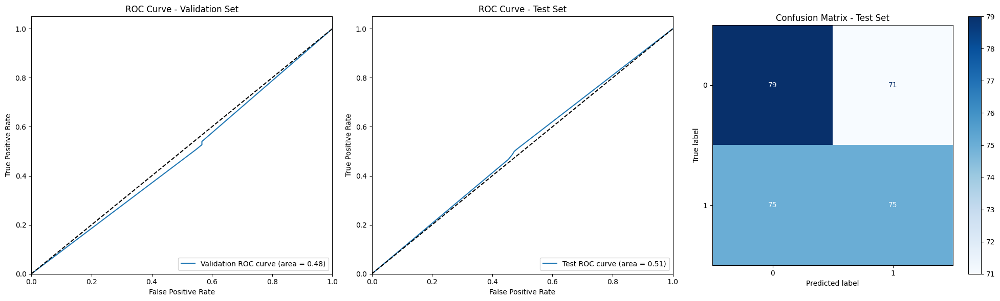

2024/09/23 06:43:17 INFO mlflow.tracking._tracking_service.client: 🏃 View run big-quail-635 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/05f4f10b9a2b414a83dd048e9ffdce76.
2024/09/23 06:43:17 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Random Forest with best hyperparameters...


2024/09/23 06:43:22 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Random Forest - text_dl with best params {'max_depth': None, 'min_samples_split': 10, 'n_estimators': 100}:
Validation - Accuracy: 0.5267, Recall: 0.5133, F1 Score: 0.5203, AUC: 0.5312
Test - Accuracy: 0.5300, Recall: 0.5200, F1 Score: 0.5253, AUC: 0.5172
--------------------------------------------------------------------------------


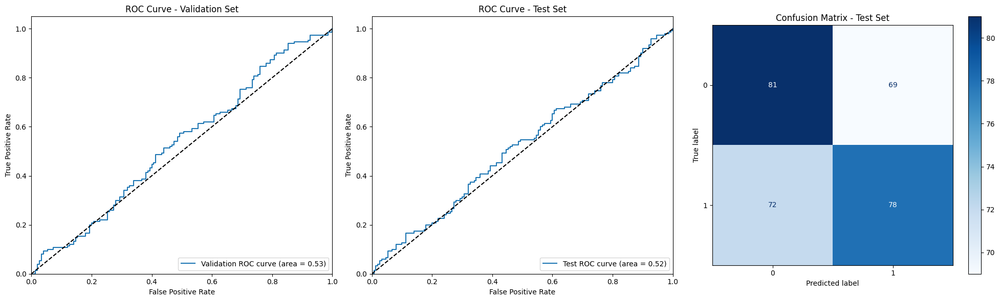

2024/09/23 06:43:23 INFO mlflow.tracking._tracking_service.client: 🏃 View run illustrious-rat-993 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/7628549097b1472ab6ce1004756574ed.
2024/09/23 06:43:23 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Extra Trees with best hyperparameters...


2024/09/23 06:43:28 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Extra Trees - text_dl with best params {'max_depth': 20, 'min_samples_split': 10, 'n_estimators': 300}:
Validation - Accuracy: 0.5133, Recall: 0.4867, F1 Score: 0.5000, AUC: 0.5174
Test - Accuracy: 0.4600, Recall: 0.4800, F1 Score: 0.4706, AUC: 0.4887
--------------------------------------------------------------------------------


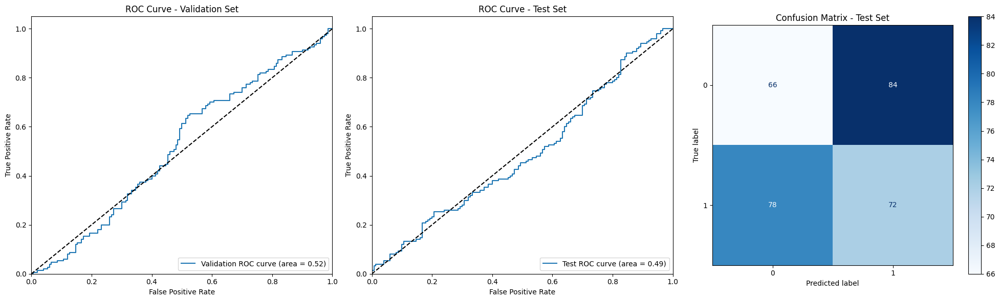

2024/09/23 06:43:28 INFO mlflow.tracking._tracking_service.client: 🏃 View run crawling-mink-403 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/c4b5b23e7bec490a97a8bebd381fbed7.
2024/09/23 06:43:28 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.
C:\Users\steph\anaconda3\envs\p7_bis\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Training AdaBoost with best hyperparameters...


2024/09/23 06:43:44 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model AdaBoost - text_dl with best params {'learning_rate': 1, 'n_estimators': 100}:
Validation - Accuracy: 0.5000, Recall: 0.5400, F1 Score: 0.5192, AUC: 0.5074
Test - Accuracy: 0.4700, Recall: 0.4800, F1 Score: 0.4752, AUC: 0.4778
--------------------------------------------------------------------------------


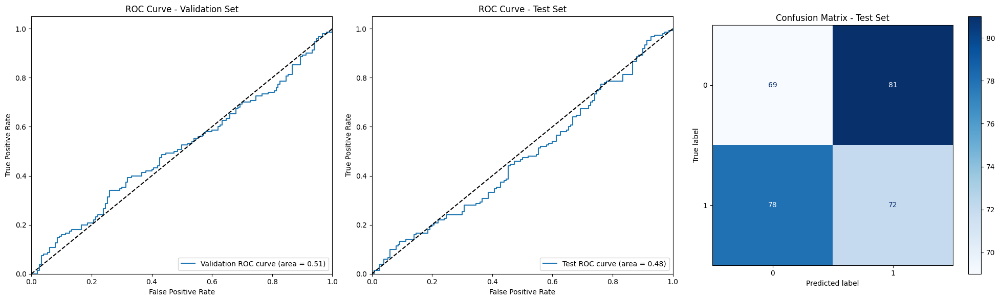

2024/09/23 06:43:45 INFO mlflow.tracking._tracking_service.client: 🏃 View run vaunted-snipe-419 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/0494b701295c4143a3400efc2a9cce82.
2024/09/23 06:43:45 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Gradient Boosting with best hyperparameters...


2024/09/23 06:47:22 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Gradient Boosting - text_dl with best params {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300}:
Validation - Accuracy: 0.4833, Recall: 0.4933, F1 Score: 0.4884, AUC: 0.4633
Test - Accuracy: 0.5300, Recall: 0.5467, F1 Score: 0.5377, AUC: 0.5262
--------------------------------------------------------------------------------


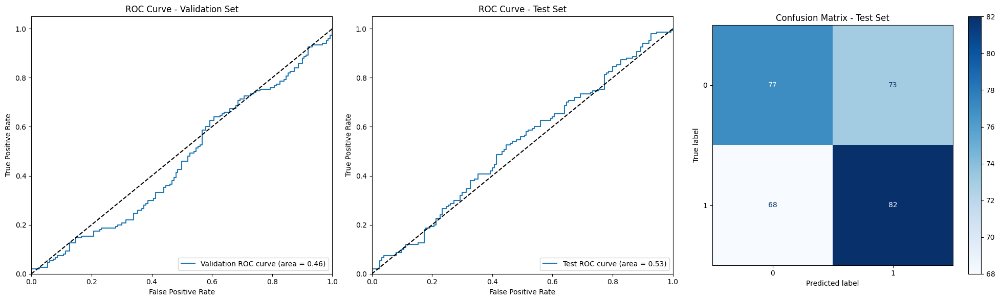

2024/09/23 06:47:23 INFO mlflow.tracking._tracking_service.client: 🏃 View run masked-shad-926 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/61e25b60a5994e5f9012285ecc04b67a.
2024/09/23 06:47:23 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training XGBoost with best hyperparameters...


2024/09/23 06:47:36 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model XGBoost - text_dl with best params {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 300}:
Validation - Accuracy: 0.5033, Recall: 0.4733, F1 Score: 0.4880, AUC: 0.4948
Test - Accuracy: 0.4967, Recall: 0.5400, F1 Score: 0.5176, AUC: 0.5031
--------------------------------------------------------------------------------


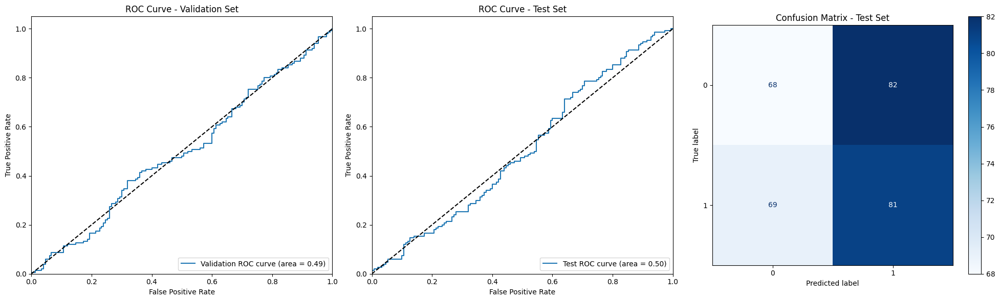

2024/09/23 06:47:36 INFO mlflow.tracking._tracking_service.client: 🏃 View run auspicious-snipe-35 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/11fd9917c5b542a185f7670b9d5135d9.
2024/09/23 06:47:36 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training LightGBM with best hyperparameters...
[LightGBM] [Info] Number of positive: 700, number of negative: 700
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 195840
[LightGBM] [Info] Number of data points in the train set: 1400, number of used features: 768
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


2024/09/23 06:47:46 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model LightGBM - text_dl with best params {'learning_rate': 0.1, 'n_estimators': 300, 'num_leaves': 31}:
Validation - Accuracy: 0.5200, Recall: 0.5200, F1 Score: 0.5200, AUC: 0.5062
Test - Accuracy: 0.4767, Recall: 0.4667, F1 Score: 0.4714, AUC: 0.5100
--------------------------------------------------------------------------------


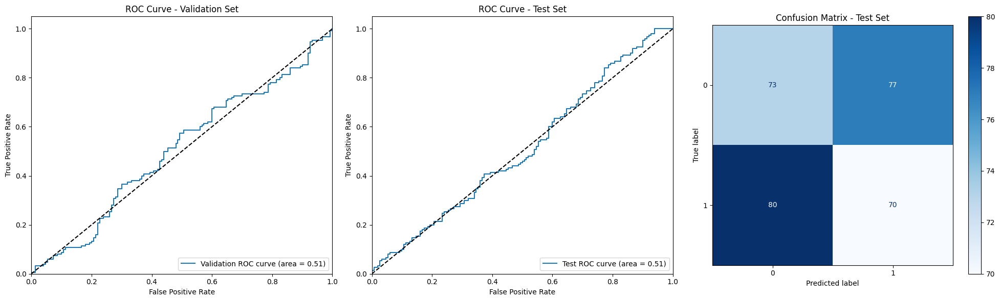

2024/09/23 06:47:47 INFO mlflow.tracking._tracking_service.client: 🏃 View run powerful-stoat-294 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/29fc29c194634f5b82e48681a351b712.
2024/09/23 06:47:47 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training CatBoost with best hyperparameters...
0:	learn: 0.6858450	total: 31.6ms	remaining: 3.13s
1:	learn: 0.6784200	total: 59.4ms	remaining: 2.91s
2:	learn: 0.6701585	total: 88.3ms	remaining: 2.86s
3:	learn: 0.6648051	total: 118ms	remaining: 2.83s
4:	learn: 0.6545210	total: 150ms	remaining: 2.84s
5:	learn: 0.6484099	total: 186ms	remaining: 2.91s
6:	learn: 0.6384445	total: 221ms	remaining: 2.93s
7:	learn: 0.6309310	total: 254ms	remaining: 2.92s
8:	learn: 0.6249535	total: 288ms	remaining: 2.91s
9:	learn: 0.6172694	total: 321ms	remaining: 2.89s
10:	learn: 0.6118424	total: 354ms	remaining: 2.87s
11:	learn: 0.6060374	total: 388ms	remaining: 2.84s
12:	learn: 0.6004423	total: 421ms	remaining: 2.82s
13:	learn: 0.5934796	total: 455ms	remaining: 2.79s
14:	learn: 0.5866452	total: 490ms	remaining: 2.77s
15:	learn: 0.5795638	total: 523ms	remaining: 2.75s
16:	learn: 0.5749702	total: 557ms	remaining: 2.72s
17:	learn: 0.5707333	total: 590ms	remaining: 2.69s
18:	learn: 0.5652566	total: 623ms	remainin

2024/09/23 06:47:54 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model CatBoost - text_dl with best params {'depth': 5, 'iterations': 100, 'learning_rate': 0.2}:
Validation - Accuracy: 0.5033, Recall: 0.4667, F1 Score: 0.4844, AUC: 0.5156
Test - Accuracy: 0.5533, Recall: 0.5600, F1 Score: 0.5563, AUC: 0.5613
--------------------------------------------------------------------------------


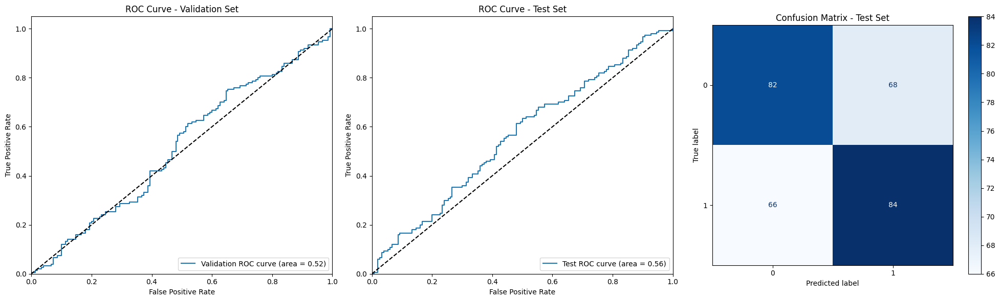

2024/09/23 06:47:55 INFO mlflow.tracking._tracking_service.client: 🏃 View run indecisive-carp-830 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/3309e834fa054cb3ba702af6555c0168.
2024/09/23 06:47:55 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training MLP Classifier with best hyperparameters...


2024/09/23 06:48:01 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model MLP Classifier - text_dl with best params {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (100, 50), 'solver': 'sgd'}:
Validation - Accuracy: 0.5400, Recall: 0.5600, F1 Score: 0.5490, AUC: 0.5317
Test - Accuracy: 0.5233, Recall: 0.5267, F1 Score: 0.5249, AUC: 0.5192
--------------------------------------------------------------------------------


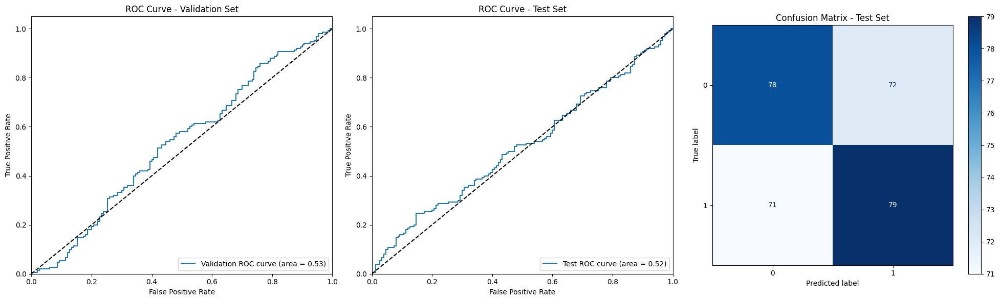

2024/09/23 06:48:02 INFO mlflow.tracking._tracking_service.client: 🏃 View run crawling-snake-315 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/e25bb3bf46cd4791acc6ab1eeb498e5d.
2024/09/23 06:48:02 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training K-Nearest Neighbors with best hyperparameters...


2024/09/23 06:48:05 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model K-Nearest Neighbors - text_dl with best params {'weights': 'distance', 'n_neighbors': 5, 'metric': 'euclidean'}:
Validation - Accuracy: 0.5000, Recall: 0.5267, F1 Score: 0.5130, AUC: 0.4798
Test - Accuracy: 0.5267, Recall: 0.5000, F1 Score: 0.5137, AUC: 0.5494
--------------------------------------------------------------------------------


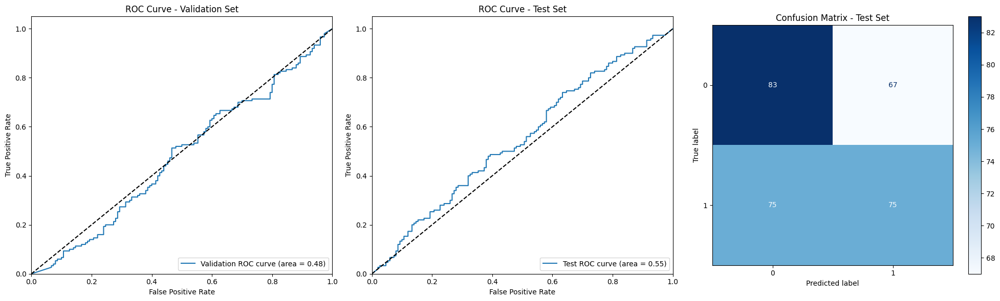

2024/09/23 06:48:06 INFO mlflow.tracking._tracking_service.client: 🏃 View run thoughtful-koi-264 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/ce93b439aa8948b395e0255bb1204f1b.
2024/09/23 06:48:06 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training SVM with RBF Kernel with best hyperparameters...


2024/09/23 06:48:10 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model SVM with RBF Kernel - text_dl with best params {'C': 0.1, 'gamma': 2, 'kernel': 'rbf'}:
Validation - Accuracy: 0.5100, Recall: 0.9800, F1 Score: 0.6667, AUC: 0.5199
Test - Accuracy: 0.5000, Recall: 0.9600, F1 Score: 0.6575, AUC: 0.5136
--------------------------------------------------------------------------------


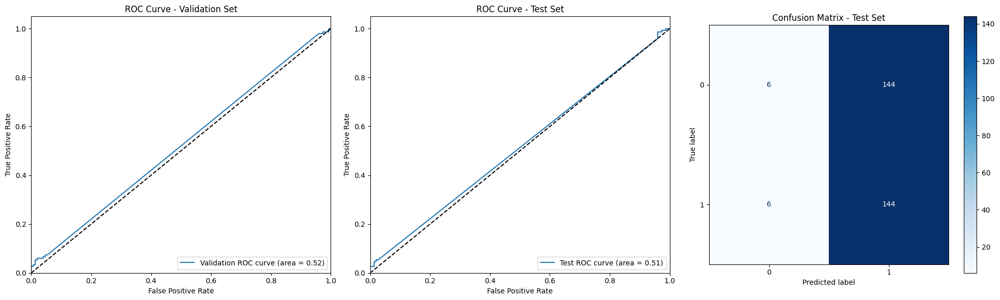

2024/09/23 06:48:11 INFO mlflow.tracking._tracking_service.client: 🏃 View run skittish-crane-47 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/03831025a8ec4aa6a3c63305e8835e36.
2024/09/23 06:48:11 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


In [103]:
for model, model_name in models:
    # Obtention des meilleurs hyperparamètres pour le modèle
    best_params = best_params_dict_bert[model_name]

    # Créer une nouvelle instance du modèle
    model = model.__class__()

    model.set_params(**best_params)
    
    print(f"Training {model_name} with best hyperparameters...")
    # Appel de la fonction avec le modèle, le nom du modèle et les meilleurs hyperparamètres
    track_model_with_mlflow(
        text_column=text_column, 
        model=model, 
        model_name=model_name, 
        best_params=best_params,
        word_embedding="BERT",
        X_train_embedding=X_train_bert, 
        y_train=y_train_sample, 
        X_val_embedding=X_val_bert, 
        y_val=y_val_sample, 
        X_test_embedding=X_test_bert, 
        y_test=y_test_sample
    )

### 8.5.c. Test du modèle Bidirectional LSTM

Epoch 1/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 21s 417ms/step - accuracy: 0.4901 - loss: 0.6950 - val_accuracy: 0.5000 - val_loss: 0.6937
Epoch 2/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 15s 349ms/step - accuracy: 0.4940 - loss: 0.6945 - val_accuracy: 0.5267 - val_loss: 0.6931
Epoch 3/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 15s 348ms/step - accuracy: 0.5123 - loss: 0.6939 - val_accuracy: 0.5033 - val_loss: 0.6923
Epoch 4/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 15s 349ms/step - accuracy: 0.5170 - loss: 0.6911 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 5/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 15s 334ms/step - accuracy: 0.5275 - loss: 0.6894 - val_accuracy: 0.5167 - val_loss: 0.6930
Epoch 6/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 15s 338ms/step - accuracy: 0.5673 - loss: 0.6850 - val_accuracy: 0.5067 - val_loss: 0.6935
Epoch 7/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 13s 291ms/step - accuracy: 0.5150 - loss: 0.6945 - val_accuracy: 0.4833 - val_loss: 0.6934
Epoch 8/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 13s 287ms/step - accuracy: 0.5510 - loss: 0.6868 - val_accu

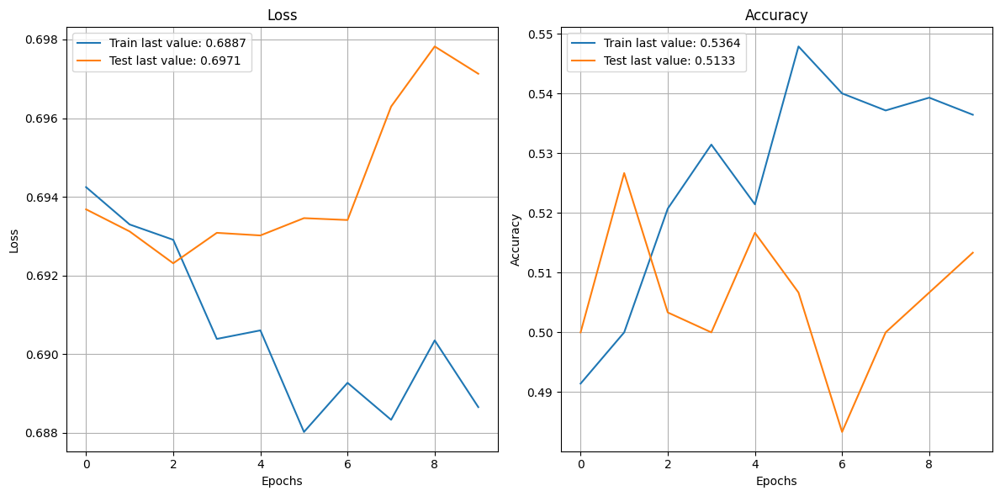

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step


2024/09/23 06:50:43 WARNING mlflow.keras.save: You are saving a Keras model without specifying model signature.
2024/09/23 06:50:53 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Validation - Accuracy: 0.5133, Recall: 0.4600, F1 Score: 0.4859, AUC: 0.4888
Test - Accuracy: 0.5367, Recall: 0.5600, F1 Score: 0.5472, AUC: 0.5161
--------------------------------------------------------------------------------


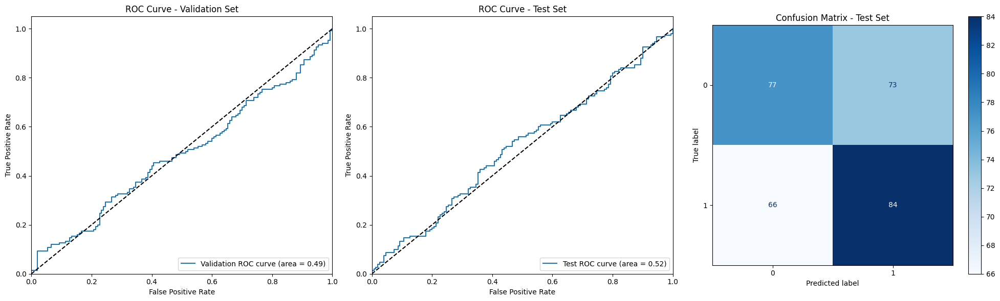

2024/09/23 06:50:54 INFO mlflow.tracking._tracking_service.client: 🏃 View run nimble-roo-185 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/dfc10f15e4e540ce99588d4eadd821cf.
2024/09/23 06:50:54 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


In [104]:
# Appel de la fonction avec les données
track_model_with_mlflow_for_bidirectional_lstm(
    text_column="text", 
    vocab_size=5000, 
    embedding_dim=64, 
    word_embedding="BERT",
    input_length=X_train_bert.shape[1],
    X_train_embedding=X_train_bert, 
    y_train=y_train_sample, 
    X_val_embedding=X_val_bert, 
    y_val=y_val_sample, 
    X_test_embedding=X_test_bert, 
    y_test=y_test_sample
)

## 8.6. Avec USE

In [105]:
# Chargement du modèle USE
embed = hub.load("https://www.kaggle.com/models/google/universal-sentence-encoder/TensorFlow2/universal-sentence-encoder/2")

In [106]:
# Encodage des jeux de données
X_train_use = embed(X_train)
X_val_use = embed(X_val)
X_test_use = embed(X_test)

# Normalisation des données
scaler = StandardScaler()
X_train_use = scaler.fit_transform(X_train_use)
X_val_use = scaler.transform(X_val_use)
X_test_use = scaler.transform(X_test_use)

In [107]:
# Encodage des jeux de données
X_train_use_sample = embed(X_train_sample)
X_val_use_sample = embed(X_val_sample)
X_test_use_sample = embed(X_test_sample)

# Normalisation des données
scaler = StandardScaler()
X_train_use_sample = scaler.fit_transform(X_train_use_sample)
X_val_use_sample = scaler.transform(X_val_use_sample)
X_test_use_sample = scaler.transform(X_test_use_sample)

### 8.6.a. Gestion des hyperparamètres

In [109]:
# Recherche d'hyperparamètres pour chaque modèle
best_params_dict_use = {}
for model, model_name in models:
    param_grid = param_grids.get(model_name)
    
    print(f"Performing GridSearchCV for {model_name}...")
    best_model, best_params = perform_grid_search(model, param_grid, X_train_use_sample, y_train_sample)
    best_params_dict_use[model_name] = best_params

Performing GridSearchCV for Logistic Regression...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Performing GridSearchCV for Linear SVC...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Performing GridSearchCV for Decision Tree...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Performing GridSearchCV for Random Forest...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for Extra Trees...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for AdaBoost...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Performing GridSearchCV for Gradient Boosting...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Performing GridSearchCV for LightGBM...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
[LightGBM] [Info] Number of positive: 700, number of 

### 8.6.b. Test des modèles

Training Logistic Regression with best hyperparameters...


2024/09/24 00:08:08 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Logistic Regression - text_dl with best params {'C': 0.01, 'solver': 'lbfgs'}:
Validation - Accuracy: 0.7690, Recall: 0.7727, F1 Score: 0.7698, AUC: 0.8523
Test - Accuracy: 0.7850, Recall: 0.7827, F1 Score: 0.7845, AUC: 0.8656
--------------------------------------------------------------------------------


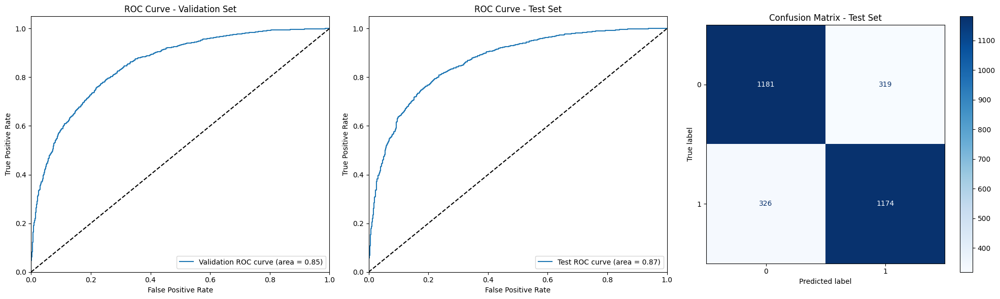

2024/09/24 00:08:09 INFO mlflow.tracking._tracking_service.client: 🏃 View run funny-donkey-836 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/1933cc9fd5014e088f7cfc30e37f89b4.
2024/09/24 00:08:09 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Linear SVC with best hyperparameters...


2024/09/24 00:08:13 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Linear SVC - text_dl with best params {'C': 0.01, 'max_iter': 1000}:
Validation - Accuracy: 0.7657, Recall: 0.7680, F1 Score: 0.7662, AUC: 0.8492
Test - Accuracy: 0.7853, Recall: 0.7793, F1 Score: 0.7840, AUC: 0.8633
--------------------------------------------------------------------------------


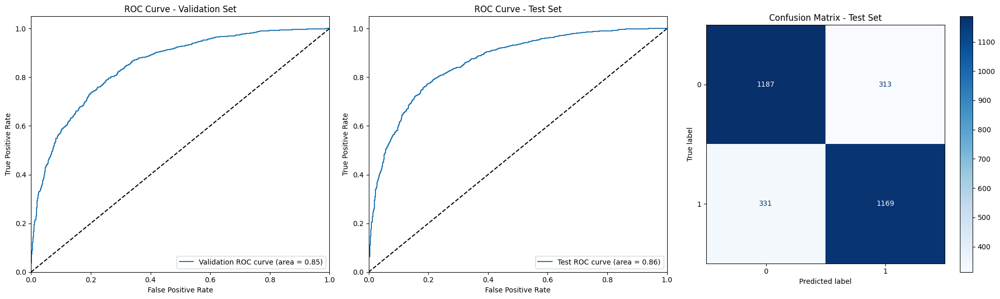

2024/09/24 00:08:14 INFO mlflow.tracking._tracking_service.client: 🏃 View run stately-crow-472 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/0eb722ec36a24c92bc260e65d4375a37.
2024/09/24 00:08:14 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Decision Tree with best hyperparameters...


2024/09/24 00:08:25 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Decision Tree - text_dl with best params {'max_depth': 10, 'min_samples_split': 10}:
Validation - Accuracy: 0.6863, Recall: 0.6600, F1 Score: 0.6779, AUC: 0.6967
Test - Accuracy: 0.7067, Recall: 0.6960, F1 Score: 0.7035, AUC: 0.7142
--------------------------------------------------------------------------------


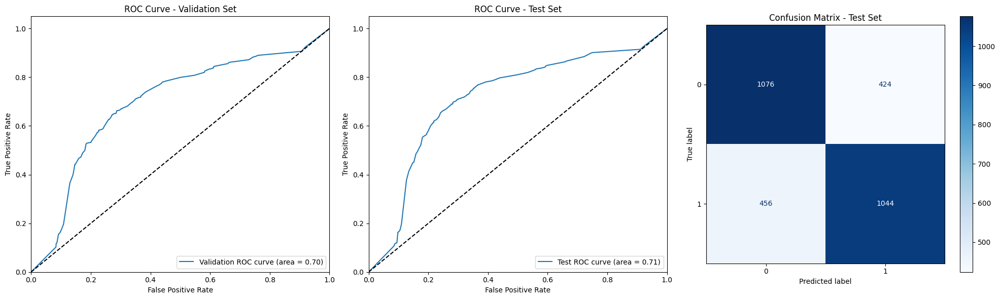

2024/09/24 00:08:25 INFO mlflow.tracking._tracking_service.client: 🏃 View run worried-bear-275 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/20a0fcfa404247b1b5f6ab2260412546.
2024/09/24 00:08:25 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Random Forest with best hyperparameters...


2024/09/24 00:09:13 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Random Forest - text_dl with best params {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 200}:
Validation - Accuracy: 0.7523, Recall: 0.7407, F1 Score: 0.7494, AUC: 0.8373
Test - Accuracy: 0.7637, Recall: 0.7520, F1 Score: 0.7609, AUC: 0.8438
--------------------------------------------------------------------------------


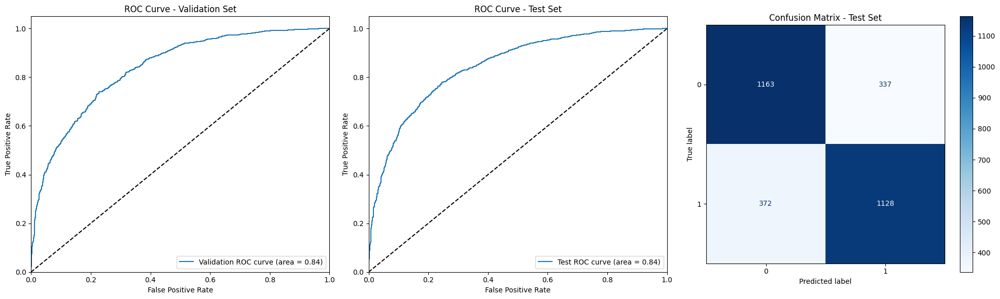

2024/09/24 00:09:14 INFO mlflow.tracking._tracking_service.client: 🏃 View run skittish-conch-650 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/d6f93582728945fab633d2673e1a85f2.
2024/09/24 00:09:14 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Extra Trees with best hyperparameters...


2024/09/24 00:09:33 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Extra Trees - text_dl with best params {'max_depth': 20, 'min_samples_split': 10, 'n_estimators': 300}:
Validation - Accuracy: 0.7557, Recall: 0.7373, F1 Score: 0.7511, AUC: 0.8427
Test - Accuracy: 0.7700, Recall: 0.7513, F1 Score: 0.7656, AUC: 0.8488
--------------------------------------------------------------------------------


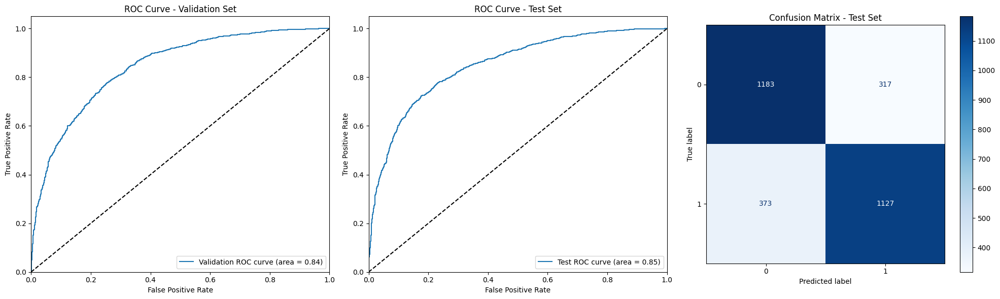

2024/09/24 00:09:35 INFO mlflow.tracking._tracking_service.client: 🏃 View run amusing-quail-623 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/b087203fa54d49c1bc22a9467271291d.
2024/09/24 00:09:35 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.
C:\Users\steph\anaconda3\envs\p7_bis\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Training AdaBoost with best hyperparameters...


2024/09/24 00:13:02 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model AdaBoost - text_dl with best params {'learning_rate': 1, 'n_estimators': 200}:
Validation - Accuracy: 0.7437, Recall: 0.7480, F1 Score: 0.7448, AUC: 0.8231
Test - Accuracy: 0.7570, Recall: 0.7520, F1 Score: 0.7558, AUC: 0.8424
--------------------------------------------------------------------------------


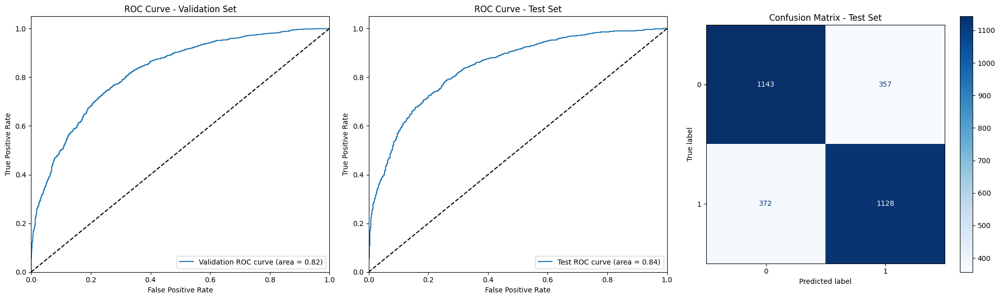

2024/09/24 00:13:03 INFO mlflow.tracking._tracking_service.client: 🏃 View run sincere-doe-780 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/185cc0141c1140c8b45be2c35b293a1b.
2024/09/24 00:13:03 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training Gradient Boosting with best hyperparameters...


2024/09/24 00:21:53 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model Gradient Boosting - text_dl with best params {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200}:
Validation - Accuracy: 0.7587, Recall: 0.7540, F1 Score: 0.7575, AUC: 0.8436
Test - Accuracy: 0.7793, Recall: 0.7813, F1 Score: 0.7798, AUC: 0.8556
--------------------------------------------------------------------------------


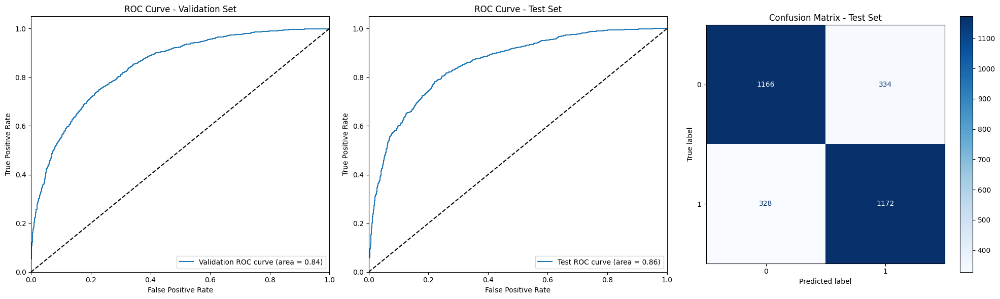

2024/09/24 00:21:54 INFO mlflow.tracking._tracking_service.client: 🏃 View run delightful-bass-718 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/1c44f7b169934f608e0540e4c21eb70e.
2024/09/24 00:21:54 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training XGBoost with best hyperparameters...


2024/09/24 00:22:12 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model XGBoost - text_dl with best params {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 300}:
Validation - Accuracy: 0.7583, Recall: 0.7513, F1 Score: 0.7566, AUC: 0.8419
Test - Accuracy: 0.7717, Recall: 0.7693, F1 Score: 0.7711, AUC: 0.8545
--------------------------------------------------------------------------------


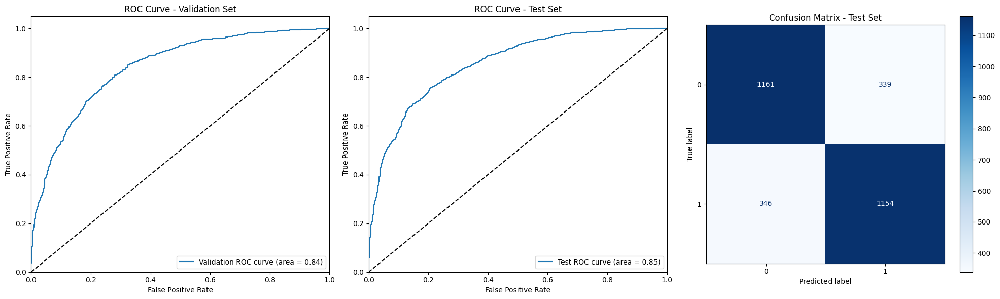

2024/09/24 00:22:13 INFO mlflow.tracking._tracking_service.client: 🏃 View run delightful-gnat-157 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/d3041f319e3649089a01f457c454f1cd.
2024/09/24 00:22:13 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training LightGBM with best hyperparameters...
[LightGBM] [Info] Number of positive: 7000, number of negative: 7000
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 130560
[LightGBM] [Info] Number of data points in the train set: 14000, number of used features: 512
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


2024/09/24 00:22:24 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model LightGBM - text_dl with best params {'learning_rate': 0.1, 'n_estimators': 300, 'num_leaves': 31}:
Validation - Accuracy: 0.7613, Recall: 0.7533, F1 Score: 0.7594, AUC: 0.8469
Test - Accuracy: 0.7787, Recall: 0.7807, F1 Score: 0.7791, AUC: 0.8622
--------------------------------------------------------------------------------


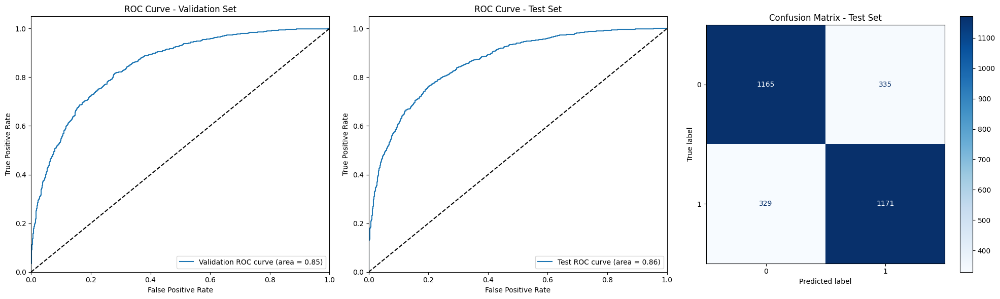

2024/09/24 00:22:25 INFO mlflow.tracking._tracking_service.client: 🏃 View run agreeable-owl-91 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/417797ae4c5d48fdb8add90a5ecd6332.
2024/09/24 00:22:25 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training CatBoost with best hyperparameters...
0:	learn: 0.6429441	total: 42.8ms	remaining: 12.8s
1:	learn: 0.6089958	total: 74.7ms	remaining: 11.1s
2:	learn: 0.5835168	total: 105ms	remaining: 10.4s
3:	learn: 0.5659503	total: 139ms	remaining: 10.3s
4:	learn: 0.5519845	total: 173ms	remaining: 10.2s
5:	learn: 0.5418150	total: 205ms	remaining: 10s
6:	learn: 0.5338647	total: 239ms	remaining: 10s
7:	learn: 0.5277252	total: 274ms	remaining: 10s
8:	learn: 0.5208056	total: 310ms	remaining: 10s
9:	learn: 0.5159417	total: 344ms	remaining: 9.96s
10:	learn: 0.5111105	total: 378ms	remaining: 9.92s
11:	learn: 0.5067330	total: 413ms	remaining: 9.91s
12:	learn: 0.5025498	total: 447ms	remaining: 9.88s
13:	learn: 0.4991943	total: 481ms	remaining: 9.83s
14:	learn: 0.4960750	total: 518ms	remaining: 9.85s
15:	learn: 0.4936653	total: 553ms	remaining: 9.81s
16:	learn: 0.4912974	total: 587ms	remaining: 9.78s
17:	learn: 0.4888541	total: 623ms	remaining: 9.76s
18:	learn: 0.4866157	total: 661ms	remaining: 9.77s


2024/09/24 00:22:42 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model CatBoost - text_dl with best params {'depth': 5, 'iterations': 300, 'learning_rate': 0.2}:
Validation - Accuracy: 0.7573, Recall: 0.7420, F1 Score: 0.7536, AUC: 0.8364
Test - Accuracy: 0.7660, Recall: 0.7600, F1 Score: 0.7646, AUC: 0.8496
--------------------------------------------------------------------------------


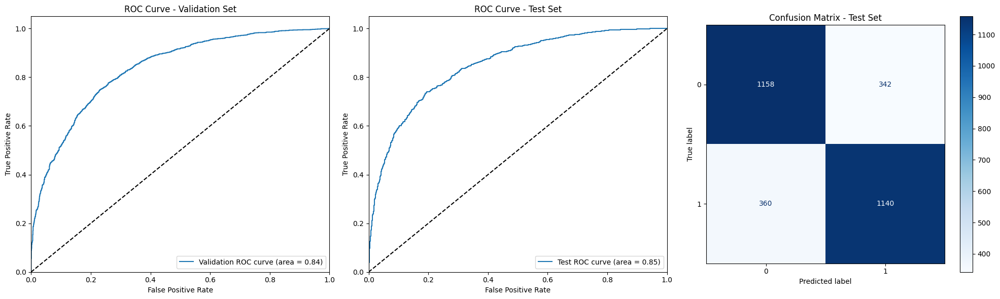

2024/09/24 00:22:43 INFO mlflow.tracking._tracking_service.client: 🏃 View run valuable-shark-659 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/d5bc0dc4b27141c68ba52ddec1ac0976.
2024/09/24 00:22:43 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training MLP Classifier with best hyperparameters...


2024/09/24 00:23:14 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model MLP Classifier - text_dl with best params {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (100,), 'solver': 'sgd'}:
Validation - Accuracy: 0.7380, Recall: 0.7167, F1 Score: 0.7323, AUC: 0.8134
Test - Accuracy: 0.7600, Recall: 0.7620, F1 Score: 0.7605, AUC: 0.8391
--------------------------------------------------------------------------------


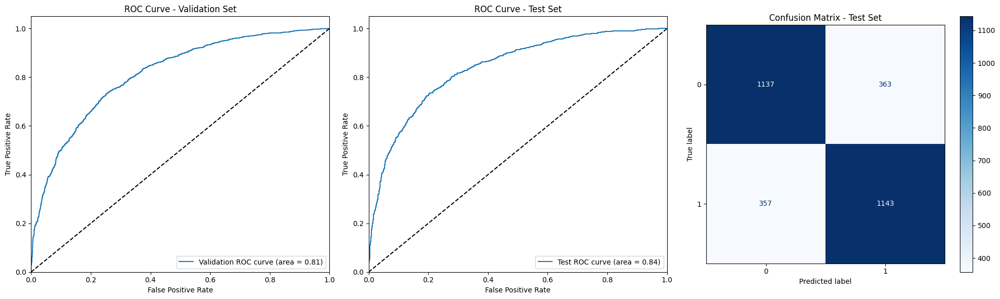

2024/09/24 00:23:15 INFO mlflow.tracking._tracking_service.client: 🏃 View run judicious-bird-450 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/a2d119ff76db4e05a99c56212b036492.
2024/09/24 00:23:15 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training K-Nearest Neighbors with best hyperparameters...


2024/09/24 00:23:20 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model K-Nearest Neighbors - text_dl with best params {'weights': 'distance', 'n_neighbors': 9, 'metric': 'euclidean'}:
Validation - Accuracy: 0.7160, Recall: 0.6653, F1 Score: 0.7008, AUC: 0.7948
Test - Accuracy: 0.7307, Recall: 0.7000, F1 Score: 0.7221, AUC: 0.8105
--------------------------------------------------------------------------------


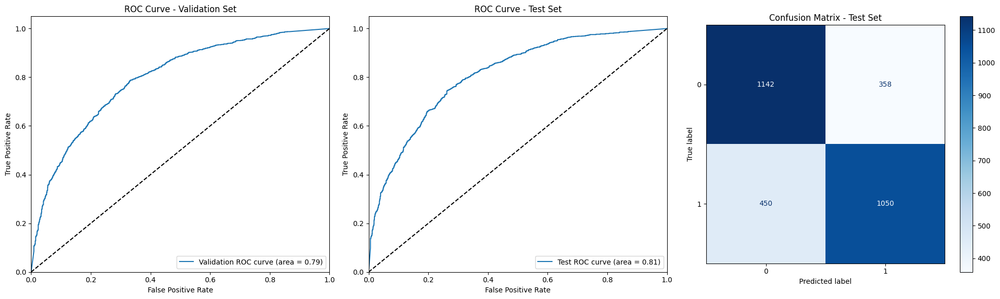

2024/09/24 00:23:22 INFO mlflow.tracking._tracking_service.client: 🏃 View run efficient-ant-628 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/646c5bc5f65141d1886fe012dd6b75e3.
2024/09/24 00:23:22 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


Training SVM with RBF Kernel with best hyperparameters...


2024/09/24 00:25:13 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Model SVM with RBF Kernel - text_dl with best params {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}:
Validation - Accuracy: 0.7720, Recall: 0.7807, F1 Score: 0.7740, AUC: 0.8516
Test - Accuracy: 0.7780, Recall: 0.7793, F1 Score: 0.7783, AUC: 0.8599
--------------------------------------------------------------------------------


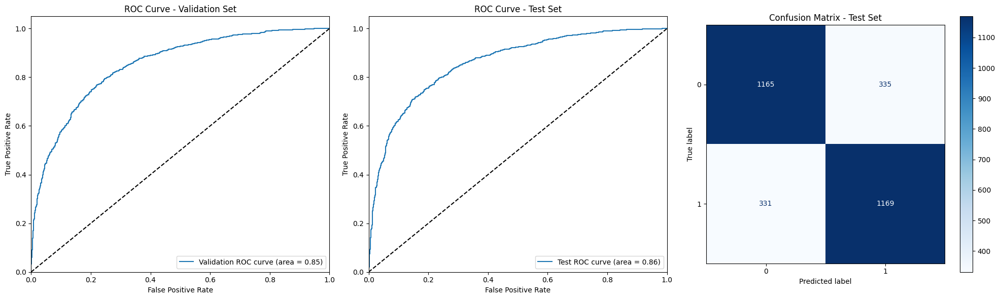

2024/09/24 00:25:14 INFO mlflow.tracking._tracking_service.client: 🏃 View run thoughtful-pig-728 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/dca405e86be34b2baf717b801cbd4f30.
2024/09/24 00:25:14 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


In [110]:
for model, model_name in models:
    # Obtention des meilleurs hyperparamètres pour le modèle
    best_params = best_params_dict_use[model_name]

    # Créer une nouvelle instance du modèle
    model = model.__class__()

    model.set_params(**best_params)
    
    print(f"Training {model_name} with best hyperparameters...")
    # Appel de la fonction avec le modèle, le nom du modèle et les meilleurs hyperparamètres
    track_model_with_mlflow(
        text_column=text_column, 
        model=model, 
        model_name=model_name, 
        best_params=best_params,
        word_embedding="USE",
        X_train_embedding=X_train_use, 
        y_train=y_train, 
        X_val_embedding=X_val_use, 
        y_val=y_val, 
        X_test_embedding=X_test_use, 
        y_test=y_test
    )

### 8.6.c. Test du modèle Bidirectional LSTM

Epoch 1/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 15s 211ms/step - accuracy: 0.5009 - loss: 0.6937 - val_accuracy: 0.5000 - val_loss: 0.6936
Epoch 2/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.4619 - loss: 0.6954 - val_accuracy: 0.5100 - val_loss: 0.6922
Epoch 3/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.5408 - loss: 0.6897 - val_accuracy: 0.5267 - val_loss: 0.6928
Epoch 4/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.5828 - loss: 0.6820 - val_accuracy: 0.5000 - val_loss: 0.6976
Epoch 5/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 9s 198ms/step - accuracy: 0.5775 - loss: 0.6747 - val_accuracy: 0.5233 - val_loss: 0.6940
Epoch 6/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 8s 183ms/step - accuracy: 0.5781 - loss: 0.6728 - val_accuracy: 0.5233 - val_loss: 0.6955
Epoch 7/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 8s 180ms/step - accuracy: 0.5842 - loss: 0.6689 - val_accuracy: 0.5233 - val_loss: 0.6907
Epoch 8/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 8s 180ms/step - accuracy: 0.5853 - loss: 0.6729 - val_accuracy: 0

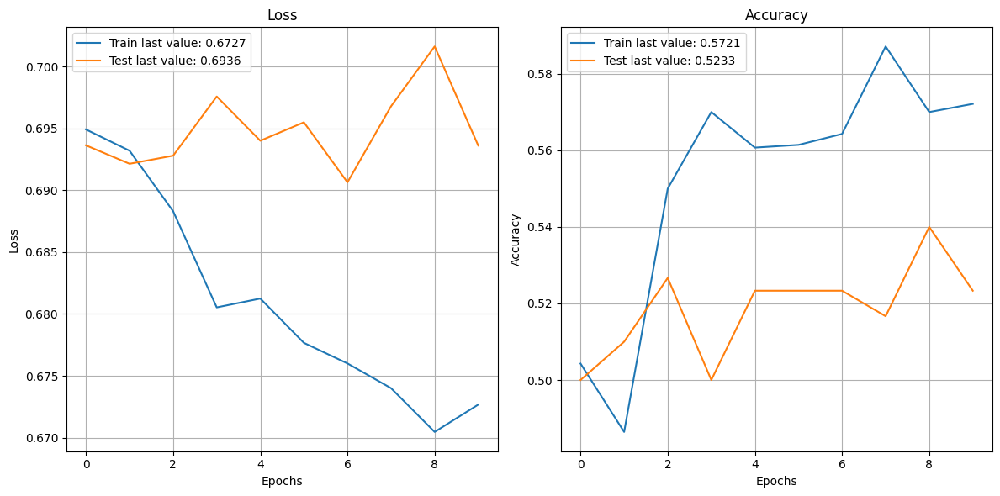

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step


2024/09/24 00:26:48 WARNING mlflow.keras.save: You are saving a Keras model without specifying model signature.
2024/09/24 00:26:58 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Validation - Accuracy: 0.5233, Recall: 0.4333, F1 Score: 0.4762, AUC: 0.5401
Test - Accuracy: 0.5567, Recall: 0.4400, F1 Score: 0.4981, AUC: 0.5961
--------------------------------------------------------------------------------


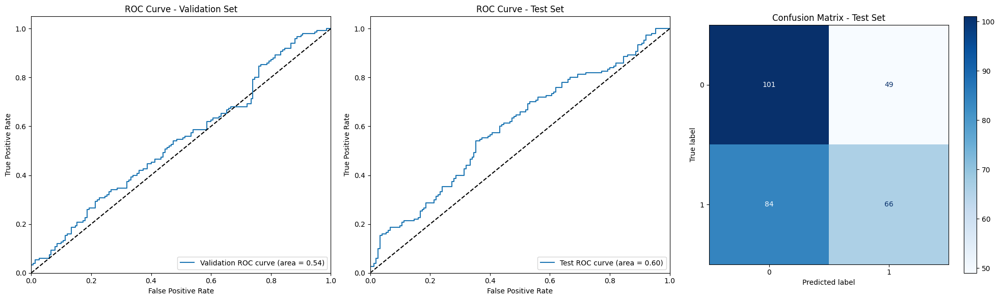

2024/09/24 00:26:59 INFO mlflow.tracking._tracking_service.client: 🏃 View run agreeable-pug-929 at: http://127.0.0.1:5050/#/experiments/878731590308524075/runs/d09bd58f17db4a1a9efa33a3f2941c9f.
2024/09/24 00:26:59 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://127.0.0.1:5050/#/experiments/878731590308524075.


In [111]:
# Appel de la fonction avec les données
track_model_with_mlflow_for_bidirectional_lstm(
    text_column="text", 
    vocab_size=5000, 
    embedding_dim=64, 
    word_embedding="USE",
    input_length=X_train_use_sample.shape[1],
    X_train_embedding=X_train_use_sample, 
    y_train=y_train_sample, 
    X_val_embedding=X_val_use_sample,
    y_val=y_val_sample,
    X_test_embedding=X_test_use_sample,
    y_test=y_test_sample
)

# 9. Résultats

*   **test_accuracy** : Le meilleur résultat est obtenu avec **USE** et **Linear SVC** : ***0.7853***.
*   **test_auc** : Le meilleur résultat est obtenu avec **USE** et **Logistic Regression** : ***0.8656***.
*   **test_f1** : Le meilleur résultat est obtenu avec **USE** et **Logistic Regression** : ***0.7845***.
*   **test_recall** : Le meilleur résultat est obtenu avec **Tf-idf** et **K-Nearest Neighbors** : ***0.98***.

*   **val_accuracy** : Le meilleur résultat est obtenu avec **USE** et **SVM with RBF Kernel** : ***0.772***.
*   **val_auc** : Le meilleur résultat est obtenu avec **USE** et **Logistic Regression** : ***0.8523***.
*   **val_f1** : Le meilleur résultat est obtenu avec **USE** et **SVM with RBF Kernel** : ***0.774***.
*   **val_recall** : Le meilleur résultat est obtenu avec **BERT** et **SVM with RBF Kernel** : ***0.98***.

In [113]:
# Liste des algorithmes et leurs rangs dans chaque métrique
data = {
    "Algorithm": ["Linear SVC", "Logistic Regression", "Gradient Boosting", "LightGBM", "SVM with RBF Kernel"],
    "test_accuracy_rank": [1, 2, 3, 4, 5],
    "test_auc_rank": [2, 1, 5, 3, 4],
    "test_f1_rank": [2, 1, 3, 4, 5],
    "val_accuracy_rank": [3, 2, 5, 4, 1],
    "val_auc_rank": [3, 1, 5, 4, 2],
    "val_f1_rank": [3, 2, 5, 4, 1],
}

# Convertir les données en DataFrame
df_results = pd.DataFrame(data)

# Recalculer le score total en prenant la moyenne des rangs (pour éviter que les valeurs manquantes faussent le classement)
df_results["average_rank"] = df_results[['test_accuracy_rank', 'test_auc_rank', 'test_f1_rank', 'val_accuracy_rank', 'val_auc_rank', 'val_f1_rank']].mean(axis=1)

# Calculer le score global (somme des rangs)
df_results["total_rank"] = df_results[['test_accuracy_rank', 'test_auc_rank', 'test_f1_rank', 'val_accuracy_rank', 'val_auc_rank', 'val_f1_rank']].sum(axis=1)

In [114]:
# Trier les algorithmes
#df_results_sorted = df_results.sort_values(by="average_rank").reset_index(drop=True)
df_results_sorted = df_results.sort_values(by="total_rank").reset_index(drop=True)
df_results_sorted

,Algorithm,test_accuracy_rank,test_auc_rank,test_f1_rank,val_accuracy_rank,val_auc_rank,val_f1_rank,average_rank,total_rank
0,Logistic Regression,2,1,1,2,1,2,1.500000,9
1,Linear SVC,1,2,2,3,3,3,2.333333,14
2,SVM with RBF Kernel,5,4,5,1,2,1,3.000000,18
3,LightGBM,4,3,4,4,4,4,3.833333,23
4,Gradient Boosting,3,5,3,5,5,5,4.333333,26


On va donc utiliser l'embedding USE avec l'algorithme "Logistic Regression".